In [1]:
# This script is for computing the disorder score per each residue in kinases proteins and their orthologs
# retrieving the scores from MobiDB-lite API

In [1]:
import pandas as pd
import requests
import json
import pyranges as pr
from matplotlib_venn import venn2
import matplotlib.pyplot as plt
import seaborn as sns
from statannotations.Annotator import Annotator
from itertools import combinations
import re

In [2]:
# Dataset with all proteins
#msa_regions_pdbs = pd.read_csv('../datasets/msa_regions_pdbs.tsv', sep= '\t')
all_msas = pd.read_csv('../datasets/all_msas.tsv', sep= '\t')
all_msas = all_msas[all_msas.msa.str.endswith("_60")]
# This dataset contains the CRE annotation in all the ortholog sequences
region_to_transfer = pd.read_csv('../homology_transfer/pipeline_MSA_uniprot/data_snake/12_region_to_transfer.txt', sep= " ")
region_to_transfer = region_to_transfer[(region_to_transfer.full_identity == '60') & (region_to_transfer.region_identity == '60')]

In [3]:
set1 = set(region_to_transfer.uniprot_acc.unique()) # unique proteins in our orthologs dataset
set2 = set(all_msas.uniprot.unique())
all = set1.union(set2)
all = list(all)

### download scores

In [5]:
# uniprots = ""
# uniprots = ','.join(all)

In [4]:
# uniprots = ""
# for i in all:
#     uniprots = uniprots + i + ","
# uniprots = uniprots.rstrip(",")

In [4]:
# grouped_strings = []
# for i in range(0, len(all), 20):
#     group = all[i:i+20]
#     group_string = ",".join(group)
#     grouped_strings.append(group_string)

In [8]:
# # Empty df to concat the new data
# # cols to keep
# columns = ['acc', 'length', 'organism', 'ncbi_taxon_id', 'sequence',
#        'homology_domain_pfam', 'homology_domain_merge',
#        'prediction_disorder_mobidb_lite', 'homology_disorder_disprot']
# mobidb_lite = pd.DataFrame() #columns= columns

# i= 0
# errors = {}
# for chunk in grouped_strings: 
#     # API download mobidb
#     to_download = f'https://mobidb.bio.unipd.it/api/download?acc={chunk}&projection='
#     # Request
#     response = requests.get(to_download)

#     if response.status_code == 200:
#         try:
#             # Replace blank spaces with a comma so json loads can read it properly
#             json_data = response.text.replace("}\n{", "},{")
#             j_text = "[" + json_data + "]"
#             # Parse the json string
#             query = json.loads(j_text)

#             # To dataframe
#             df = pd.DataFrame(query)
#             # Keep cols of interest
#             df.columns = df.columns.str.replace("-", "_")
#             #df = df[columns]
            
#             # Add the new data
#             mobidb_lite = pd.concat([mobidb_lite, df])

#             i += 1
#             print(f"chunk {i} downloaded and parsed")
        
#         except BaseException as e:
#             print(f'an exception occured in chunk {i}: {e}')
#             continue

#     else:
#         errors[i] = to_download
#         print(f"error with {to_download}")

In [9]:
#mobidb_lite.acc.nunique()

In [10]:
# # Keep cols of interest
# columns = ['acc', 'length', 'organism', 'ncbi_taxon_id', 'sequence',
#        'homology_domain_pfam', 'homology_domain_merge',
#        'prediction_disorder_mobidb_lite', 'homology_disorder_disprot']
# to_keep = mobidb_lite[columns]
# to_keep

In [11]:
#to_keep.to_csv('../datasets/mobidb_lite_orthologs.tsv', sep= '\t', index= False)

Read it

In [3]:
mobidb_lite = pd.read_csv('../datasets/mobidb_lite_orthologs.tsv', sep= '\t')
mobidb_lite = mobidb_lite.drop(columns= 'Unnamed: 0')

### Organisms

In [13]:
organisms = mobidb_lite[['acc', 'organism', 'ncbi_taxon_id']].drop_duplicates()
organisms.organism.value_counts()[:20]

Pan troglodytes (Chimpanzee)                                                 116
Cercocebus atys (Sooty mangabey) (Cercocebus torquatus atys)                 108
Saimiri boliviensis boliviensis (Bolivian squirrel monkey)                   108
Aotus nancymaae (Ma's night monkey)                                          104
Colobus angolensis palliatus (Peters' Angolan colobus)                       104
Propithecus coquereli (Coquerel's sifaka) (Propithecus verreauxcoquereli)    102
Macaca nemestrina (Pig-tailed macaque)                                       102
Pan paniscus (Pygmy chimpanzee) (Bonobo)                                     101
Mandrillus leucophaeus (Drill) (Papio leucophaeus)                           100
Rhinopithecus roxellana (Golden snub-nosed monkey) (Pygathrix roxellana)      98
Rhinopithecus bieti (Black snub-nosed monkey) (Pygathrix bieti)               97
Bos taurus (Bovine)                                                           94
Homo sapiens (Human)        

In [14]:
import re

In [17]:
organisms.organism

0       Ooceraea biroi (Clonal raider ant) (Cerapachys...
1         Poecilia formosa (Amazon molly) (Limia formosa)
2             Penicillium expansum (Blue mold rot fungus)
3                               Oryza punctata (Red rice)
4       Colinus virginianus (Northern bobwhite) (Tetra...
                              ...                        
8406    Otolemur garnettii (Small-eared galago) (Garne...
8407    Pongo abelii (Sumatran orangutan) (Pongo pygma...
8408    Mustela putorius furo (European domestic ferre...
8409    Ficedula albicollis (Collared flycatcher) (Mus...
8410       Phaseolus vulgaris (Kidney bean) (French bean)
Name: organism, Length: 8411, dtype: object

In [49]:
# Drop everything after ()
organisms.organism.apply(lambda x: re.findall("^(.+) \(.+\)", x))

0                    [Ooceraea biroi (Clonal raider ant)]
1                       [Poecilia formosa (Amazon molly)]
2                                  [Penicillium expansum]
3                                        [Oryza punctata]
4               [Colinus virginianus (Northern bobwhite)]
                              ...                        
8406            [Otolemur garnettii (Small-eared galago)]
8407                  [Pongo abelii (Sumatran orangutan)]
8408    [Mustela putorius furo (European domestic ferr...
8409          [Ficedula albicollis (Collared flycatcher)]
8410                   [Phaseolus vulgaris (Kidney bean)]
Name: organism, Length: 8411, dtype: object

In [ ]:
# # Take the first 6 most frequent then group in "others"
# species_freq = cre.species.value_counts()
# species_freq = species_freq.to_frame().reset_index().rename(columns= {'index': 'specie', 'species': 'freq'})
# species_freq

### Disorder scores

In [4]:
# When nans is because mobidb doesn't have information of disorder for that entry
mobidb_lite = mobidb_lite[['acc', 'prediction_disorder_mobidb_lite']].dropna()#.explode("prediction_disorder_mobidb_lite")
# The col data must be dict
mobidb_lite.prediction_disorder_mobidb_lite = mobidb_lite.prediction_disorder_mobidb_lite.apply(lambda x: eval(x))
mobidb_lite.acc.nunique() # 6616 out of 8411

6616

In [5]:
# Turn the dict into columns in the dataframe. Extract the keys from the first row's dictionary
keys = mobidb_lite['prediction_disorder_mobidb_lite'].iloc[0].keys()
# Create new columns for each key in the DataFrame
for key in keys:
    mobidb_lite[key] = mobidb_lite['prediction_disorder_mobidb_lite'].apply(lambda x: x.get(key, None))
mobidb_lite = mobidb_lite.rename(columns= {'acc': 'uniprot_acc'})
mobidb_lite

,uniprot_acc,prediction_disorder_mobidb_lite,regions,content_count,content_fraction,scores
0,A0A026WPW6,"{'regions': [[1, 24], [84, 103], [357, 412]], ...","[[1, 24], [84, 103], [357, 412]]",100,0.243,"[1, 0.75, 0.75, 1, 0.75, 0.875, 0.875, 1, 1, 1..."
1,A0A096LS66,"{'regions': [[331, 363]], 'content_count': 33,...","[[331, 363]]",33,0.091,"[0.625, 0.75, 0.75, 0.75, 0.5, 0.375, 0.25, 0...."
2,A0A0A2JQ54,"{'regions': [[315, 364], [382, 403]], 'content...","[[315, 364], [382, 403]]",72,0.179,"[0.625, 0.75, 0.625, 0.625, 0.75, 0.625, 0.625..."
3,A0A0E0JUZ5,"{'regions': [[1, 38]], 'content_count': 38, 'c...","[[1, 38]]",38,0.070,"[1, 0.875, 0.875, 0.875, 1, 1, 1, 1, 0.875, 0...."
4,A0A226PEU4,"{'regions': [[1, 77], [164, 232]], 'content_co...","[[1, 77], [164, 232]]",146,0.268,"[1, 1, 1, 1, 0.875, 0.875, 1, 1, 1, 1, 1, 1, 0..."
...,...,...,...,...,...,...
8404,G1PBZ4,"{'regions': [[259, 282]], 'content_count': 24,...","[[259, 282]]",24,0.064,"[0.5, 0.5, 0.5, 0.375, 0.25, 0, 0.125, 0.25, 0..."
8405,G1S2V0,"{'regions': [[113, 138], [450, 480]], 'content...","[[113, 138], [450, 480]]",57,0.119,"[0.75, 0.75, 0.5, 0.375, 0.125, 0.125, 0.125, ..."
8406,H0Y007,"{'regions': [[284, 344]], 'content_count': 61,...","[[284, 344]]",61,0.090,"[0.625, 0.625, 0.625, 0.75, 0.75, 0.625, 0.375..."
8407,H2PJU2,"{'regions': [[301, 338], [354, 391], [443, 486...","[[301, 338], [354, 391], [443, 486]]",120,0.198,"[0.875, 0.875, 0.875, 0.875, 0.75, 0.75, 0.875..."


In [6]:
region_to_transfer[['uniprot_acc', 'term_id', 'start', 'end']].drop_duplicates()

,uniprot_acc,term_id,start,end
26,A0A0L7M8D5,kd1,56,305
32,W4J6J2,kd1,56,325
38,A5KBU9,kd1,56,327
50,A0A0D9QJY8,kd1,58,329
60,A0A1Y3DU95,kd1,66,337
...,...,...,...,...
182121,W4IVK0,cre286,1,29
182183,Q7PDS2,kd286,471,728
182199,W4IVK0,kd286,541,798
182200,A0A0D9QPF1,kd286,541,798


In [7]:
# df with cre coordinates in all orthologs
refer_coordinates = region_to_transfer[['ref_uniprot_acc', 'term_id', 'ref_start', 'ref_end']].drop_duplicates()
refer_coordinates = refer_coordinates[refer_coordinates.term_id.str.startswith("cre")]
refer_coordinates["is_reference"] = True
refer_coordinates = refer_coordinates.rename(columns= {'ref_uniprot_acc': 'uniprot_acc', 'ref_start': 'start', 'ref_end': 'end'})

# df with all proteins coordinates
ortho_coordinates = region_to_transfer[['uniprot_acc', 'term_id', 'start', 'end']].drop_duplicates()
#ortho_coordinates = ortho_coordinates[ortho_coordinates.term_id.str.startswith("cre")] # this is for include only the CRE in the analysis
ortho_coordinates["is_reference"] = False

cre_coordinates = pd.concat([refer_coordinates, ortho_coordinates])
cre_coordinates

,uniprot_acc,term_id,start,end,is_reference
85,A0A2I0BVG8,cre1,346,353,True
185,A0A509AFG4,cre2,385,393,True
286,A0A509AHB6,cre3,345,352,True
526,A0A509AQE6,cre5,394,402,True
660,A0A5K1K8H0,cre6,400,408,True
...,...,...,...,...,...
182121,W4IVK0,cre286,1,29,False
182183,Q7PDS2,kd286,471,728,False
182199,W4IVK0,kd286,541,798,False
182200,A0A0D9QPF1,kd286,541,798,False


In [8]:
# term_id is the original term_id transfered from the reference sequence
cre_coordinates["feature"] = cre_coordinates.term_id.apply(lambda x: re.search('[a-zA-Z]+', x).group())
cre_coordinates

,uniprot_acc,term_id,start,end,is_reference,feature
85,A0A2I0BVG8,cre1,346,353,True,cre
185,A0A509AFG4,cre2,385,393,True,cre
286,A0A509AHB6,cre3,345,352,True,cre
526,A0A509AQE6,cre5,394,402,True,cre
660,A0A5K1K8H0,cre6,400,408,True,cre
...,...,...,...,...,...,...
182121,W4IVK0,cre286,1,29,False,cre
182183,Q7PDS2,kd286,471,728,False,kd
182199,W4IVK0,kd286,541,798,False,kd
182200,A0A0D9QPF1,kd286,541,798,False,kd


In [13]:
region_to_transfer.ref_uniprot_acc.nunique()

250

In [14]:
region_to_transfer.uniprot_acc.nunique()

8224

In [15]:
cre_coordinates.uniprot_acc.nunique()

8405

In [16]:
cre_coordinates.term_id.nunique() # 506; cre + kd

506

In [9]:
# Add CRE and KD coordinates
mobidb_lite_cre = mobidb_lite.merge(cre_coordinates.drop(columns= 'term_id').drop_duplicates(), how= 'left')
mobidb_lite_cre

,uniprot_acc,prediction_disorder_mobidb_lite,regions,content_count,content_fraction,scores,start,end,is_reference,feature
0,A0A026WPW6,"{'regions': [[1, 24], [84, 103], [357, 412]], ...","[[1, 24], [84, 103], [357, 412]]",100,0.243,"[1, 0.75, 0.75, 1, 0.75, 0.875, 0.875, 1, 1, 1...",29.0,311.0,False,kd
1,A0A096LS66,"{'regions': [[331, 363]], 'content_count': 33,...","[[331, 363]]",33,0.091,"[0.625, 0.75, 0.75, 0.75, 0.5, 0.375, 0.25, 0....",18.0,280.0,False,kd
2,A0A096LS66,"{'regions': [[331, 363]], 'content_count': 33,...","[[331, 363]]",33,0.091,"[0.625, 0.75, 0.75, 0.75, 0.5, 0.375, 0.25, 0....",287.0,296.0,False,cre
3,A0A0A2JQ54,"{'regions': [[315, 364], [382, 403]], 'content...","[[315, 364], [382, 403]]",72,0.179,"[0.625, 0.75, 0.625, 0.625, 0.75, 0.625, 0.625...",18.0,274.0,False,kd
4,A0A0A2JQ54,"{'regions': [[315, 364], [382, 403]], 'content...","[[315, 364], [382, 403]]",72,0.179,"[0.625, 0.75, 0.625, 0.625, 0.75, 0.625, 0.625...",274.0,310.0,False,cre
...,...,...,...,...,...,...,...,...,...,...
13917,H0Y007,"{'regions': [[284, 344]], 'content_count': 61,...","[[284, 344]]",61,0.090,"[0.625, 0.625, 0.625, 0.75, 0.75, 0.625, 0.375...",368.0,572.0,False,cre
13918,H2PJU2,"{'regions': [[301, 338], [354, 391], [443, 486...","[[301, 338], [354, 391], [443, 486]]",120,0.198,"[0.875, 0.875, 0.875, 0.875, 0.75, 0.75, 0.875...",1.0,22.0,False,cre
13919,H2PJU2,"{'regions': [[301, 338], [354, 391], [443, 486...","[[301, 338], [354, 391], [443, 486]]",120,0.198,"[0.875, 0.875, 0.875, 0.875, 0.75, 0.75, 0.875...",36.0,291.0,False,kd
13920,V7B5Z3,"{'regions': [[16, 35]], 'content_count': 20, '...","[[16, 35]]",20,0.038,"[0.75, 0.75, 0.625, 0.5, 0.5, 0.625, 0.5, 0.37...",57.0,315.0,False,kd


In [10]:
mobidb_lite_cre.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 13922 entries, 0 to 13921
Data columns (total 10 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   uniprot_acc                      13922 non-null  object 
 1   prediction_disorder_mobidb_lite  13922 non-null  object 
 2   regions                          13922 non-null  object 
 3   content_count                    13922 non-null  int64  
 4   content_fraction                 13922 non-null  float64
 5   scores                           13922 non-null  object 
 6   start                            13918 non-null  float64
 7   end                              13918 non-null  float64
 8   is_reference                     13918 non-null  object 
 9   feature                          13918 non-null  object 
dtypes: float64(3), int64(1), object(6)
memory usage: 1.2+ MB


In [11]:
# Keep proteins with annotated CRE only
mobidb_lite_cre = mobidb_lite_cre[mobidb_lite_cre.feature.notna()]#.uniprot_acc.nunique() # 6612 unique uniprot
# As int columns
mobidb_lite_cre.start = mobidb_lite_cre.start.apply(int)
mobidb_lite_cre.end = mobidb_lite_cre.end.apply(int)
mobidb_lite_cre

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value


,uniprot_acc,prediction_disorder_mobidb_lite,regions,content_count,content_fraction,scores,start,end,is_reference,feature
0,A0A026WPW6,"{'regions': [[1, 24], [84, 103], [357, 412]], ...","[[1, 24], [84, 103], [357, 412]]",100,0.243,"[1, 0.75, 0.75, 1, 0.75, 0.875, 0.875, 1, 1, 1...",29,311,False,kd
1,A0A096LS66,"{'regions': [[331, 363]], 'content_count': 33,...","[[331, 363]]",33,0.091,"[0.625, 0.75, 0.75, 0.75, 0.5, 0.375, 0.25, 0....",18,280,False,kd
2,A0A096LS66,"{'regions': [[331, 363]], 'content_count': 33,...","[[331, 363]]",33,0.091,"[0.625, 0.75, 0.75, 0.75, 0.5, 0.375, 0.25, 0....",287,296,False,cre
3,A0A0A2JQ54,"{'regions': [[315, 364], [382, 403]], 'content...","[[315, 364], [382, 403]]",72,0.179,"[0.625, 0.75, 0.625, 0.625, 0.75, 0.625, 0.625...",18,274,False,kd
4,A0A0A2JQ54,"{'regions': [[315, 364], [382, 403]], 'content...","[[315, 364], [382, 403]]",72,0.179,"[0.625, 0.75, 0.625, 0.625, 0.75, 0.625, 0.625...",274,310,False,cre
...,...,...,...,...,...,...,...,...,...,...
13917,H0Y007,"{'regions': [[284, 344]], 'content_count': 61,...","[[284, 344]]",61,0.090,"[0.625, 0.625, 0.625, 0.75, 0.75, 0.625, 0.375...",368,572,False,cre
13918,H2PJU2,"{'regions': [[301, 338], [354, 391], [443, 486...","[[301, 338], [354, 391], [443, 486]]",120,0.198,"[0.875, 0.875, 0.875, 0.875, 0.75, 0.75, 0.875...",1,22,False,cre
13919,H2PJU2,"{'regions': [[301, 338], [354, 391], [443, 486...","[[301, 338], [354, 391], [443, 486]]",120,0.198,"[0.875, 0.875, 0.875, 0.875, 0.75, 0.75, 0.875...",36,291,False,kd
13920,V7B5Z3,"{'regions': [[16, 35]], 'content_count': 20, '...","[[16, 35]]",20,0.038,"[0.75, 0.75, 0.625, 0.5, 0.5, 0.625, 0.5, 0.37...",57,315,False,kd


In [31]:
# overlap between MobiDB and our orthologs proteins


In [14]:
# Set of proteins with disorder information in MobiDB
mobidb_set = set(mobidb_lite_cre.uniprot_acc.unique())

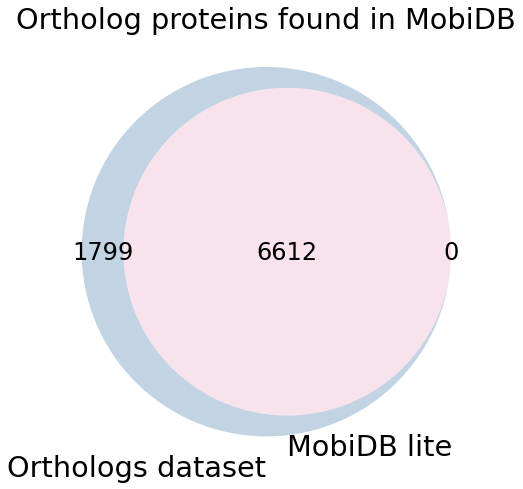

In [21]:
plt.figure(figsize= (8,8))
venn2([set2, mobidb_set], set_labels=["Orthologs dataset", "MobiDB lite"], set_colors= ['#6895BD', '#ED766D']) # set2: all unique ortholog proteins
plt.title("Ortholog proteins found in MobiDB")
plt.rcParams['font.size'] = 24
plt.show()

In [12]:
# Add MSAs info
mobidb_lite_cre_msa = mobidb_lite_cre.merge(all_msas[['msa', 'uniprot']].rename(columns= {'uniprot': 'uniprot_acc'}), how= 'left')
mobidb_lite_cre_msa

,uniprot_acc,prediction_disorder_mobidb_lite,regions,content_count,content_fraction,scores,start,end,is_reference,feature,msa
0,A0A026WPW6,"{'regions': [[1, 24], [84, 103], [357, 412]], ...","[[1, 24], [84, 103], [357, 412]]",100,0.243,"[1, 0.75, 0.75, 1, 0.75, 0.875, 0.875, 1, 1, 1...",29,311,False,kd,A8X6H4_60
1,A0A026WPW6,"{'regions': [[1, 24], [84, 103], [357, 412]], ...","[[1, 24], [84, 103], [357, 412]]",100,0.243,"[1, 0.75, 0.75, 1, 0.75, 0.875, 0.875, 1, 1, 1...",29,311,False,kd,Q9TXJ0_60
2,A0A096LS66,"{'regions': [[331, 363]], 'content_count': 33,...","[[331, 363]]",33,0.091,"[0.625, 0.75, 0.75, 0.75, 0.5, 0.375, 0.25, 0....",18,280,False,kd,Q8VDF3_60
3,A0A096LS66,"{'regions': [[331, 363]], 'content_count': 33,...","[[331, 363]]",33,0.091,"[0.625, 0.75, 0.75, 0.75, 0.5, 0.375, 0.25, 0....",18,280,False,kd,Q9UIK4_60
4,A0A096LS66,"{'regions': [[331, 363]], 'content_count': 33,...","[[331, 363]]",33,0.091,"[0.625, 0.75, 0.75, 0.75, 0.5, 0.375, 0.25, 0....",287,296,False,cre,Q8VDF3_60
...,...,...,...,...,...,...,...,...,...,...,...
22227,H2PJU2,"{'regions': [[301, 338], [354, 391], [443, 486...","[[301, 338], [354, 391], [443, 486]]",120,0.198,"[0.875, 0.875, 0.875, 0.875, 0.75, 0.75, 0.875...",1,22,False,cre,Q62073_60
22228,H2PJU2,"{'regions': [[301, 338], [354, 391], [443, 486...","[[301, 338], [354, 391], [443, 486]]",120,0.198,"[0.875, 0.875, 0.875, 0.875, 0.75, 0.75, 0.875...",36,291,False,kd,O43318_60
22229,H2PJU2,"{'regions': [[301, 338], [354, 391], [443, 486...","[[301, 338], [354, 391], [443, 486]]",120,0.198,"[0.875, 0.875, 0.875, 0.875, 0.75, 0.75, 0.875...",36,291,False,kd,Q62073_60
22230,V7B5Z3,"{'regions': [[16, 35]], 'content_count': 20, '...","[[16, 35]]",20,0.038,"[0.75, 0.75, 0.625, 0.5, 0.5, 0.625, 0.5, 0.37...",57,315,False,kd,Q8W4I7_60


In [13]:
mobidb_lite_cre_msa.msa.nunique()

243

In [120]:
mobidb_lite_cre_msa.sort_values('content_fraction')

,uniprot_acc,prediction_disorder_mobidb_lite,regions,content_count,content_fraction,scores,start,end,is_reference,feature,msa
1801,A0A3P8SME4,"{'regions': [[1333, 1352]], 'content_count': 2...","[[1333, 1352]]",20,0.014,"[0.5, 0.625, 0.5, 0.375, 0.375, 0.125, 0.25, 0...",1,246,False,kd,Q80YE7_60
1802,A0A3P8SME4,"{'regions': [[1333, 1352]], 'content_count': 2...","[[1333, 1352]]",20,0.014,"[0.5, 0.625, 0.5, 0.375, 0.375, 0.125, 0.25, 0...",263,272,False,cre,Q80YE7_60
21063,W5N080,"{'regions': [[723, 742]], 'content_count': 20,...","[[723, 742]]",20,0.014,"[0.75, 0.75, 0.625, 0.625, 0.625, 0.625, 0.375...",13,275,False,kd,P53355_60
21064,W5N080,"{'regions': [[723, 742]], 'content_count': 20,...","[[723, 742]]",20,0.014,"[0.75, 0.75, 0.625, 0.625, 0.625, 0.625, 0.375...",13,275,False,kd,Q80YE7_60
21065,W5N080,"{'regions': [[723, 742]], 'content_count': 20,...","[[723, 742]]",20,0.014,"[0.75, 0.75, 0.625, 0.625, 0.625, 0.625, 0.375...",292,301,False,cre,P53355_60
...,...,...,...,...,...,...,...,...,...,...,...
13155,A0A2K5M5P3,"{'regions': [[263, 596]], 'content_count': 334...","[[263, 596]]",334,0.495,"[0.625, 0.75, 0.75, 0.625, 0.5, 0.5, 0.25, 0.1...",270,436,False,cre,Q13164_60
14801,A0A2K6RJV8,"{'regions': [[263, 596]], 'content_count': 334...","[[263, 596]]",334,0.495,"[0.625, 0.75, 0.75, 0.625, 0.5, 0.5, 0.25, 0.1...",572,675,False,cre,Q13164_60
16407,F6RE34,"{'regions': [[1, 147], [508, 699], [813, 849],...","[[1, 147], [508, 699], [813, 849], [892, 1000]...",1109,0.498,"[1, 0.875, 1, 1, 1, 1, 1, 1, 0.875, 0.875, 0.8...",157,415,False,kd,P83741_60
16408,F6RE34,"{'regions': [[1, 147], [508, 699], [813, 849],...","[[1, 147], [508, 699], [813, 849], [892, 1000]...",1109,0.498,"[1, 0.875, 1, 1, 1, 1, 1, 1, 0.875, 0.875, 0.8...",424,491,False,cre,P83741_60


In [121]:
mobidb_lite_cre_msa.uniprot_acc.nunique()

6612

In [17]:
# fig = mobidb_lite_cre_msa.content_fraction.plot(kind= 'box', figsize=(6,6))
# plt.rcParams['font.size'] = 16
# plt.title(f"Overall disorder content ({mobidb_lite_cre_msa.uniprot_acc.nunique()} sequences)")
# plt.ylabel("disorder fraction (MobiDB-lite)")
# fig.set(xlabel = None)
# plt.show()

### Plots disorder content

In [19]:
msa_no_disorder = []
summary = pd.DataFrame(columns= ['msa', 'feature', 'median_score', 'mean_score'])

# First, group by msa
for msa, df in mobidb_lite_cre_msa.groupby("msa"):

#df = mobidb_lite_cre_msa[mobidb_lite_cre_msa.msa == 'A8X6H4_60'].drop(columns= ['prediction_disorder_mobidb_lite', 'regions'])
    df = df.drop(columns= ['prediction_disorder_mobidb_lite', 'regions'])
    # Drop duplicates
    df.scores = df.scores.apply(str)
    df = df.drop_duplicates()
    df.scores = df.scores.apply(lambda x: eval(x)) # as list again

    if df.shape[0] != 0:
        # Get scores for CREs overlapping disordered region, and the rest of the protein 
        scores = {}
        df["scores_cre"] = None
        df["scores_kd"] = None
        df["scores_rest"] = None

        for i, row in df.iterrows():

            scores_cre = {}
            scores_kd = {}
            scores_rest = {}

            for ix, s in enumerate(row.scores):
                ix += 1 # protein indexes start in 1
                # scores of the cre
                if ix >= row.start and ix <= row.end and row.term_id.startswith("cre"):
                    scores_cre[ix] = s
                # scores of the kd
                elif ix >= row.start and ix <= row.end and row.term_id.startswith("kd"):
                    scores_kd[ix] = s
                # scores of the rest
                else:  
                    scores_rest[ix] = s
            # Add the score to df
            df.scores_cre[i] = scores_cre
            df.scores_kd[i] = scores_kd
            df.scores_rest[i] = scores_rest

        # List of scores by feature
        list_scores_cre = [ list(d.values()) for d in df.scores_cre ]
        list_scores_kd = [ list(d.values()) for d in df.scores_kd ]
        list_scores_rest = [ list(d.values()) for d in df.scores_rest ]
        # flatten it
        list_scores_cre = [ item for sublist in list_scores_cre for item in sublist ]
        list_scores_kd = [ item for sublist in list_scores_kd for item in sublist ]
        list_scores_rest = [ item for sublist in list_scores_rest for item in sublist ]

        # Dataframe with disorder scores by feature (cre, kd, rest)
        cre_df = pd.DataFrame(list_scores_cre, columns= ['score'])
        cre_df["feature"] = "CRE"
        kd_df = pd.DataFrame(list_scores_kd, columns= ['score'])
        kd_df["feature"] = "KD"
        rest_df = pd.DataFrame(list_scores_rest, columns= ['score'])
        rest_df["feature"] = "rest"
        scores_df = pd.concat([cre_df, kd_df, rest_df])

        # For each MSA, store the medians
        for feature, group in scores_df.groupby("feature"):
            entry = pd.DataFrame(data = {'msa': msa, 'feature': feature, 'median_score':  group.score.median(), 'mean_score': group.score.mean() }, index= [0] )
            summary = pd.concat([summary, entry])

        # Boxplots with statistics
        # palette: https://coolors.co/palette/e63946-f1faee-a8dadc-457b9d-1d3557
        # annotator: https://levelup.gitconnected.com/statistics-on-seaborn-plots-with-statannotations-2bfce0394c00

        # Colors
        if scores_df.feature.nunique() == 3: 
            colors = ["#e63946", "#1D3557", "#457b9d"]
        elif set(scores_df.feature) == {'KD', 'rest'}:
            colors = ["#1D3557", "#457b9d"]   
        elif set(scores_df.feature) == {'CRE', 'rest'}:
            colors = ["#e63946", "#457b9d"]

        sns.set(rc={'figure.figsize':(8, 8)}, font_scale= 2)

        flierprops = dict(marker='o', markerfacecolor='gray', markersize= 5,  markeredgecolor='black')
        ax = sns.boxplot(data= scores_df, x= 'feature', y= 'score', width= 0.45, linewidth= 3, medianprops=dict(color="gray", alpha=0.9), palette= colors, flierprops= flierprops) # , notch= True , showmeans= True, meanline= True

        # Combinations to compare
        comb = combinations(scores_df.feature.unique(), 2)
        pairs = [ i for i in comb ]

        annotator = Annotator(ax= ax, pairs= pairs, data= scores_df, x= 'feature', y= 'score')
        annotator.configure(test= 'Mann-Whitney', text_format='star')
        annotator.apply_and_annotate()

        #plt.rcParams['font.size'] = 16
        plt.title(f"Disorder content in MSA {msa}")
        plt.ylabel("disorder score (MobiDB-lite)")
        plt.xlabel("")

        plt.savefig(f'../plots/disorder_content/by_msa/{msa}.png', dpi=200)
        plt.close()
        #plt.show()

    else:
        msa_no_disorder.append(msa)

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:6.962e-13 U_stat=2.611e+05
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.498e-134 U_stat=2.732e+07
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:3.405e-24 U_stat=4.742e+05


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:1.912e-14 U_stat=1.185e+05
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:3.101e-140 U_stat=1.286e+07
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:3.599e-28 U_stat=2.968e+05


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:6.619e-15 U_stat=3.538e+05
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:4.141e-160 U_stat=3.672e+07
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:2.178e-28 U_stat=6.514e+05


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:2.764e-124 U_stat=7.905e+05
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.883e-29 U_stat=3.712e+07
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:5.427e-81 U_stat=2.750e+06


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:4.276e-03 U_stat=3.350e+04
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:3.642e-11 U_stat=3.581e+06
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:2.326e-04 U_stat=1.044e+05


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:4.276e-03 U_stat=3.350e+04
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:3.642e-11 U_stat=3.581e+06
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:2.326e-04 U_stat=1.044e+05


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:1.716e-17 U_stat=6.792e+05
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:7.355e-142 U_stat=1.482e+07
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:4.673e-60 U_stat=1.494e+06


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:7.100e-18 U_stat=5.354e+06
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=1.161e+08
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:9.230e-115 U_stat=1.283e+07


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:4.465e-24 U_stat=7.080e+06
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=1.566e+08
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:8.218e-133 U_stat=1.705e+07


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:7.022e-202 U_stat=1.430e+06
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:4.394e-32 U_stat=5.612e+07
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:9.063e-140 U_stat=5.537e+06


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=1.033e+08
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.365e-258 U_stat=1.221e+09
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=4.062e+08


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:2.097e-04 U_stat=2.509e+06
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=5.675e+07
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:3.567e-75 U_stat=5.041e+05


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:1.323e-06 U_stat=1.092e+07
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=2.102e+08
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.211e-118 U_stat=2.500e+07


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=1.271e+07
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=3.760e+07
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:8.142e-22 U_stat=1.458e+07


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=5.082e+08
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=1.820e+09
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:8.467e-213 U_stat=7.718e+08


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:7.045e-18 U_stat=1.832e+06
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:2.900e-89 U_stat=5.582e+07
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:7.567e-01 U_stat=7.975e+06


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=4.997e+08
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=1.786e+09
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:7.553e-213 U_stat=7.675e+08


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=1.345e+08
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=1.319e+09
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:2.701e-278 U_stat=2.437e+08


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:3.396e-01 U_stat=7.726e+04
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.775e-41 U_stat=1.511e+06
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:4.308e-10 U_stat=2.187e+05


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:3.671e-01 U_stat=5.684e+03
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:9.658e-25 U_stat=6.423e+04
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:3.426e-08 U_stat=1.117e+04


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:2.459e-17 U_stat=6.199e+07
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=3.794e+09
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:5.361e-23 U_stat=1.755e+08


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=4.658e+07
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=2.451e+09
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:7.491e-278 U_stat=1.337e+08


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=1.749e+09
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=3.859e+09
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:2.503e-164 U_stat=2.760e+09


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:3.727e-297 U_stat=3.177e+06
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:2.875e-113 U_stat=3.000e+07
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:4.292e-157 U_stat=6.315e+06


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=1.450e+08
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=4.612e+09
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=3.023e+08


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:2.019e-104 U_stat=1.838e+07
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=1.463e+09
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:6.334e-214 U_stat=4.188e+07


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:3.147e-05 U_stat=3.947e+04
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:4.582e-17 U_stat=1.019e+06
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.877e-11 U_stat=1.315e+05


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=9.464e+08
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=2.355e+09
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:5.677e-196 U_stat=1.405e+09


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:2.667e-280 U_stat=3.803e+07
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=8.134e+08
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:9.919e-55 U_stat=5.296e+07


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:1.678e-85 U_stat=4.029e+07
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:2.082e-25 U_stat=1.205e+08
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:7.546e-308 U_stat=2.375e+08


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=6.418e+07
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=7.277e+07
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.017e-02 U_stat=7.120e+07


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:7.848e-93 U_stat=1.153e+05


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=9.124e+07
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=2.606e+09
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=2.025e+08


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=1.226e+08
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=3.742e+08
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=3.504e+08


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=7.766e+07
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=2.680e+08
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:8.279e-06 U_stat=2.656e+08


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:3.010e-124 U_stat=4.825e+06
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.450e-289 U_stat=1.544e+08
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:2.239e-15 U_stat=3.062e+07


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:8.991e-01 U_stat=7.160e+07
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=1.379e+09
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=1.617e+08


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:2.621e-11 U_stat=6.773e+04
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:2.816e-10 U_stat=5.771e+05
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:5.595e-03 U_stat=2.704e+05


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:3.271e-18 U_stat=9.063e+05
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:4.742e-302 U_stat=3.734e+07
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:2.204e-01 U_stat=2.399e+06


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=7.696e+06
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=1.684e+08
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:3.668e-86 U_stat=2.223e+07


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:1.564e-07 U_stat=5.735e+06
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:3.536e-263 U_stat=4.117e+08
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:9.449e-52 U_stat=3.159e+07


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:1.960e-302 U_stat=2.623e+06
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=1.544e+07
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:3.411e-52 U_stat=3.788e+06


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:2.582e-06 U_stat=6.479e+06
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:4.467e-37 U_stat=2.664e+08
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:9.713e-01 U_stat=2.976e+07


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:1.537e-49 U_stat=1.077e+07
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=7.202e+08
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:2.791e-200 U_stat=2.212e+07


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:1.190e-67 U_stat=5.103e+07
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=4.535e+08
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:5.234e-212 U_stat=7.105e+07


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=1.019e+08
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:6.281e-260 U_stat=1.222e+09
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=4.011e+08


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=9.136e+07
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=2.607e+09
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=2.028e+08


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:1.262e-12 U_stat=2.401e+05
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.317e-27 U_stat=8.307e+06
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:7.201e-28 U_stat=8.868e+05


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=1.537e+07
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=3.460e+08
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=4.945e+07


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:1.695e-19 U_stat=7.058e+06
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=5.370e+08
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:6.830e-83 U_stat=1.704e+07


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:2.780e-64 U_stat=4.981e+07
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=4.451e+08
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.904e-211 U_stat=6.936e+07


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:3.498e-105 U_stat=1.865e+07
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=1.484e+09
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.732e-215 U_stat=4.249e+07


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=9.165e+07
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.994e-77 U_stat=8.496e+08
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=4.304e+08


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:1.221e-39 U_stat=1.658e+05
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.311e-132 U_stat=4.069e+06
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.212e-04 U_stat=4.692e+05


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:7.571e-39 U_stat=3.759e+07
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:3.810e-22 U_stat=4.786e+08
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.648e-152 U_stat=2.326e+08


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:3.903e-131 U_stat=8.455e+06
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=3.186e+08
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:4.377e-31 U_stat=2.793e+07


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:2.917e-250 U_stat=2.431e+06
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:3.723e-60 U_stat=8.672e+07
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.456e-229 U_stat=8.547e+06


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=9.366e+06
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=3.178e+08
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:5.199e-273 U_stat=3.008e+07


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=1.069e+09
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=2.274e+09
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=1.528e+09


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:2.696e-36 U_stat=4.023e+05
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.864e-30 U_stat=4.132e+06
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:4.525e-10 U_stat=4.798e+05


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:5.576e-01 U_stat=7.852e+04
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:8.122e-64 U_stat=1.312e+06
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:6.552e-13 U_stat=1.950e+05


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:1.440e-51 U_stat=1.140e+07
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=7.655e+08
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.336e-206 U_stat=2.347e+07


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:1.141e-06 U_stat=6.537e+04
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:4.111e-14 U_stat=2.154e+06
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.810e-01 U_stat=4.579e+05


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=8.516e+07
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=1.820e+08
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.422e-33 U_stat=1.381e+08


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=2.464e+07
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=4.799e+07
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:5.281e-18 U_stat=3.734e+07


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=1.082e+09
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=2.721e+09
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.167e-234 U_stat=1.604e+09


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=5.769e+08
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=3.448e+09
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=8.639e+08


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=2.643e+07
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.106e-81 U_stat=2.977e+08
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=1.371e+08


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=8.783e+07
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:5.459e-03 U_stat=6.196e+08
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=5.937e+08


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:2.197e-04 U_stat=8.103e+06
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.337e-146 U_stat=1.079e+08
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:8.943e-12 U_stat=1.075e+07


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:8.144e-40 U_stat=5.254e+06
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:4.663e-30 U_stat=2.539e+08
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.619e-63 U_stat=2.344e+07


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:3.764e-52 U_stat=7.992e+05
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:9.223e-181 U_stat=6.560e+06
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:3.869e-02 U_stat=8.044e+05


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:5.764e-18 U_stat=1.015e+07
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=4.609e+08
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:4.694e-91 U_stat=2.745e+07


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/l

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:5.177e-04 U_stat=9.016e+04
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:1.642e-225 U_stat=2.341e+07
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:7.962e-123 U_stat=2.472e+08
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:2.361e-122 U_stat=1.049e+08


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:2.767e-30 U_stat=4.713e+06
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=5.218e+07
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.886e-20 U_stat=6.813e+06


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:3.496e-144 U_stat=7.236e+06
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:5.940e-303 U_stat=5.518e+07
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.473e-03 U_stat=8.491e+06


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=7.310e+08
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=4.377e+09
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=1.111e+09


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=5.083e+07
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=4.518e+08
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.011e-10 U_stat=7.071e+07


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=5.083e+07
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=4.518e+08
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.011e-10 U_stat=7.071e+07


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=3.555e+06
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:9.576e-205 U_stat=5.066e+06
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:4.281e-291 U_stat=4.647e+06


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:9.791e-13 U_stat=2.750e+06
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=2.402e+08
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:5.608e-45 U_stat=7.183e+06


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:3.311e-04 U_stat=7.312e+03
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:9.712e-01 U_stat=1.344e+06
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:2.402e-04 U_stat=7.305e+04
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:9.199e-04 U_stat=5.114e+03


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:6.663e-09 U_stat=9.437e+04
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:5.466e-01 U_stat=1.493e+04


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:2.096e-04 U_stat=2.448e+06
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:9.079e-276 U_stat=4.674e+07
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:8.072e-58 U_stat=5.490e+06


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:2.764e-01 U_stat=3.659e+03
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:4.140e-08 U_stat=8.794e+04
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:4.582e-03 U_stat=9.620e+03


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=5.367e+08
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=2.445e+09
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=1.115e+09


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:7.275e-133 U_stat=4.688e+06
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=1.915e+07
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:5.458e-02 U_stat=1.109e+07


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:6.619e-15 U_stat=3.538e+05
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:5.219e-160 U_stat=3.673e+07
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:2.186e-28 U_stat=6.514e+05


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:5.682e-27 U_stat=4.867e+05
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:3.995e-60 U_stat=5.766e+07
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.068e-35 U_stat=1.257e+06


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=1.055e+09
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=2.240e+09
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=1.507e+09


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=1.056e+09
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=2.152e+09
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=1.690e+09


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=2.964e+08
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=7.725e+08
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.311e-05 U_stat=1.726e+09


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=1.866e+08
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=2.453e+09
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=8.239e+08


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=3.845e+08
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=2.541e+09
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=4.477e+08


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:2.059e-32 U_stat=4.652e+08
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=1.615e+09
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=1.946e+09


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:3.180e-17 U_stat=1.884e+07
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=1.515e+09
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:6.231e-221 U_stat=6.482e+07


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:3.171e-09 U_stat=4.628e+07
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=6.556e+08
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:2.600e-134 U_stat=5.848e+07


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=1.020e+09
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=6.161e+09
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=1.555e+09


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:1.556e-14 U_stat=2.270e+06
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.592e-295 U_stat=5.425e+07
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:3.664e-80 U_stat=5.916e+06


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=1.644e+08
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=9.934e+08
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=8.630e+08


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=1.948e+09
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=4.940e+09
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=2.913e+09


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=4.952e+08
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=2.138e+09
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:2.224e-12 U_stat=1.026e+09


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:1.464e-121 U_stat=3.236e+06
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.029e-223 U_stat=1.041e+08
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:9.554e-206 U_stat=7.760e+06


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:4.892e-01 U_stat=1.875e+06
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:5.654e-292 U_stat=3.455e+07
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.778e-39 U_stat=4.440e+06


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:3.084e-29 U_stat=6.105e+07
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=2.513e+08
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=1.957e+08


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=3.976e+08
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=4.517e+08
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=5.750e+08


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=7.410e+08
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=3.517e+09
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=1.546e+09


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=1.938e+09
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=4.907e+09
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=2.881e+09


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=2.758e+08
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=3.940e+08
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=1.192e+09


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=1.273e+09
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=4.331e+09
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:4.648e-04 U_stat=2.121e+09


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=5.787e+08
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=6.592e+08
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=1.000e+09


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=2.129e+08
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=1.206e+09
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=1.837e+09


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=4.927e+08
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=1.823e+09
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=2.748e+09


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:1.806e-75 U_stat=2.141e+07
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=1.489e+09
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:2.787e-304 U_stat=4.493e+07


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:8.716e-50 U_stat=1.736e+07
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=1.385e+09
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:2.052e-162 U_stat=4.253e+07


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:2.015e-126 U_stat=2.772e+07
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=2.194e+09
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.174e-264 U_stat=6.328e+07


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=1.473e+08
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=4.657e+09
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=3.066e+08


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:1.159e-01 U_stat=1.105e+07
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=9.394e+07
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:4.613e-103 U_stat=1.398e+07


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=2.838e+06
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=9.971e+06
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:2.154e-09 U_stat=3.211e+06


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:2.829e-01 U_stat=7.543e+05
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:7.780e-153 U_stat=6.584e+07
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:2.696e-09 U_stat=1.891e+06


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:3.450e-04 U_stat=2.732e+06
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=2.112e+08
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:3.013e-28 U_stat=6.903e+06


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:6.940e-56 U_stat=5.263e+07
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=4.940e+08
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.191e-219 U_stat=7.375e+07


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=1.353e+07
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=6.820e+07
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=2.454e+07


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:6.886e-145 U_stat=3.488e+07
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=3.129e+08
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:4.725e-32 U_stat=1.171e+08


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=3.980e+08
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=2.412e+09
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:3.847e-06 U_stat=5.148e+08


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:4.040e-05 U_stat=3.861e+04
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:5.965e-23 U_stat=8.889e+05
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.937e-14 U_stat=1.105e+05


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:1.931e-02 U_stat=2.009e+04
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:2.316e-21 U_stat=3.905e+05
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.330e-09 U_stat=6.488e+04


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=1.844e+08
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=7.533e+08
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:3.131e-02 U_stat=3.813e+08


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=6.358e+06
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=2.048e+07
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.955e-23 U_stat=7.462e+06


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=8.321e+08
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=2.660e+09
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.972e-01 U_stat=1.362e+09


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:4.597e-02 U_stat=5.193e+05
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.048e-173 U_stat=1.082e+07
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:6.970e-33 U_stat=1.364e+06


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:3.868e-03 U_stat=1.525e+05
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:6.023e-27 U_stat=3.667e+06
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.492e-11 U_stat=4.619e+05


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:2.902e-10 U_stat=1.808e+05
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:2.191e-29 U_stat=4.436e+06
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:3.729e-21 U_stat=4.935e+05


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:5.114e-03 U_stat=1.078e+05
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.304e-41 U_stat=2.220e+06
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:6.133e-14 U_stat=2.883e+05


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:2.586e-08 U_stat=1.224e+06
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:2.109e-244 U_stat=2.910e+07
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:2.139e-59 U_stat=3.292e+06


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:1.478e-06 U_stat=6.848e+04
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:2.245e-42 U_stat=1.526e+06
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:9.767e-18 U_stat=1.940e+05


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:1.540e-07 U_stat=4.725e+05
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:2.051e-141 U_stat=1.029e+07
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:4.385e-38 U_stat=1.197e+06


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:3.615e-02 U_stat=4.357e+04
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:3.801e-20 U_stat=8.896e+05
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.172e-08 U_stat=1.276e+05


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:5.691e-01 U_stat=3.545e+05
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.450e-155 U_stat=5.499e+06
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.017e-23 U_stat=7.830e+05


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:1.121e-50 U_stat=1.165e+07
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=7.786e+08
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:3.763e-213 U_stat=2.398e+07


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=3.999e+08
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=2.433e+09
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:2.078e-03 U_stat=5.169e+08


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=3.932e+08
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=2.393e+09
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.344e-03 U_stat=5.084e+08


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:2.820e-08 U_stat=2.547e+04
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:5.387e-101 U_stat=1.176e+06
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.678e-01 U_stat=4.359e+04


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:5.213e-01 U_stat=9.780e+04
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.538e-06 U_stat=2.197e+06
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.345e-02 U_stat=2.561e+05


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/l

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:1.209e-01 U_stat=7.191e+03
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:9.849e-04 U_stat=1.466e+05
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.723e-03 U_stat=3.136e+04
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:1.415e-12 U_stat=1.765e+06
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:8.377e-195 U_stat=3.762e+07
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:3.106e-63 U_stat=4.058e+06


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:1.122e-12 U_stat=3.621e+05
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.478e-20 U_stat=9.135e+06
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:4.008e-23 U_stat=9.680e+05


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=7.137e+08
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=4.290e+09
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=1.034e+09


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=4.431e+08
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=2.009e+09
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=9.169e+08


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=7.411e+08
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=4.468e+09
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=1.073e+09


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:4.919e-05 U_stat=8.471e+06
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=1.590e+08
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.840e-105 U_stat=1.888e+07


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=1.849e+08
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=7.837e+08
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:2.419e-43 U_stat=1.369e+09


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=5.263e+08
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=1.187e+09
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:6.727e-113 U_stat=7.974e+08


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=2.838e+06
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=9.971e+06
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:2.154e-09 U_stat=3.211e+06


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=6.312e+07
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=6.371e+08
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:7.253e-179 U_stat=1.068e+08


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:5.386e-32 U_stat=3.216e+06
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:2.674e-23 U_stat=1.659e+08
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:4.876e-52 U_stat=2.157e+07


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=7.005e+08
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=1.650e+09
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.303e-169 U_stat=1.061e+09


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:1.159e-01 U_stat=1.105e+07
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=9.394e+07
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:4.613e-103 U_stat=1.398e+07


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=4.943e+08
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=1.670e+09
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:2.585e-13 U_stat=8.026e+08


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=3.568e+08
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=2.182e+09
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:8.475e-03 U_stat=4.607e+08


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:3.393e-04 U_stat=2.380e+05
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:3.689e-38 U_stat=4.568e+06
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.733e-02 U_stat=6.551e+05


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:9.075e-01 U_stat=3.152e+06
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:4.205e-166 U_stat=6.687e+07
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:5.695e-26 U_stat=8.008e+06


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:3.905e-17 U_stat=3.036e+06
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:7.495e-283 U_stat=7.575e+07
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:2.559e-83 U_stat=8.144e+06


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=9.569e+07
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=3.041e+08
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=1.205e+08


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:3.989e-08 U_stat=2.410e+05
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.772e-68 U_stat=5.491e+06
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:3.804e-30 U_stat=6.025e+05


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:5.653e-31 U_stat=4.918e+05
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:2.304e-66 U_stat=7.211e+06
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.436e-02 U_stat=1.282e+06


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:7.467e-02 U_stat=2.155e+05
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.116e-28 U_stat=4.687e+06
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.851e-09 U_stat=5.944e+05


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=8.111e+06
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=5.045e+07
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.341e-181 U_stat=1.225e+07


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=7.410e+08
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=4.453e+09
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=1.074e+09


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:3.668e-89 U_stat=2.404e+07
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=1.825e+09
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:7.387e-212 U_stat=5.410e+07


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=9.724e+08
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=2.041e+09
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=1.430e+09


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:8.051e-43 U_stat=3.362e+05
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:7.259e-14 U_stat=1.212e+07
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:8.792e-51 U_stat=9.309e+05


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:1.508e-02 U_stat=1.158e+05
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:6.288e-08 U_stat=2.887e+06
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:2.114e-06 U_stat=3.433e+05


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:9.947e-12 U_stat=2.278e+05
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.309e-51 U_stat=5.594e+06
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:2.404e-29 U_stat=5.963e+05


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:6.619e-15 U_stat=3.538e+05
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:8.427e-159 U_stat=3.680e+07
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:2.579e-28 U_stat=6.529e+05


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:1.912e-14 U_stat=1.185e+05
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:2.391e-140 U_stat=1.284e+07
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:3.915e-28 U_stat=2.966e+05


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:5.682e-27 U_stat=4.867e+05
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:6.399e-60 U_stat=5.767e+07
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.148e-35 U_stat=1.258e+06


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:5.627e-25 U_stat=6.932e+07
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=5.866e+08
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=1.052e+08


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:4.640e-11 U_stat=1.339e+06
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:2.929e-179 U_stat=3.285e+07
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:4.738e-55 U_stat=3.598e+06


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:2.083e-36 U_stat=2.813e+05
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:3.061e-44 U_stat=9.532e+06
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.695e-54 U_stat=7.783e+05


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:3.458e-10 U_stat=6.059e+06
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=1.267e+08
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.827e-88 U_stat=1.402e+07


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=5.627e+08
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=1.153e+09
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:4.505e-53 U_stat=9.320e+08


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:1.344e-44 U_stat=4.729e+05
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.149e-02 U_stat=7.467e+07
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.659e-43 U_stat=4.942e+06


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:1.876e-22 U_stat=3.238e+06
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.495e-134 U_stat=8.181e+07
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:5.884e-68 U_stat=8.198e+06


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:1.299e-03 U_stat=5.699e+06
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=1.201e+08
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.386e-97 U_stat=1.408e+07


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=2.997e+08
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=1.066e+09
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.611e-195 U_stat=4.715e+08


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=5.107e+08
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=2.216e+09
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:8.785e-14 U_stat=1.052e+09


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=1.484e+09
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=2.985e+09
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=2.436e+09


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:5.939e-119 U_stat=1.711e+08
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=1.554e+09
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=2.252e+08


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=6.749e+07
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=1.722e+09
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:3.933e-59 U_stat=9.799e+07


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=1.182e+09
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=4.003e+09
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:7.642e-05 U_stat=1.957e+09


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:1.028e-198 U_stat=1.362e+06
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:3.062e-25 U_stat=5.251e+07
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:2.569e-140 U_stat=5.391e+06


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:1.218e-28 U_stat=5.693e+05
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.189e-66 U_stat=6.702e+07
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:3.842e-38 U_stat=1.473e+06


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:4.726e-128 U_stat=1.699e+08
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=1.551e+09
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=2.238e+08


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:3.118e-16 U_stat=4.000e+08
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=1.365e+09
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=1.375e+09


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:2.872e-36 U_stat=1.403e+06
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:3.187e-94 U_stat=2.202e+07
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:3.352e-02 U_stat=3.631e+06


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:8.662e-42 U_stat=3.153e+07
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=2.085e+09
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.522e-46 U_stat=3.974e+07


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:1.251e-09 U_stat=1.713e+07
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=3.513e+08
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:3.900e-122 U_stat=3.978e+07


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:1.032e-41 U_stat=3.137e+07
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=2.073e+09
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.536e-46 U_stat=3.970e+07


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:1.452e-137 U_stat=9.858e+06
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=2.369e+08
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.019e-02 U_stat=1.305e+07


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:5.095e-14 U_stat=4.745e+06
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:2.077e-268 U_stat=8.170e+07
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:5.701e-15 U_stat=1.133e+07


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=8.298e+06
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=3.334e+07
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.147e-12 U_stat=9.314e+06


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:1.614e-13 U_stat=1.044e+08
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=9.236e+08
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=1.626e+08


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:8.500e-01 U_stat=1.388e+07
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=1.201e+08
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:5.085e-126 U_stat=1.768e+07


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:3.599e-22 U_stat=7.331e+06
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=5.630e+08
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:8.650e-89 U_stat=1.770e+07


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:2.358e-64 U_stat=1.123e+07
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=2.958e+07
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:6.693e-218 U_stat=3.132e+07


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:1.106e-87 U_stat=2.785e+07
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=2.085e+09
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.100e-223 U_stat=6.255e+07


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:7.971e-24 U_stat=6.921e+07
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=5.870e+08
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=1.050e+08


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:4.120e-34 U_stat=1.340e+06
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=7.410e+07
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:7.898e-25 U_stat=7.250e+06


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:1.060e-282 U_stat=4.013e+07
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=8.431e+08
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.211e-59 U_stat=5.522e+07


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=6.228e+07
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=1.633e+08
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:5.714e-76 U_stat=2.109e+08


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:9.143e-10 U_stat=2.782e+08
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=6.643e+08
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=1.474e+09


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:2.702e-04 U_stat=7.748e+07
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=1.440e+09
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=1.733e+08


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=6.091e+08
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=3.641e+09
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=9.155e+08


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:5.993e-05 U_stat=3.998e+04
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:2.418e-31 U_stat=9.578e+05
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:3.032e-14 U_stat=1.255e+05


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:6.544e-32 U_stat=1.353e+05
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:7.244e-70 U_stat=4.208e+06
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:6.400e-56 U_stat=3.371e+05


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:2.129e-03 U_stat=7.049e+04
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.489e-42 U_stat=1.393e+06
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:4.730e-15 U_stat=1.836e+05


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:1.610e-12 U_stat=4.474e+04
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.487e-40 U_stat=1.435e+06
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:3.760e-22 U_stat=1.198e+05


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:6.063e-02 U_stat=1.970e+06
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:6.324e-276 U_stat=3.954e+07
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:5.215e-48 U_stat=4.827e+06


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=6.521e+08
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=2.177e+09
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=2.352e+09


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:2.564e-196 U_stat=8.438e+07
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=1.125e+09
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=3.559e+08


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:1.562e-145 U_stat=5.315e+07
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=6.785e+08
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=2.111e+08


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:6.186e-06 U_stat=6.625e+04
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:3.133e-24 U_stat=1.708e+06
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:2.712e-14 U_stat=2.072e+05


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:2.160e-09 U_stat=3.582e+04
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:8.638e-34 U_stat=8.962e+05
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:7.122e-20 U_stat=1.049e+05


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:8.394e-01 U_stat=4.860e+04
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:2.170e-22 U_stat=8.984e+05
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:3.482e-05 U_stat=1.440e+05


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:1.835e-13 U_stat=1.094e+05
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.197e-147 U_stat=1.210e+07
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.209e-26 U_stat=2.568e+05


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=6.549e+08
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=2.176e+09
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=2.357e+09


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:6.061e-56 U_stat=2.250e+06
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.563e-259 U_stat=6.754e+07
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.821e-124 U_stat=6.089e+06


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:5.893e-05 U_stat=6.794e+04
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:2.454e-25 U_stat=1.841e+06
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.486e-13 U_stat=2.277e+05


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:1.181e-08 U_stat=1.455e+05
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:3.480e-33 U_stat=2.407e+06
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:6.686e-01 U_stat=4.201e+05


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:9.082e-07 U_stat=5.956e+04
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:4.120e-51 U_stat=6.876e+05
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:2.251e-03 U_stat=1.392e+05


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:1.601e-03 U_stat=3.925e+05
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.248e-72 U_stat=7.085e+06
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:9.956e-07 U_stat=1.025e+06


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:1.197e-09 U_stat=7.679e+04
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:3.726e-07 U_stat=2.503e+06
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:5.873e-14 U_stat=2.271e+05


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:1.030e-04 U_stat=1.220e+06
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=3.201e+07
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:4.378e-54 U_stat=2.399e+05


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:7.819e-86 U_stat=1.167e+07
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=3.042e+08
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.999e-01 U_stat=1.558e+07


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=4.799e+07
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=9.545e+07
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:7.920e-36 U_stat=7.067e+07


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:2.645e-286 U_stat=1.296e+08
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=9.267e+08
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:2.772e-01 U_stat=8.473e+08


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=2.613e+07
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=1.158e+08
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.622e-16 U_stat=2.527e+07


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:4.030e-01 U_stat=1.626e+05
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:6.041e-84 U_stat=2.841e+06
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:3.383e-16 U_stat=3.876e+05


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:2.677e-30 U_stat=3.758e+06
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=9.530e+07
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:4.973e-127 U_stat=9.553e+06


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:2.189e-04 U_stat=8.235e+06
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=1.780e+08
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:5.007e-106 U_stat=2.084e+07


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:7.172e-149 U_stat=6.179e+05
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:2.440e-13 U_stat=2.009e+07
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.621e-124 U_stat=2.660e+06


In [14]:
mobidb_lite_cre_msa#.uniprot_acc.nunique()

,uniprot_acc,prediction_disorder_mobidb_lite,regions,content_count,content_fraction,scores,start,end,is_reference,feature,msa
0,A0A026WPW6,"{'regions': [[1, 24], [84, 103], [357, 412]], ...","[[1, 24], [84, 103], [357, 412]]",100,0.243,"[1, 0.75, 0.75, 1, 0.75, 0.875, 0.875, 1, 1, 1...",29,311,False,kd,A8X6H4_60
1,A0A026WPW6,"{'regions': [[1, 24], [84, 103], [357, 412]], ...","[[1, 24], [84, 103], [357, 412]]",100,0.243,"[1, 0.75, 0.75, 1, 0.75, 0.875, 0.875, 1, 1, 1...",29,311,False,kd,Q9TXJ0_60
2,A0A096LS66,"{'regions': [[331, 363]], 'content_count': 33,...","[[331, 363]]",33,0.091,"[0.625, 0.75, 0.75, 0.75, 0.5, 0.375, 0.25, 0....",18,280,False,kd,Q8VDF3_60
3,A0A096LS66,"{'regions': [[331, 363]], 'content_count': 33,...","[[331, 363]]",33,0.091,"[0.625, 0.75, 0.75, 0.75, 0.5, 0.375, 0.25, 0....",18,280,False,kd,Q9UIK4_60
4,A0A096LS66,"{'regions': [[331, 363]], 'content_count': 33,...","[[331, 363]]",33,0.091,"[0.625, 0.75, 0.75, 0.75, 0.5, 0.375, 0.25, 0....",287,296,False,cre,Q8VDF3_60
...,...,...,...,...,...,...,...,...,...,...,...
22227,H2PJU2,"{'regions': [[301, 338], [354, 391], [443, 486...","[[301, 338], [354, 391], [443, 486]]",120,0.198,"[0.875, 0.875, 0.875, 0.875, 0.75, 0.75, 0.875...",1,22,False,cre,Q62073_60
22228,H2PJU2,"{'regions': [[301, 338], [354, 391], [443, 486...","[[301, 338], [354, 391], [443, 486]]",120,0.198,"[0.875, 0.875, 0.875, 0.875, 0.75, 0.75, 0.875...",36,291,False,kd,O43318_60
22229,H2PJU2,"{'regions': [[301, 338], [354, 391], [443, 486...","[[301, 338], [354, 391], [443, 486]]",120,0.198,"[0.875, 0.875, 0.875, 0.875, 0.75, 0.75, 0.875...",36,291,False,kd,Q62073_60
22230,V7B5Z3,"{'regions': [[16, 35]], 'content_count': 20, '...","[[16, 35]]",20,0.038,"[0.75, 0.75, 0.625, 0.5, 0.5, 0.625, 0.5, 0.37...",57,315,False,kd,Q8W4I7_60


In [28]:
# Only summary df
msa_no_disorder = []
summary = pd.DataFrame(columns= ['msa', 'feature', 'median_score', 'mean_score'])

# First, group by msa
for msa, df in mobidb_lite_cre_msa.groupby("msa"):

#df = mobidb_lite_cre_msa[mobidb_lite_cre_msa.msa == 'A8X6H4_60'].drop(columns= ['prediction_disorder_mobidb_lite', 'regions'])
    df = df.drop(columns= ['prediction_disorder_mobidb_lite', 'regions'])
    # Drop duplicates
    df.scores = df.scores.apply(str)
    df = df.drop_duplicates()
    df.scores = df.scores.apply(lambda x: eval(x)) # as list again

    if df.shape[0] != 0:
        # Get scores for CREs overlapping disordered region, and the rest of the protein 
        scores = {}
        df["scores_cre"] = None
        df["scores_kd"] = None
        df["scores_rest"] = None

        for i, row in df.iterrows():

            scores_cre = {}
            scores_kd = {}
            scores_rest = {}

            for ix, s in enumerate(row.scores):
                ix += 1 # protein indexes start in 1
                # scores of the cre
                if ix >= row.start and ix <= row.end and row.term_id.startswith("cre"):
                    scores_cre[ix] = s
                # scores of the kd
                elif ix >= row.start and ix <= row.end and row.term_id.startswith("kd"):
                    scores_kd[ix] = s
                # scores of the rest
                else:  
                    scores_rest[ix] = s
            # Add the score to df
            df.scores_cre[i] = scores_cre
            df.scores_kd[i] = scores_kd
            df.scores_rest[i] = scores_rest

        # List of scores by feature
        list_scores_cre = [ list(d.values()) for d in df.scores_cre ]
        list_scores_kd = [ list(d.values()) for d in df.scores_kd ]
        list_scores_rest = [ list(d.values()) for d in df.scores_rest ]
        # flatten it
        list_scores_cre = [ item for sublist in list_scores_cre for item in sublist ]
        list_scores_kd = [ item for sublist in list_scores_kd for item in sublist ]
        list_scores_rest = [ item for sublist in list_scores_rest for item in sublist ]

        # Dataframe with disorder scores by feature (cre, kd, rest)
        cre_df = pd.DataFrame(list_scores_cre, columns= ['score'])
        cre_df["feature"] = "CRE"
        kd_df = pd.DataFrame(list_scores_kd, columns= ['score'])
        kd_df["feature"] = "KD"
        rest_df = pd.DataFrame(list_scores_rest, columns= ['score'])
        rest_df["feature"] = "rest"
        scores_df = pd.concat([cre_df, kd_df, rest_df])

    #     print(df[['uniprot_acc', 'term_id',
    #    'start', 'end',  'scores_cre', 'scores_kd',
    #    'scores_rest']])
        # For each MSA, store the medians
        for feature, group in scores_df.groupby("feature"):
            entry = pd.DataFrame(data = {'msa': msa, 'feature': feature, 'median_score':  group.score.median(), 'mean_score': group.score.mean() }, index= [0] )
            summary = pd.concat([summary, entry])


    else:
        msa_no_disorder.append(msa)

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


      uniprot_acc term_id  start  end  \
3060   A0A0D9QJY8     kd1     58  329   
3064   A0A0D9QJY8    cre1    350  357   
3068   A0A0D9QJY8     kd3     58  329   
3072   A0A0D9QJY8    cre3    350  357   
3076   A0A0D9QJY8   kd102     58  329   
3080   A0A0D9QJY8  cre102    350  357   
3084   A0A0D9QJY8   kd203     58  329   
3088   A0A0D9QJY8  cre203    350  357   
7817       W4J6J2     kd1     56  325   
7821       W4J6J2    cre1    346  353   
7825       W4J6J2     kd3     56  325   
7829       W4J6J2    cre3    346  353   
7833       W4J6J2   kd102     56  325   
7837       W4J6J2  cre102    346  353   
7841       W4J6J2   kd203     56  325   
7845       W4J6J2  cre203    346  353   
17113  A0A1Y3DU95     kd1     66  337   
17117  A0A1Y3DU95    cre1    358  365   
17121  A0A1Y3DU95     kd3     66  337   
17125  A0A1Y3DU95    cre3    358  365   
17129  A0A1Y3DU95   kd102     66  337   
17133  A0A1Y3DU95  cre102    358  365   
17137  A0A1Y3DU95   kd203     66  337   
17141  A0A1Y3DU9

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


      uniprot_acc term_id  start  end  \
22635  A0A1A8VWK0     kd2    111  374   
22638  A0A1A8VWK0    cre2    394  402   
22641  A0A1A8VWK0   kd204    111  374   
22644  A0A1A8VWK0  cre204    394  402   
22647  A0A1A8VWK0   kd263    111  374   
22650  A0A1A8VWK0  cre263    394  402   
25838  A0A1G4HBZ1     kd2    158  413   
25841  A0A1G4HBZ1    cre2    433  441   
25844  A0A1G4HBZ1   kd204    158  413   
25847  A0A1G4HBZ1  cre204    433  441   
25850  A0A1G4HBZ1   kd263    158  413   
25853  A0A1G4HBZ1  cre263    433  441   
35368  A0A509AFG4    cre2    385  393   
36874  A0A0D9QSD5     kd2    139  394   
36877  A0A0D9QSD5    cre2    414  422   
36880  A0A0D9QSD5   kd204    139  394   
36883  A0A0D9QSD5  cre204    414  422   
36886  A0A0D9QSD5   kd263    139  394   
36889  A0A0D9QSD5  cre263    414  422   
39490  A0A1Y3DRP7     kd2    146  401   
39493  A0A1Y3DRP7    cre2    421  429   
39496  A0A1Y3DRP7   kd204    146  401   
39499  A0A1Y3DRP7  cre204    421  429   
39502  A0A1Y3DRP

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


      uniprot_acc term_id  start  end  \
3061   A0A0D9QJY8     kd1     58  329   
3065   A0A0D9QJY8    cre1    350  357   
3069   A0A0D9QJY8     kd3     58  329   
3073   A0A0D9QJY8    cre3    350  357   
3077   A0A0D9QJY8   kd102     58  329   
3081   A0A0D9QJY8  cre102    350  357   
3085   A0A0D9QJY8   kd203     58  329   
3089   A0A0D9QJY8  cre203    350  357   
6531       W7K0P0     kd3     56  325   
6534       W7K0P0    cre3    346  353   
6537       W7K0P0   kd102     56  325   
6540       W7K0P0  cre102    346  353   
6543       W7K0P0   kd203     56  325   
6546       W7K0P0  cre203    346  353   
7818       W4J6J2     kd1     56  325   
7822       W4J6J2    cre1    346  353   
7826       W4J6J2     kd3     56  325   
7830       W4J6J2    cre3    346  353   
7834       W4J6J2   kd102     56  325   
7838       W4J6J2  cre102    346  353   
7842       W4J6J2   kd203     56  325   
7846       W4J6J2  cre203    346  353   
16042  A0A509AHB6    cre3    345  352   
17114  A0A1Y3DU9

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


      uniprot_acc term_id  start  end  \
5320       W4IVK0     kd4    541  798   
5324       W4IVK0   cre10      1   22   
5328       W4IVK0    kd10    534  791   
5332       W4IVK0  cre223      1   29   
5336       W4IVK0   kd223    541  798   
5340       W4IVK0  cre286      1   29   
5344       W4IVK0   kd286    541  798   
8788       U6MF62     kd4    586  843   
8791       U6MF62    kd10    576  833   
8794       U6MF62   kd223    583  840   
17211      B6K8K4     kd4    560  817   
17214      B6K8K4    kd10    546  803   
17217      B6K8K4   kd223    556  813   
20402  A0A0D9QPF1     kd4    545  802   
20406  A0A0D9QPF1   cre10      1   22   
20410  A0A0D9QPF1    kd10    534  791   
20414  A0A0D9QPF1   kd223    541  798   
20418  A0A0D9QPF1   kd286    541  798   
30242  A0A0L7M3I6     kd4    541  798   
30246  A0A0L7M3I6   cre10      1   22   
30250  A0A0L7M3I6    kd10    534  791   
30254  A0A0L7M3I6  cre223      1   29   
30258  A0A0L7M3I6   kd223    541  798   
30262  A0A0L7M3I

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/l

      uniprot_acc term_id  start  end  \
1167   A0A1Y3DMU8     kd5    111  365   
1169   A0A1Y3DMU8    cre5    386  394   
1171   A0A1Y3DMU8     kd6    121  375   
1173   A0A1Y3DMU8    cre6    396  404   
19052  A0A0D9QIS6     kd5    111  365   
19054  A0A0D9QIS6    cre5    386  394   
19056  A0A0D9QIS6     kd6    123  377   
19058  A0A0D9QIS6    cre6    398  406   
31694  A0A1G4H152     kd5    111  365   
31696  A0A1G4H152    cre5    386  394   
31698  A0A1G4H152     kd6    121  375   
31700  A0A1G4H152    cre6    396  404   

                                              scores_cre  \
1167                                                  {}   
1169   {386: 0.125, 387: 0.125, 388: 0.125, 389: 0, 3...   
1171                                                  {}   
1173   {396: 0, 397: 0, 398: 0, 399: 0, 400: 0, 401: ...   
19052                                                 {}   
19054  {386: 0.125, 387: 0.125, 388: 0.125, 389: 0.12...   
19056                                         

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


      uniprot_acc term_id  start  end  \
757    A0A0E0MZF0     kd7     66  324   
758    A0A0E0MZF0    cre7    330  360   
3210       A2ZVI7    cre7    330  360   
15841  A0A0E0GB13     kd7     69  327   
15842  A0A0E0GB13    cre7    333  363   
22382      C5XR62     kd7     73  331   
22383      C5XR62    cre7    337  367   
24999  A0A0E0JLB9     kd7     68  326   
25000  A0A0E0JLB9    cre7    332  362   
26847      Q6KCK6     kd7     66  324   
26848      Q6KCK6    cre7    330  360   
30140  A0A0D9V321     kd7     69  327   
30141  A0A0D9V321    cre7    333  363   
31614      C0PHI0     kd7     72  330   
31615      C0PHI0    cre7    336  366   
33897  A0A0D9YBV8     kd7     67  325   
33898  A0A0D9YBV8    cre7    331  361   
33930  A0A2T7DJK2     kd7     62  320   
33931  A0A2T7DJK2    cre7    326  356   
36694      I1NPS7     kd7     67  325   
36695      I1NPS7    cre7    331  361   
36768      B8ABY2     kd7     68  326   
36769      B8ABY2    cre7    332  362   
36950  A0A0E0C4T

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


      uniprot_acc term_id  start  end  \
959        V7BDM2     kd8     99  357   
961        V7BDM2    cre8    363  393   
963        V7BDM2     kd9     99  357   
965        V7BDM2    cre9    363  393   
1174   A0A251RZF2     kd8    103  361   
...           ...     ...    ...  ...   
36825  A0A3Q7IJA2    cre9    358  388   
39014  A0A1J6KZP2     kd8     89  347   
39016  A0A1J6KZP2    cre8    353  383   
39018  A0A1J6KZP2     kd9     89  347   
39020  A0A1J6KZP2    cre9    353  383   

                                              scores_cre  \
959                                                   {}   
961    {363: 0, 364: 0, 365: 0, 366: 0, 367: 0, 368: ...   
963                                                   {}   
965    {363: 0, 364: 0, 365: 0, 366: 0, 367: 0, 368: ...   
1174                                                  {}   
...                                                  ...   
36825  {358: 0, 359: 0, 360: 0, 361: 0, 362: 0, 363: ...   
39014                      

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


      uniprot_acc term_id  start  end  \
960        V7BDM2     kd8     99  357   
962        V7BDM2    cre8    363  393   
964        V7BDM2     kd9     99  357   
966        V7BDM2    cre9    363  393   
1175   A0A251RZF2     kd8    103  361   
...           ...     ...    ...  ...   
36826  A0A3Q7IJA2    cre9    358  388   
39015  A0A1J6KZP2     kd8     89  347   
39017  A0A1J6KZP2    cre8    353  383   
39019  A0A1J6KZP2     kd9     89  347   
39021  A0A1J6KZP2    cre9    353  383   

                                              scores_cre  \
960                                                   {}   
962    {363: 0, 364: 0, 365: 0, 366: 0, 367: 0, 368: ...   
964                                                   {}   
966    {363: 0, 364: 0, 365: 0, 366: 0, 367: 0, 368: ...   
1175                                                  {}   
...                                                  ...   
36826  {358: 0, 359: 0, 360: 0, 361: 0, 362: 0, 363: ...   
39015                      

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


      uniprot_acc term_id  start  end  \
5321       W4IVK0     kd4    541  798   
5325       W4IVK0   cre10      1   22   
5329       W4IVK0    kd10    534  791   
5333       W4IVK0  cre223      1   29   
5337       W4IVK0   kd223    541  798   
5341       W4IVK0  cre286      1   29   
5345       W4IVK0   kd286    541  798   
8789       U6MF62     kd4    586  843   
8792       U6MF62    kd10    576  833   
8795       U6MF62   kd223    583  840   
17212      B6K8K4     kd4    560  817   
17215      B6K8K4    kd10    546  803   
17218      B6K8K4   kd223    556  813   
20403  A0A0D9QPF1     kd4    545  802   
20407  A0A0D9QPF1   cre10      1   22   
20411  A0A0D9QPF1    kd10    534  791   
20415  A0A0D9QPF1   kd223    541  798   
20419  A0A0D9QPF1   kd286    541  798   
30243  A0A0L7M3I6     kd4    541  798   
30247  A0A0L7M3I6   cre10      1   22   
30251  A0A0L7M3I6    kd10    534  791   
30255  A0A0L7M3I6  cre223      1   29   
30259  A0A0L7M3I6   kd223    541  798   
30263  A0A0L7M3I

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


      uniprot_acc term_id  start   end  \
425        U3JZS6    kd11    596   958   
427        U3JZS6    kd49    596   958   
1498   A0A480LAB1    kd11    599   961   
1500   A0A480LAB1   cre11   1005  1105   
1502   A0A480LAB1    kd49    599   961   
...           ...     ...    ...   ...   
37443  A0A2K5EYL6    kd49    600   949   
37445  A0A2K5EYL6   cre49   1047  1097   
38739  A0A4X2KF69    kd11    588   948   
38741  A0A4X2KF69   cre11    992  1101   
38743  A0A4X2KF69    kd49    588   948   

                                              scores_cre  \
425                                                   {}   
427                                                   {}   
1498                                                  {}   
1500   {1005: 0.125, 1006: 0.125, 1007: 0.125, 1008: ...   
1502                                                  {}   
...                                                  ...   
37443                                                 {}   
37445  {1047: 0

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


      uniprot_acc term_id  start  end scores_cre  \
0      A0A026WPW6    kd12     29  311         {}   
2      A0A026WPW6   kd272     29  311         {}   
683    A0A6J1LRD7    kd12     31  302         {}   
685    A0A6J1LRD7   kd272     31  302         {}   
1882       E3MYC3    kd12     22  278         {}   
...           ...     ...    ...  ...        ...   
36036      B4JZV5    kd12     31  302         {}   
36038      B4JZV5   kd272     31  302         {}   
36342  A0A195EUE5    kd12     29  309         {}   
38983      B4L7C2    kd12     31  302         {}   
38985      B4L7C2   kd272     31  302         {}   

                                               scores_kd  \
0      {29: 0.25, 30: 0.25, 31: 0.25, 32: 0.375, 33: ...   
2      {29: 0.25, 30: 0.25, 31: 0.25, 32: 0.375, 33: ...   
683    {31: 0.125, 32: 0.125, 33: 0.125, 34: 0.125, 3...   
685    {31: 0.125, 32: 0.125, 33: 0.125, 34: 0.125, 3...   
1882   {22: 0.125, 23: 0.125, 24: 0.125, 25: 0.125, 2...   
...            

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


      uniprot_acc term_id  start  end  \
431    A0A0E0JQ09    kd13     61  352   
432    A0A0E0JQ09   cre13    358  388   
722        V7BM70    kd13     88  346   
724        V7BM70   cre13    352  382   
726        V7BM70   kd175     88  346   
...           ...     ...    ...  ...   
37912      M5WKZ7  cre253    343  373   
39516  A0A2P6QF59    kd13     80  338   
39518  A0A2P6QF59   cre13    344  374   
39520  A0A2P6QF59   kd175     80  338   
39522  A0A2P6QF59  cre175    344  374   

                                              scores_cre  \
431                                                   {}   
432    {358: 0, 359: 0, 360: 0, 361: 0, 362: 0, 363: ...   
722                                                   {}   
724    {352: 0.625, 353: 0.5, 354: 0.375, 355: 0.375,...   
726                                                   {}   
...                                                  ...   
37912  {343: 0.25, 344: 0.25, 345: 0.25, 346: 0.125, ...   
39516                      

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


KeyboardInterrupt: 

In [ ]:
#summary.to_csv('../datasets/disorder_content_summary.tsv', sep= '\t', index= False)

### Plot disorder for all orthologs (no msas)

In [19]:
disorder_scores = mobidb_lite_cre_msa[['uniprot_acc', 'scores', 'feature', 'start', 'end']]
disorder_scores.scores = disorder_scores.scores.apply(str)
disorder_scores = disorder_scores.drop_duplicates()
disorder_scores.scores = disorder_scores.scores.apply(lambda x: eval(x))
disorder_scores

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value


,uniprot_acc,scores,feature,start,end
0,A0A026WPW6,"[1, 0.75, 0.75, 1, 0.75, 0.875, 0.875, 1, 1, 1...",kd,29,311
2,A0A096LS66,"[0.625, 0.75, 0.75, 0.75, 0.5, 0.375, 0.25, 0....",kd,18,280
4,A0A096LS66,"[0.625, 0.75, 0.75, 0.75, 0.5, 0.375, 0.25, 0....",cre,287,296
6,A0A0A2JQ54,"[0.625, 0.75, 0.625, 0.625, 0.75, 0.625, 0.625...",kd,18,274
7,A0A0A2JQ54,"[0.625, 0.75, 0.625, 0.625, 0.75, 0.625, 0.625...",cre,274,310
...,...,...,...,...,...
22225,H0Y007,"[0.625, 0.625, 0.625, 0.75, 0.75, 0.625, 0.375...",cre,368,572
22226,H2PJU2,"[0.875, 0.875, 0.875, 0.875, 0.75, 0.75, 0.875...",cre,1,22
22228,H2PJU2,"[0.875, 0.875, 0.875, 0.875, 0.75, 0.75, 0.875...",kd,36,291
22230,V7B5Z3,"[0.75, 0.75, 0.625, 0.5, 0.5, 0.625, 0.5, 0.37...",kd,57,315


In [107]:
# Group by 'uniprot_acc' and filter the groups that contain both 'cre' and 'kd' values in 'feature'
disorder_scores_dropped = disorder_scores.groupby('uniprot_acc').filter(lambda x: 'cre' in x['feature'].values and 'kd' in x['feature'].values)
disorder_scores_dropped

,uniprot_acc,scores,feature,start,end
2,A0A096LS66,"[0.625, 0.75, 0.75, 0.75, 0.5, 0.375, 0.25, 0....",kd,18,280
4,A0A096LS66,"[0.625, 0.75, 0.75, 0.75, 0.5, 0.375, 0.25, 0....",cre,287,296
6,A0A0A2JQ54,"[0.625, 0.75, 0.625, 0.625, 0.75, 0.625, 0.625...",kd,18,274
7,A0A0A2JQ54,"[0.625, 0.75, 0.625, 0.625, 0.75, 0.625, 0.625...",cre,274,310
8,A0A0E0JUZ5,"[1, 0.875, 0.875, 0.875, 1, 1, 1, 1, 0.875, 0....",kd,57,339
...,...,...,...,...,...
22224,G1S2V0,"[0.75, 0.75, 0.5, 0.375, 0.125, 0.125, 0.125, ...",kd,150,408
22226,H2PJU2,"[0.875, 0.875, 0.875, 0.875, 0.75, 0.75, 0.875...",cre,1,22
22228,H2PJU2,"[0.875, 0.875, 0.875, 0.875, 0.75, 0.75, 0.875...",kd,36,291
22230,V7B5Z3,"[0.75, 0.75, 0.625, 0.5, 0.5, 0.625, 0.5, 0.37...",kd,57,315


In [108]:
def process_row(row):
    '''
    Function for generate a column with scores of disorder for each feature
    based on start and end coordinates
    '''
    start = row['start']
    end = row['end']
    scores_feature = row['scores'][start-1:end]
    return pd.Series({'scores_feature': scores_feature})

result = disorder_scores_dropped.apply(process_row, axis=1)
disorder_scores_dropped = disorder_scores_dropped.join(result)

disorder_scores_dropped # ok!!

,uniprot_acc,scores,feature,start,end,scores_feature
2,A0A096LS66,"[0.625, 0.75, 0.75, 0.75, 0.5, 0.375, 0.25, 0....",kd,18,280,"[0, 0, 0, 0, 0, 0, 0, 0.125, 0.125, 0.125, 0.1..."
4,A0A096LS66,"[0.625, 0.75, 0.75, 0.75, 0.5, 0.375, 0.25, 0....",cre,287,296,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0]"
6,A0A0A2JQ54,"[0.625, 0.75, 0.625, 0.625, 0.75, 0.625, 0.625...",kd,18,274,"[0, 0, 0, 0, 0, 0, 0.125, 0, 0, 0, 0, 0, 0, 0,..."
7,A0A0A2JQ54,"[0.625, 0.75, 0.625, 0.625, 0.75, 0.625, 0.625...",cre,274,310,"[0.25, 0.25, 0.25, 0.25, 0.25, 0.25, 0.25, 0.2..."
8,A0A0E0JUZ5,"[1, 0.875, 0.875, 0.875, 1, 1, 1, 1, 0.875, 0....",kd,57,339,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0.1..."
...,...,...,...,...,...,...
22224,G1S2V0,"[0.75, 0.75, 0.5, 0.375, 0.125, 0.125, 0.125, ...",kd,150,408,"[0, 0, 0, 0, 0.125, 0.125, 0.125, 0.125, 0.25,..."
22226,H2PJU2,"[0.875, 0.875, 0.875, 0.875, 0.75, 0.75, 0.875...",cre,1,22,"[0.875, 0.875, 0.875, 0.875, 0.75, 0.75, 0.875..."
22228,H2PJU2,"[0.875, 0.875, 0.875, 0.875, 0.75, 0.75, 0.875...",kd,36,291,"[0, 0, 0, 0, 0, 0.125, 0, 0, 0, 0, 0.125, 0, 0..."
22230,V7B5Z3,"[0.75, 0.75, 0.625, 0.5, 0.5, 0.625, 0.5, 0.37...",kd,57,315,"[0.125, 0.125, 0.125, 0.125, 0.125, 0.125, 0.1..."


In [75]:
# # Control
# disorder_scores_dropped["len_scores"] = disorder_scores_dropped.scores.apply(lambda x: len(x))
# disorder_scores_dropped["len_scores_feature"] = disorder_scores_dropped.scores_feature.apply(lambda x: len(x))
# disorder_scores_dropped # OK
# disorder_scores_dropped = disorder_scores_dropped.drop(columns= ["len_scores", "len_scores_feature"])

In [33]:
# # Drop uniprots that doesn't have both kd and cre (this might be due to the fact that not all the regions can be transfered)
# disorder_scores = disorder_scores[disorder_scores.duplicated('uniprot_acc', keep= False)]
# print(disorder_scores.shape)
# print(disorder_scores.uniprot_acc.nunique())

In [ ]:
from collections import Counter
to_add = []
for uniprot, df in disorder_scores_dropped.drop(columns= ['start', 'end']).groupby('uniprot_acc'):

    list_all = df.scores.values[0]
    list_cre = df[df.feature == 'cre'].scores_feature.values[0]
    list_kd = df[df.feature == 'kd'].scores_feature.values[0]

    # print(f"list_all: {len(list_all)}")
    # print(f"list_cre: {len(list_cre)}")
    # print(f"list_kd: {len(list_kd)}")

    # Convert lists to Counters
    counter1 = Counter(list_all)
    counter2 = Counter(list_cre)
    counter3 = Counter(list_kd)

    # Calculate the difference
    difference = list((counter1 - (counter2 + counter3)).elements())

    new_row = {'uniprot_acc': uniprot, 'scores': list_all, 'feature': 'rest', 'scores_feature': difference}
    to_add.append(new_row)
    #print(f"list_rest: {len(difference)}")
df_rest = pd.DataFrame.from_dict(to_add)

In [129]:
prueba = pd.concat([disorder_scores_dropped.drop(columns= ['start', 'end']), df_rest])
prueba = prueba.sort_values(["uniprot_acc", "feature"])
prueba

,uniprot_acc,scores,feature,scores_feature
785,A0A010RBI2,"[0.625, 0.75, 0.625, 0.625, 0.625, 0.75, 0.625...",cre,"[0.25, 0.375, 0.5, 0.375, 0.375, 0.375, 0.25, ..."
784,A0A010RBI2,"[0.625, 0.75, 0.625, 0.625, 0.625, 0.75, 0.625...",kd,"[0.125, 0.125, 0.125, 0.125, 0.25, 0.125, 0.25..."
0,A0A010RBI2,"[0.625, 0.75, 0.625, 0.625, 0.625, 0.75, 0.625...",rest,"[0.625, 0.625, 0.625, 0.625, 0.625, 0.625, 0.6..."
18349,A0A017SJE6,"[0.625, 0.75, 0.625, 0.625, 0.75, 0.625, 0.625...",cre,"[0.375, 0.375, 0.375, 0.5, 0.5, 0.375, 0.375, ..."
18348,A0A017SJE6,"[0.625, 0.75, 0.625, 0.625, 0.75, 0.625, 0.625...",kd,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
...,...,...,...,...
5894,W9Y7J8,"[0.625, 0.75, 0.625, 0.625, 0.625, 0.75, 0.625...",kd,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
5682,W9Y7J8,"[0.625, 0.75, 0.625, 0.625, 0.625, 0.75, 0.625...",rest,"[0.625, 0.625, 0.625, 0.625, 0.625, 0.625, 0.6..."
1081,W9Z189,"[0.625, 0.75, 0.625, 0.625, 0.625, 0.625, 0.62...",cre,"[0.25, 0.25, 0.25, 0.25, 0.25, 0.25, 0.25, 0.2..."
1080,W9Z189,"[0.625, 0.75, 0.625, 0.625, 0.625, 0.625, 0.62...",kd,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."


In [171]:
to_plot = prueba[['uniprot_acc', 'feature', 'scores_feature']].explode("scores_feature").dropna().reset_index().drop(columns= 'index')
to_plot['scores_feature'] = pd.to_numeric(to_plot['scores_feature'], errors='coerce')
to_plot

,uniprot_acc,feature,scores_feature
0,A0A010RBI2,cre,0.250
1,A0A010RBI2,cre,0.375
2,A0A010RBI2,cre,0.500
3,A0A010RBI2,cre,0.375
4,A0A010RBI2,cre,0.375
...,...,...,...
4349780,W9Z189,rest,0.875
4349781,W9Z189,rest,0.875
4349782,W9Z189,rest,1.000
4349783,W9Z189,rest,1.000


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

cre vs. kd: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=6.111e+11
kd vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=8.958e+11
cre vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=4.907e+11


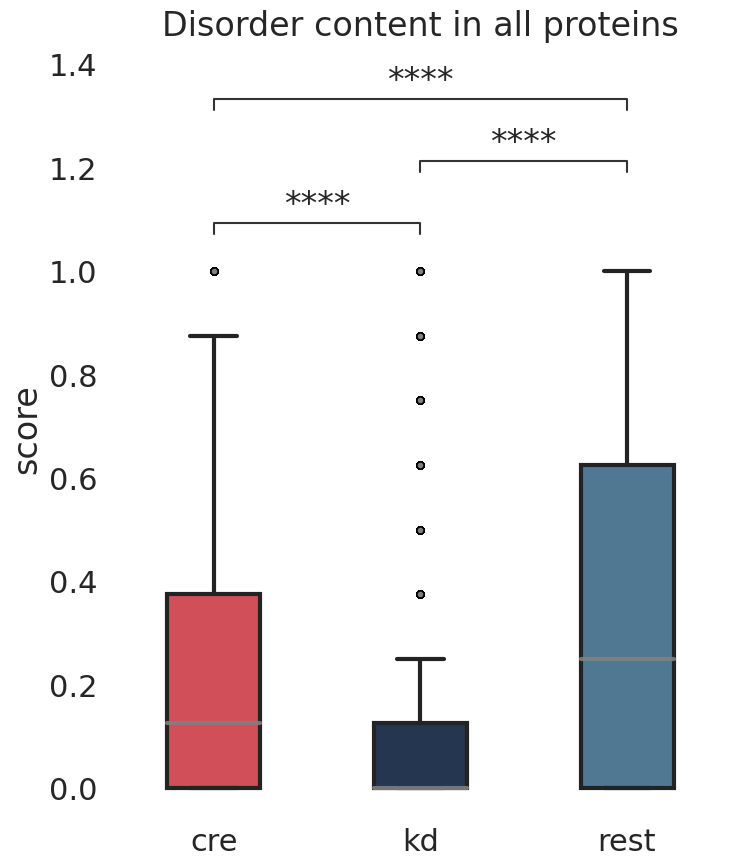

In [175]:
sns.set(rc={'figure.figsize':(8, 10), 'axes.facecolor': 'white'}, font_scale= 2)

colors = ["#e63946", "#1D3557", "#457b9d"]
flierprops = dict(marker='o', markerfacecolor='gray', markersize= 5,  markeredgecolor='black')
ax = sns.boxplot(data= to_plot, x= 'feature', y= 'scores_feature', width= 0.45, linewidth= 3, medianprops=dict(color="gray", alpha=0.9), palette= colors, flierprops= flierprops) # , notch= True , showmeans= True, meanline= True

# Combinations to compare
comb = combinations(to_plot.feature.unique(), 2)
pairs = [ i for i in comb ]

annotator = Annotator(ax= ax, pairs= pairs, data= to_plot, x= 'feature', y= 'scores_feature')
annotator.configure(test= 'Mann-Whitney', text_format='star')
annotator.apply_and_annotate()

#plt.rcParams['font.size'] = 16
plt.title(f"Disorder content in all proteins")
plt.ylabel("score")
plt.xlabel("")
#plt.savefig('../plots/paper/disorder_content_all_proteins.png', dpi= 300)
plt.show()

---

### Poster examples

In [22]:
Q91YS8_60 = mobidb_lite_cre_msa.loc[mobidb_lite_cre_msa.msa == "Q91YS8_60"]
Q91YS8_60

,uniprot_acc,prediction_disorder_mobidb_lite,regions,content_count,content_fraction,scores,term_id,start,end,is_reference,msa
433,A0A218VCX7,"{'regions': [[321, 365]], 'content_count': 45,...","[[321, 365]]",45,0.123,"[0.75, 0.625, 0.75, 0.625, 0.75, 0.75, 0.75, 0...",kd237,21,277,False,Q91YS8_60
434,A0A218VCX7,"{'regions': [[321, 365]], 'content_count': 45,...","[[321, 365]]",45,0.123,"[0.75, 0.625, 0.75, 0.625, 0.75, 0.75, 0.75, 0...",cre237,277,317,False,Q91YS8_60
2982,A0A3B4DWR8,"{'regions': [[336, 406]], 'content_count': 71,...","[[336, 406]]",71,0.175,"[0.75, 0.75, 0.625, 0.625, 0.625, 0.375, 0.375...",kd133,21,277,False,Q91YS8_60
2985,A0A3B4DWR8,"{'regions': [[336, 406]], 'content_count': 71,...","[[336, 406]]",71,0.175,"[0.75, 0.75, 0.625, 0.625, 0.625, 0.375, 0.375...",cre135,277,317,False,Q91YS8_60
2988,A0A3B4DWR8,"{'regions': [[336, 406]], 'content_count': 71,...","[[336, 406]]",71,0.175,"[0.75, 0.75, 0.625, 0.625, 0.625, 0.375, 0.375...",kd183,21,277,False,Q91YS8_60
...,...,...,...,...,...,...,...,...,...,...,...
36247,A0A669P3N1,"{'regions': [[366, 392]], 'content_count': 27,...","[[366, 392]]",27,0.066,"[0.75, 0.625, 0.75, 0.625, 0.875, 0.75, 0.875,...",cre135,277,317,False,Q91YS8_60
36250,A0A669P3N1,"{'regions': [[366, 392]], 'content_count': 27,...","[[366, 392]]",27,0.066,"[0.75, 0.625, 0.75, 0.625, 0.875, 0.75, 0.875,...",kd183,21,277,False,Q91YS8_60
36253,A0A669P3N1,"{'regions': [[366, 392]], 'content_count': 27,...","[[366, 392]]",27,0.066,"[0.75, 0.625, 0.75, 0.625, 0.875, 0.75, 0.875,...",cre183,286,313,False,Q91YS8_60
36256,A0A669P3N1,"{'regions': [[366, 392]], 'content_count': 27,...","[[366, 392]]",27,0.066,"[0.75, 0.625, 0.75, 0.625, 0.875, 0.75, 0.875,...",kd237,21,277,False,Q91YS8_60


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:8.500e-01 U_stat=1.388e+07
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=1.201e+08
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:5.085e-126 U_stat=1.768e+07


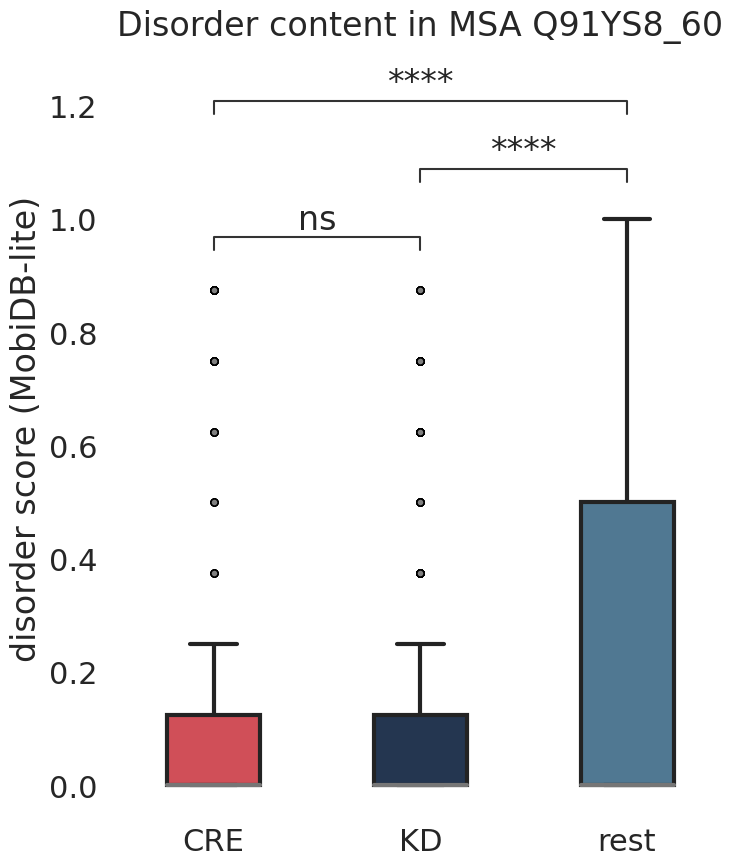

In [23]:

msa = "Q91YS8_60"
df = Q91YS8_60

df = df.drop(columns= ['prediction_disorder_mobidb_lite', 'regions'])
# Drop duplicates
df.scores = df.scores.apply(str)
df = df.drop_duplicates()
df.scores = df.scores.apply(lambda x: eval(x)) # as list again

if df.shape[0] != 0:
    # Get scores for CREs overlapping disordered region, and the rest of the protein 
    scores = {}
    df["scores_cre"] = None
    df["scores_kd"] = None
    df["scores_rest"] = None

    for i, row in df.iterrows():

        scores_cre = {}
        scores_kd = {}
        scores_rest = {}

        for ix, s in enumerate(row.scores):
            ix += 1 # protein indexes start in 1
            # scores of the cre
            if ix >= row.start and ix <= row.end and row.term_id.startswith("cre"):
                scores_cre[ix] = s
            # scores of the kd
            elif ix >= row.start and ix <= row.end and row.term_id.startswith("kd"):
                scores_kd[ix] = s
            # scores of the rest
            else:  
                scores_rest[ix] = s
        # Add the score to df
        df.scores_cre[i] = scores_cre
        df.scores_kd[i] = scores_kd
        df.scores_rest[i] = scores_rest

    # List of scores by feature
    list_scores_cre = [ list(d.values()) for d in df.scores_cre ]
    list_scores_kd = [ list(d.values()) for d in df.scores_kd ]
    list_scores_rest = [ list(d.values()) for d in df.scores_rest ]
    # flatten it
    list_scores_cre = [ item for sublist in list_scores_cre for item in sublist ]
    list_scores_kd = [ item for sublist in list_scores_kd for item in sublist ]
    list_scores_rest = [ item for sublist in list_scores_rest for item in sublist ]

    # Dataframe with disorder scores by feature (cre, kd, rest)
    cre_df = pd.DataFrame(list_scores_cre, columns= ['score'])
    cre_df["feature"] = "CRE"
    kd_df = pd.DataFrame(list_scores_kd, columns= ['score'])
    kd_df["feature"] = "KD"
    rest_df = pd.DataFrame(list_scores_rest, columns= ['score'])
    rest_df["feature"] = "rest"
    scores_df = pd.concat([cre_df, kd_df, rest_df])


    # Boxplots with statistics
    # palette: https://coolors.co/palette/e63946-f1faee-a8dadc-457b9d-1d3557
    # annotator: https://levelup.gitconnected.com/statistics-on-seaborn-plots-with-statannotations-2bfce0394c00

    # Colors
    if scores_df.feature.nunique() == 3: 
        colors = ["#e63946", "#1D3557", "#457b9d"]
    elif set(scores_df.feature) == {'KD', 'rest'}:
        colors = ["#1D3557", "#457b9d"]   
    elif set(scores_df.feature) == {'CRE', 'rest'}:
        colors = ["#e63946", "#457b9d"]

    sns.set(rc={'figure.figsize':(8, 10), 'axes.facecolor': 'white'}, font_scale= 2)

    flierprops = dict(marker='o', markerfacecolor='gray', markersize= 5,  markeredgecolor='black')
    ax = sns.boxplot(data= scores_df, x= 'feature', y= 'score', width= 0.45, linewidth= 3, medianprops=dict(color="gray", alpha=0.9), palette= colors, flierprops= flierprops) # , notch= True , showmeans= True, meanline= True

    # Combinations to compare
    comb = combinations(scores_df.feature.unique(), 2)
    pairs = [ i for i in comb ]

    annotator = Annotator(ax= ax, pairs= pairs, data= scores_df, x= 'feature', y= 'score')
    annotator.configure(test= 'Mann-Whitney', text_format='star')
    annotator.apply_and_annotate()

    #plt.rcParams['font.size'] = 16
    plt.title(f"Disorder content in MSA {msa}")
    plt.ylabel("disorder score (MobiDB-lite)")
    plt.xlabel("")

    #plt.savefig(f'../plots/disorder_content/by_msa/{msa}.png', dpi=200)
    plt.show()

In [20]:
Q13557_60 = mobidb_lite_cre_msa.loc[mobidb_lite_cre_msa.msa == "Q13557_60"]
Q13557_60

,uniprot_acc,prediction_disorder_mobidb_lite,regions,content_count,content_fraction,scores,term_id,start,end,is_reference,msa
59,A0A672V2Q0,"{'regions': [[337, 376]], 'content_count': 40,...","[[337, 376]]",40,0.078,"[0.625, 0.625, 0.75, 0.75, 0.625, 0.625, 0.375...",kd29,14,272,False,Q13557_60
64,A0A672V2Q0,"{'regions': [[337, 376]], 'content_count': 40,...","[[337, 376]]",40,0.078,"[0.625, 0.625, 0.75, 0.75, 0.625, 0.625, 0.375...",cre27,283,292,False,Q13557_60
69,A0A672V2Q0,"{'regions': [[337, 376]], 'content_count': 40,...","[[337, 376]]",40,0.078,"[0.625, 0.625, 0.75, 0.75, 0.625, 0.625, 0.375...",kd57,14,272,False,Q13557_60
74,A0A672V2Q0,"{'regions': [[337, 376]], 'content_count': 40,...","[[337, 376]]",40,0.078,"[0.625, 0.625, 0.75, 0.75, 0.625, 0.625, 0.375...",cre57,283,292,False,Q13557_60
79,A0A672V2Q0,"{'regions': [[337, 376]], 'content_count': 40,...","[[337, 376]]",40,0.078,"[0.625, 0.625, 0.75, 0.75, 0.625, 0.625, 0.375...",kd131,14,272,False,Q13557_60
...,...,...,...,...,...,...,...,...,...,...,...
39248,A0A670IHM7,"{'regions': [[336, 375]], 'content_count': 40,...","[[336, 375]]",40,0.078,"[0.625, 0.75, 0.75, 0.75, 0.75, 0.5, 0.5, 0.25...",cre197,283,292,False,Q13557_60
39253,A0A670IHM7,"{'regions': [[336, 375]], 'content_count': 40,...","[[336, 375]]",40,0.078,"[0.625, 0.75, 0.75, 0.75, 0.75, 0.5, 0.5, 0.25...",kd242,14,272,False,Q13557_60
39258,A0A670IHM7,"{'regions': [[336, 375]], 'content_count': 40,...","[[336, 375]]",40,0.078,"[0.625, 0.75, 0.75, 0.75, 0.75, 0.5, 0.5, 0.25...",cre242,283,292,False,Q13557_60
39512,A0A2K6ED16,"{'regions': [[337, 375]], 'content_count': 39,...","[[337, 375]]",39,0.073,"[0.625, 0.75, 0.75, 0.75, 0.75, 0.5, 0.5, 0.25...",kd131,14,272,False,Q13557_60


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:2.015e-126 U_stat=2.772e+07
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=2.194e+09
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.174e-264 U_stat=6.328e+07


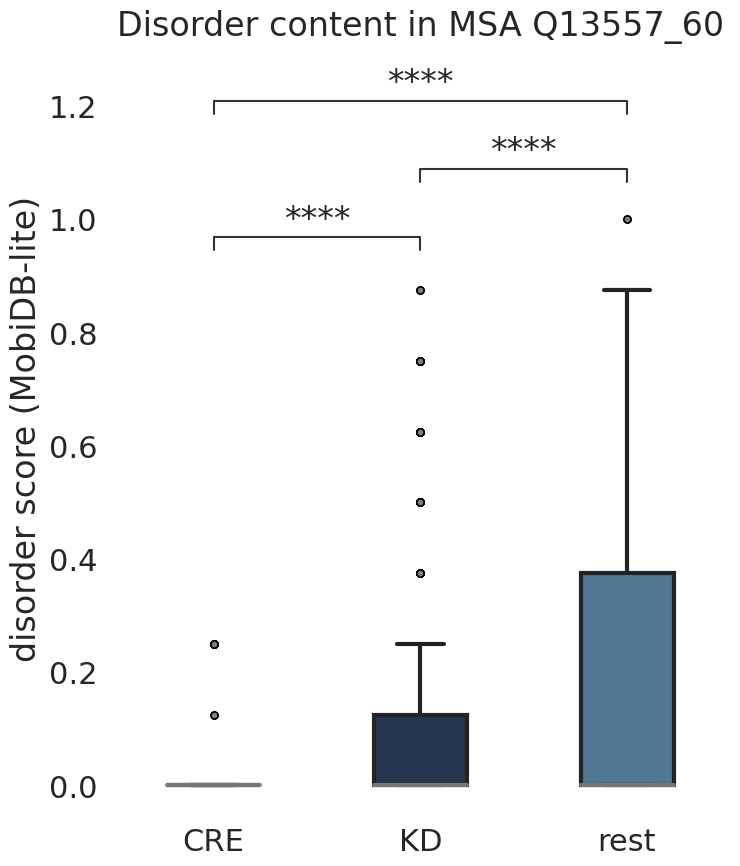

In [21]:
msa = "Q13557_60"
df = Q13557_60

df = df.drop(columns= ['prediction_disorder_mobidb_lite', 'regions'])
# Drop duplicates
df.scores = df.scores.apply(str)
df = df.drop_duplicates()
df.scores = df.scores.apply(lambda x: eval(x)) # as list again

if df.shape[0] != 0:
    # Get scores for CREs overlapping disordered region, and the rest of the protein 
    scores = {}
    df["scores_cre"] = None
    df["scores_kd"] = None
    df["scores_rest"] = None

    for i, row in df.iterrows():

        scores_cre = {}
        scores_kd = {}
        scores_rest = {}

        for ix, s in enumerate(row.scores):
            ix += 1 # protein indexes start in 1
            # scores of the cre
            if ix >= row.start and ix <= row.end and row.term_id.startswith("cre"):
                scores_cre[ix] = s
            # scores of the kd
            elif ix >= row.start and ix <= row.end and row.term_id.startswith("kd"):
                scores_kd[ix] = s
            # scores of the rest
            else:  
                scores_rest[ix] = s
        # Add the score to df
        df.scores_cre[i] = scores_cre
        df.scores_kd[i] = scores_kd
        df.scores_rest[i] = scores_rest

    # List of scores by feature
    list_scores_cre = [ list(d.values()) for d in df.scores_cre ]
    list_scores_kd = [ list(d.values()) for d in df.scores_kd ]
    list_scores_rest = [ list(d.values()) for d in df.scores_rest ]
    # flatten it
    list_scores_cre = [ item for sublist in list_scores_cre for item in sublist ]
    list_scores_kd = [ item for sublist in list_scores_kd for item in sublist ]
    list_scores_rest = [ item for sublist in list_scores_rest for item in sublist ]

    # Dataframe with disorder scores by feature (cre, kd, rest)
    cre_df = pd.DataFrame(list_scores_cre, columns= ['score'])
    cre_df["feature"] = "CRE"
    kd_df = pd.DataFrame(list_scores_kd, columns= ['score'])
    kd_df["feature"] = "KD"
    rest_df = pd.DataFrame(list_scores_rest, columns= ['score'])
    rest_df["feature"] = "rest"
    scores_df = pd.concat([cre_df, kd_df, rest_df])


    # Boxplots with statistics
    # palette: https://coolors.co/palette/e63946-f1faee-a8dadc-457b9d-1d3557
    # annotator: https://levelup.gitconnected.com/statistics-on-seaborn-plots-with-statannotations-2bfce0394c00

    # Colors
    if scores_df.feature.nunique() == 3: 
        colors = ["#e63946", "#1D3557", "#457b9d"]
    elif set(scores_df.feature) == {'KD', 'rest'}:
        colors = ["#1D3557", "#457b9d"]   
    elif set(scores_df.feature) == {'CRE', 'rest'}:
        colors = ["#e63946", "#457b9d"]

    sns.set(rc={'figure.figsize':(8, 10), 'axes.facecolor': 'white'}, font_scale= 2)

    flierprops = dict(marker='o', markerfacecolor='gray', markersize= 5,  markeredgecolor='black')
    ax = sns.boxplot(data= scores_df, x= 'feature', y= 'score', width= 0.45, linewidth= 3, medianprops=dict(color="gray", alpha=0.9), palette= colors, flierprops= flierprops) # , notch= True , showmeans= True, meanline= True

    # Combinations to compare
    comb = combinations(scores_df.feature.unique(), 2)
    pairs = [ i for i in comb ]

    annotator = Annotator(ax= ax, pairs= pairs, data= scores_df, x= 'feature', y= 'score')
    annotator.configure(test= 'Mann-Whitney', text_format='star')
    annotator.apply_and_annotate()

    #plt.rcParams['font.size'] = 16
    plt.title(f"Disorder content in MSA {msa}")
    plt.ylabel("disorder score (MobiDB-lite)")
    plt.xlabel("")

    plt.savefig(f'../plots/disorder_content/by_msa/{msa}.png', dpi=200)
    plt.show()

---

## Paper

In [33]:
mobidb_lite_cre_msa.loc[mobidb_lite_cre_msa.msa == "P36888_60"].drop(columns= ['prediction_disorder_mobidb_lite', 'regions'])

,uniprot_acc,content_count,content_fraction,scores,term_id,start,end,is_reference,msa
129,A0A2K6GDP6,22,0.023,"[0.75, 0.625, 0.625, 0.625, 0.625, 0.5, 0.625,...",cre79,521,558,False,P36888_60
130,A0A2K6GDP6,22,0.023,"[0.75, 0.625, 0.625, 0.625, 0.625, 0.5, 0.625,...",kd79,566,899,False,P36888_60
906,Q00342,57,0.057,"[0.625, 0.625, 0.625, 0.625, 0.5, 0.5, 0.625, ...",cre79,565,602,False,P36888_60
907,Q00342,57,0.057,"[0.625, 0.625, 0.625, 0.625, 0.5, 0.5, 0.625, ...",kd79,610,945,False,P36888_60
2441,H2Q7C7,21,0.021,"[0.75, 0.625, 0.625, 0.625, 0.5, 0.625, 0.625,...",cre79,565,602,False,P36888_60
...,...,...,...,...,...,...,...,...,...
38207,F1MRU0,32,0.032,"[0.75, 0.625, 0.625, 0.625, 0.5, 0.375, 0.375,...",kd79,609,942,False,P36888_60
38646,A0A4X1TMR8,35,0.036,"[0.375, 0.5, 0.5, 0.625, 0.125, 0.25, 0.375, 0...",cre79,546,583,False,P36888_60
38647,A0A4X1TMR8,35,0.036,"[0.375, 0.5, 0.5, 0.625, 0.125, 0.25, 0.375, 0...",kd79,591,924,False,P36888_60
39170,H0XFX5,28,0.028,"[0.625, 0.625, 0.625, 0.625, 0.625, 0.625, 0.5...",cre79,565,602,False,P36888_60


In [44]:
def plot_disorder(msa, title, stats= False, outliers= True, out_path= None):
    import warnings
    warnings.filterwarnings("ignore")
    
    # Subset by MSA
    df = mobidb_lite_cre_msa.loc[mobidb_lite_cre_msa.msa == msa].drop(columns= ['prediction_disorder_mobidb_lite', 'regions']).copy()

    # Drop duplicates
    df.scores = df.scores.apply(str)
    df = df.drop_duplicates()
    df.scores = df.scores.apply(lambda x: eval(x)) # as list again

    if df.shape[0] != 0:
        # Get scores for CREs overlapping disordered region, and the rest of the protein 
        scores = {}
        df["scores_cre"] = None
        df["scores_kd"] = None
        df["scores_rest"] = None

        for i, row in df.iterrows():

            scores_cre = {}
            scores_kd = {}
            scores_rest = {}

            for ix, s in enumerate(row.scores):
                ix += 1 # protein indexes start in 1
                # scores of the cre
                if ix >= row.start and ix <= row.end and row.term_id.startswith("cre"):
                    scores_cre[ix] = s
                # scores of the kd
                elif ix >= row.start and ix <= row.end and row.term_id.startswith("kd"):
                    scores_kd[ix] = s
                # scores of the rest
                else:  
                    scores_rest[ix] = s
            # Add the score to df
            df.scores_cre[i] = scores_cre
            df.scores_kd[i] = scores_kd
            df.scores_rest[i] = scores_rest

        # List of scores by feature
        list_scores_cre = [ list(d.values()) for d in df.scores_cre ]
        list_scores_kd = [ list(d.values()) for d in df.scores_kd ]
        list_scores_rest = [ list(d.values()) for d in df.scores_rest ]
        # flatten it
        list_scores_cre = [ item for sublist in list_scores_cre for item in sublist ]
        list_scores_kd = [ item for sublist in list_scores_kd for item in sublist ]
        list_scores_rest = [ item for sublist in list_scores_rest for item in sublist ]

        # Dataframe with disorder scores by feature (cre, kd, rest)
        cre_df = pd.DataFrame(list_scores_cre, columns= ['score'])
        cre_df["feature"] = "CRE"
        kd_df = pd.DataFrame(list_scores_kd, columns= ['score'])
        kd_df["feature"] = "KD"
        rest_df = pd.DataFrame(list_scores_rest, columns= ['score'])
        rest_df["feature"] = "rest"
        scores_df = pd.concat([cre_df, kd_df, rest_df])

        # Boxplots with statistics
        # palette: https://coolors.co/palette/e63946-f1faee-a8dadc-457b9d-1d3557
        # annotator: https://levelup.gitconnected.com/statistics-on-seaborn-plots-with-statannotations-2bfce0394c00

        # Colors
        if scores_df.feature.nunique() == 3: 
            colors = ["#e63946", "#1D3557", "#457b9d"]
        elif set(scores_df.feature) == {'KD', 'rest'}:
            colors = ["#1D3557", "#457b9d"]   
        elif set(scores_df.feature) == {'CRE', 'rest'}:
            colors = ["#e63946", "#457b9d"]

        sns.set(rc={'figure.figsize':(8, 10), 'axes.facecolor': 'white'}, font_scale= 2)

        flierprops = dict(marker='o', markerfacecolor='gray', markersize= 5,  markeredgecolor='black')
        if outliers:
            ax = sns.boxplot(data= scores_df, x= 'feature', y= 'score', width= 0.45, linewidth= 3, medianprops=dict(color="gray", alpha=0.9), palette= colors, flierprops= flierprops) # , notch= True , showmeans= True, meanline= True
        else:
            ax = sns.boxplot(data= scores_df, x= 'feature', y= 'score', width= 0.45, linewidth= 3, medianprops=dict(color="gray", alpha=0.9), showfliers= False, palette= colors, flierprops= flierprops)

        if stats:
            # Combinations to compare
            comb = combinations(scores_df.feature.unique(), 2)
            pairs = [ i for i in comb ]

            annotator = Annotator(ax= ax, pairs= pairs, data= scores_df, x= 'feature', y= 'score')
            annotator.configure(test= 'Mann-Whitney', text_format='star')
            annotator.apply_and_annotate()

        #plt.rcParams['font.size'] = 16
        plt.title(title)
        plt.ylabel("disorder score")
        plt.xlabel("")
        if out_path != None:
            plt.savefig(out_path, dpi=200)
        plt.show()

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:8.144e-40 U_stat=5.254e+06
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:4.663e-30 U_stat=2.539e+08
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.619e-63 U_stat=2.344e+07


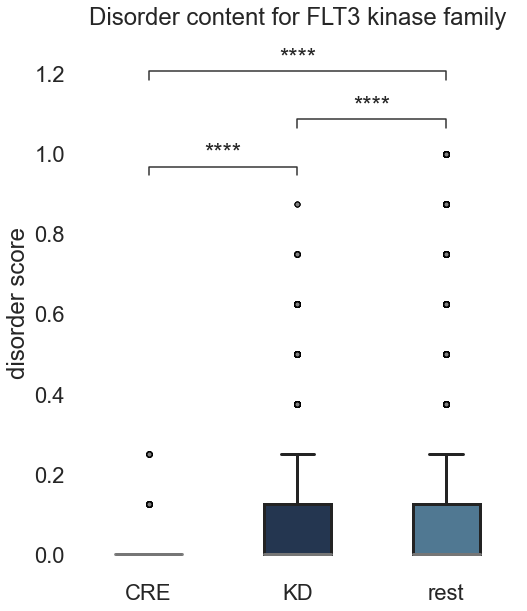

In [46]:
plot_disorder(msa= "P36888_60", title= "Disorder content for FLT3 kinase family", stats= True, out_path= '../plots/disorder_content/flt3.png') #, outliers= False

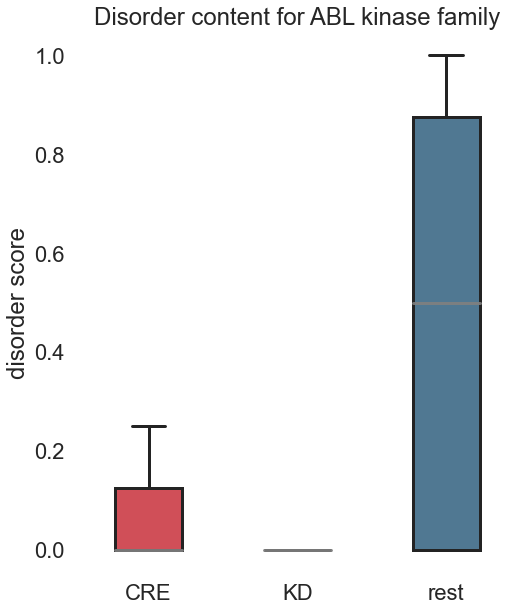

In [48]:
plot_disorder(msa= "P00519_60", title= "Disorder content for ABL kinase family", outliers= False)

---

## Plot summary

In [34]:
summary

,msa,feature,median_score,mean_score
0,A0A2I0BVG8_60,CRE,0.0,0.000000
0,A0A2I0BVG8_60,KD,0.0,0.049308
0,A0A2I0BVG8_60,rest,0.0,0.140105
0,A0A509AFG4_60,CRE,0.0,0.000000
0,A0A509AFG4_60,KD,0.0,0.059956
...,...,...,...,...
0,Q9ZV15_60,KD,0.0,0.047225
0,Q9ZV15_60,rest,0.0,0.233801
0,W7JX98_60,CRE,0.5,0.537915
0,W7JX98_60,KD,0.0,0.038517


In [18]:
# Boxplots with statistics
# palette: https://coolors.co/palette/e63946-f1faee-a8dadc-457b9d-1d3557
# annotator: https://levelup.gitconnected.com/statistics-on-seaborn-plots-with-statannotations-2bfce0394c00

# Colors
if scores_df.feature.nunique() == 3: 
    colors = ["#e63946", "#1D3557", "#457b9d"]
elif set(scores_df.feature) == {'KD', 'rest'}:
    colors = ["#1D3557", "#457b9d"]   
elif set(scores_df.feature) == {'CRE', 'rest'}:
    colors = ["#e63946", "#457b9d"]

sns.set(rc={'figure.figsize':(8, 10)}, font_scale= 2)

flierprops = dict(marker='o', markerfacecolor='gray', markersize= 5,  markeredgecolor='black')
ax = sns.boxplot(data= summary, x= 'feature', y= 'median_score', width= 0.45, linewidth= 3, medianprops=dict(color="gray", alpha=0.9), palette= colors, flierprops= flierprops, showmeans= True, meanline= True) # , notch= True , showmeans= True, meanline= True

# Combinations to compare
comb = combinations(scores_df.feature.unique(), 2)
pairs = [ i for i in comb ]

annotator = Annotator(ax= ax, pairs= pairs, data= summary, x= 'feature', y= 'mean_score')
annotator.configure(test= 'Mann-Whitney', text_format='star')
annotator.apply_and_annotate()

#plt.rcParams['font.size'] = 16
plt.title("Overall disorder content")
plt.ylabel("disorder score (MobiDB-lite)")
plt.xlabel("")

plt.savefig('../plots/disorder_content/overall_disorder_content.png', dpi=200)
plt.show()

NameError: name 'summary' is not defined

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:5.877e-07 U_stat=3.697e+04
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.019e-79 U_stat=2.570e+02
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:5.095e-13 U_stat=1.817e+04


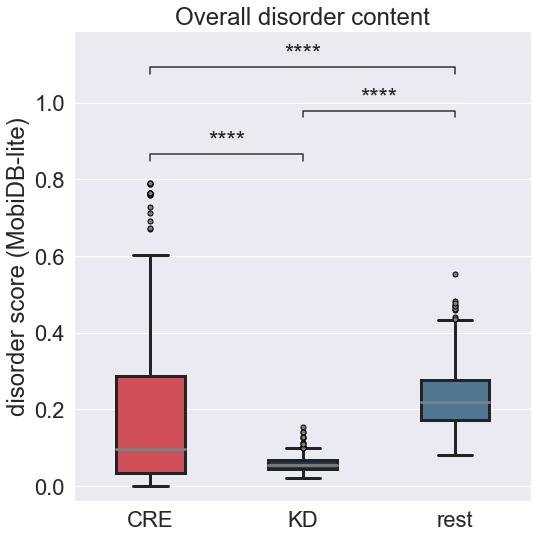

In [44]:
# Colors
if scores_df.feature.nunique() == 3: 
    colors = ["#e63946", "#1D3557", "#457b9d"]
elif set(scores_df.feature) == {'KD', 'rest'}:
    colors = ["#1D3557", "#457b9d"]   
elif set(scores_df.feature) == {'CRE', 'rest'}:
    colors = ["#e63946", "#457b9d"]

sns.set(rc={'figure.figsize':(8, 8)}, font_scale= 2)

flierprops = dict(marker='o', markerfacecolor='gray', markersize= 5,  markeredgecolor='black')
ax = sns.boxplot(data= summary, x= 'feature', y= 'mean_score', width= 0.45, linewidth= 3, medianprops=dict(color="gray", alpha=0.9), palette= colors, flierprops= flierprops) # , notch= True , showmeans= True, meanline= True

# Combinations to compare
comb = combinations(scores_df.feature.unique(), 2)
pairs = [ i for i in comb ]

annotator = Annotator(ax= ax, pairs= pairs, data= summary, x= 'feature', y= 'mean_score')
annotator.configure(test= 'Mann-Whitney', text_format='star')
annotator.apply_and_annotate()

#plt.rcParams['font.size'] = 16
plt.title("Overall disorder content")
plt.ylabel("disorder score (MobiDB-lite)")
plt.xlabel("")
plt.tight_layout()
plt.savefig(f'../plots/disorder_content/overall_disorder_content_means.png', dpi=200)
plt.show()

In [58]:
# # Control
# df[df.term_id.str.startswith("cre")]

# scores = []
# for ix,row in df[df.term_id.str.startswith("cre")].iterrows():
#     list_scores_cre = list(row.scores_cre.values())
#     scores.append(list_scores_cre)

# i = 0
# for l in scores:
#     for s in l:
#         i += 1 
# i # OK!

# scores_df[scores_df.feature == 'CRE'] # OK!!

In [74]:
for feature, group in scores_df.groupby("feature"):
    print(feature)
    print(group)
    #print(f"{feature} median: {group.score.median()}, sd: {group.score.std()}")


CRE
     score feature
0    0.875     CRE
1    0.875     CRE
2    1.000     CRE
3    1.000     CRE
4    1.000     CRE
..     ...     ...
206  0.375     CRE
207  0.375     CRE
208  0.375     CRE
209  0.250     CRE
210  0.250     CRE

[211 rows x 2 columns]
KD
      score feature
0     0.000      KD
1     0.000      KD
2     0.125      KD
3     0.125      KD
4     0.125      KD
...     ...     ...
3091  0.125      KD
3092  0.125      KD
3093  0.125      KD
3094  0.125      KD
3095  0.125      KD

[3096 rows x 2 columns]
rest
       score feature
0      0.125    rest
1      0.125    rest
2      0.000    rest
3      0.000    rest
4      0.000    rest
...      ...     ...
13949  0.875    rest
13950  0.625    rest
13951  0.875    rest
13952  0.750    rest
13953  0.750    rest

[13954 rows x 2 columns]


In [25]:
i = 0
msa_no_disorder = []
# First, group by msa
for msa, group in mobidb_lite_cre_msa.groupby("msa"):

    subset = group.explode("regions")

    # If no join operation, skip it
    if df.shape[0] == 0:
        msa_no_disorder.append(msa)
        continue
    else:
        df = df.rename(columns= {'Chromosome': 'uniprot_acc', 'Start': 'start_term', 'End': 'end_term'})
        #print(df)
        df = df.drop(columns= ['msa_disorder'])
        df.columns = df.columns.str.lower()
        # Drop duplicates
        df.scores = df.scores.apply(str)
        df = df.drop_duplicates()
        df.scores = df.scores.apply(lambda x: eval(x)) # as dict again


        # Get scores for CREs overlapping disordered region, and the rest of the protein 
        scores = {}
        df["scores_cre"] = None
        df["scores_kd"] = None
        df["scores_rest"] = None

        for i, row in df.iterrows():

            scores_cre = {}
            scores_kd = {}
            scores_rest = {}

            for ix, s in enumerate(row.scores):
                ix += 1 # protein indexes start in 1
                # scores of the cre
                if ix >= row.start_term and ix <= row.end_term and row.term_id.startswith("cre"):
                    scores_cre[ix] = s
                # scores of the kd
                elif ix >= row.start_term and ix <= row.end_term and row.term_id.startswith("kd"):
                    scores_kd[ix] = s
                # scores of the rest
                else:  
                    scores_rest[ix] = s
            # Add the score to df
            df.scores_cre[i] = scores_cre
            df.scores_kd[i] = scores_kd
            df.scores_rest[i] = scores_rest

        # List of scores by feature
        list_scores_cre = [ list(d.values()) for d in df.scores_cre ]
        list_scores_kd = [ list(d.values()) for d in df.scores_kd ]
        list_scores_rest = [ list(d.values()) for d in df.scores_rest ]
        # flatten it
        list_scores_cre = [ item for sublist in list_scores_cre for item in sublist ]
        list_scores_kd = [ item for sublist in list_scores_kd for item in sublist ]
        list_scores_rest = [ item for sublist in list_scores_rest for item in sublist ]

        # Dataframe with disorder scores by feature (cre, kd, rest)
        cre_df = pd.DataFrame(list_scores_cre, columns= ['score'])
        cre_df["feature"] = "CRE"
        kd_df = pd.DataFrame(list_scores_kd, columns= ['score'])
        kd_df["feature"] = "KD"
        rest_df = pd.DataFrame(list_scores_rest, columns= ['score'])
        rest_df["feature"] = "rest"
        scores_df = pd.concat([cre_df, kd_df, rest_df])


        # Boxplots with statistics
        # palette: https://coolors.co/palette/e63946-f1faee-a8dadc-457b9d-1d3557
        # annotator: https://levelup.gitconnected.com/statistics-on-seaborn-plots-with-statannotations-2bfce0394c00

        if scores_df.feature.nunique() == 3: 
            colors = ["#e63946", "#1D3557", "#457b9d"]
        elif set(scores_df.feature) == {'KD', 'rest'}:
            colors = ["#1D3557", "#457b9d"]   
        elif set(scores_df.feature) == {'CRE', 'rest'}:
            colors = ["#e63946", "#457b9d"]

        sns.set(rc={'figure.figsize':(8, 8)}, font_scale= 2)

        flierprops = dict(marker='o', markerfacecolor='gray', markersize= 5,  markeredgecolor='black')
        ax = sns.boxplot(data= scores_df, x= 'feature', y= 'score', width= 0.45, linewidth= 3, medianprops=dict(color="gray", alpha=0.9), palette= colors, flierprops= flierprops) # , notch= True , showmeans= True, meanline= True

        # Combinations to compare
        comb = combinations(scores_df.feature.unique(), 2)
        pairs = [ i for i in comb ]

        annotator = Annotator(ax= ax, pairs= pairs, data= scores_df, x= 'feature', y= 'score')
        annotator.configure(test= 'Mann-Whitney', text_format='star')
        annotator.apply_and_annotate()

        #plt.rcParams['font.size'] = 16
        plt.title(f"Disorder content in MSA {msa}")
        plt.ylabel("disorder score (MobiDB-lite)")
        plt.xlabel("")

        plt.savefig(f'../plots/disorder_content/by_msa/{msa}.png', dpi=200)
        plt.show()

    i+=1

KeyError: "['msa_disorder'] not found in axis"

### One plot of disorder content for each MSA

In [14]:
mobidb_lite_cre_msa.msa.nunique()

243

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:3.527e-08 U_stat=3.136e+04


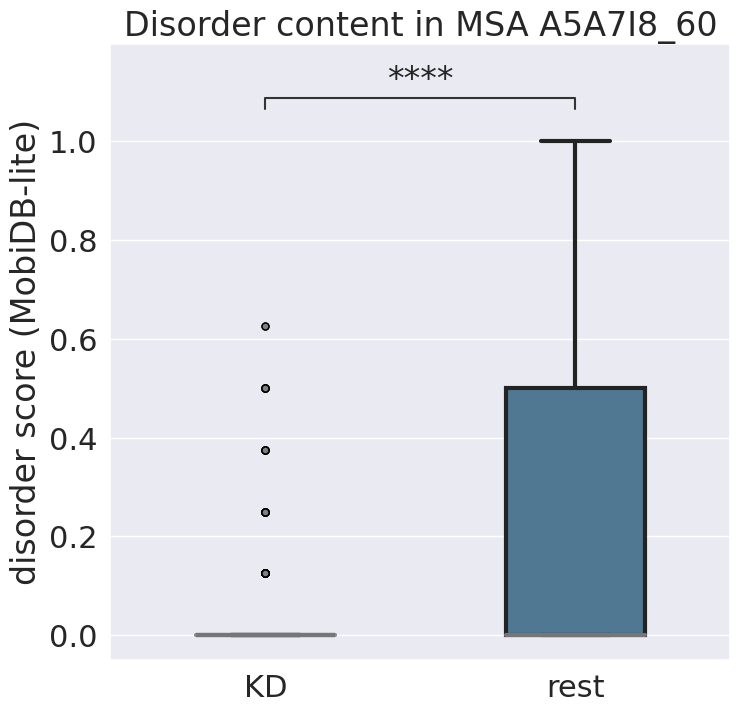

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=2.090e+08


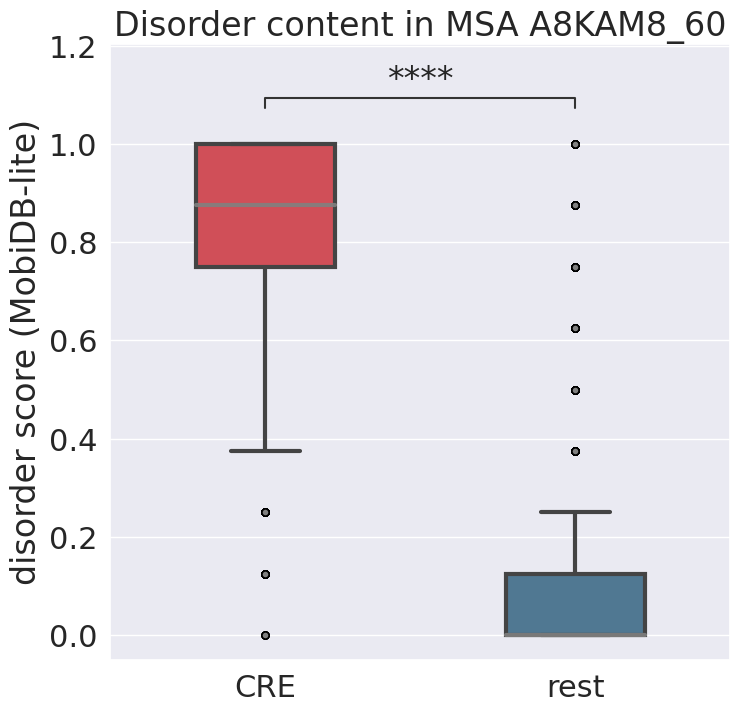

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:3.150e-295 U_stat=6.351e+05


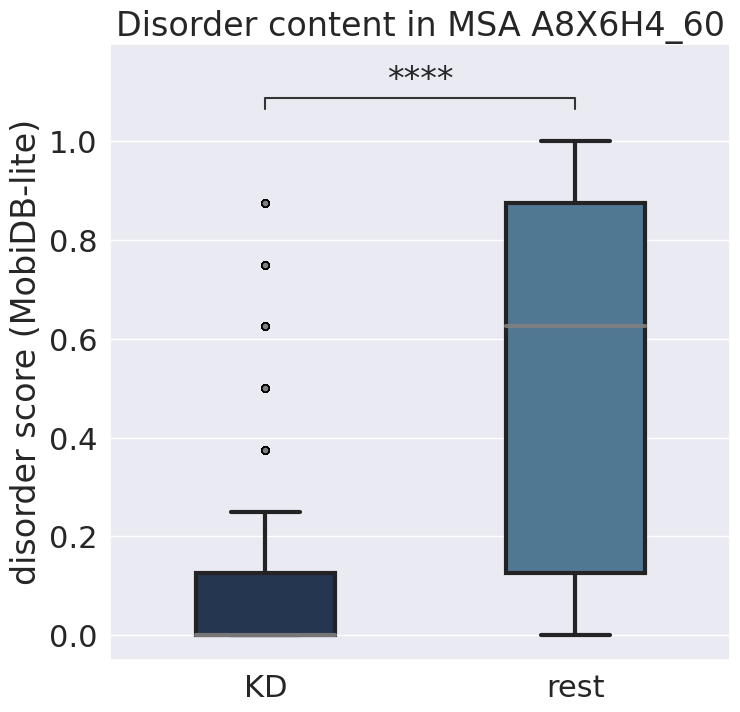

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:4.994e-08 U_stat=1.413e+06


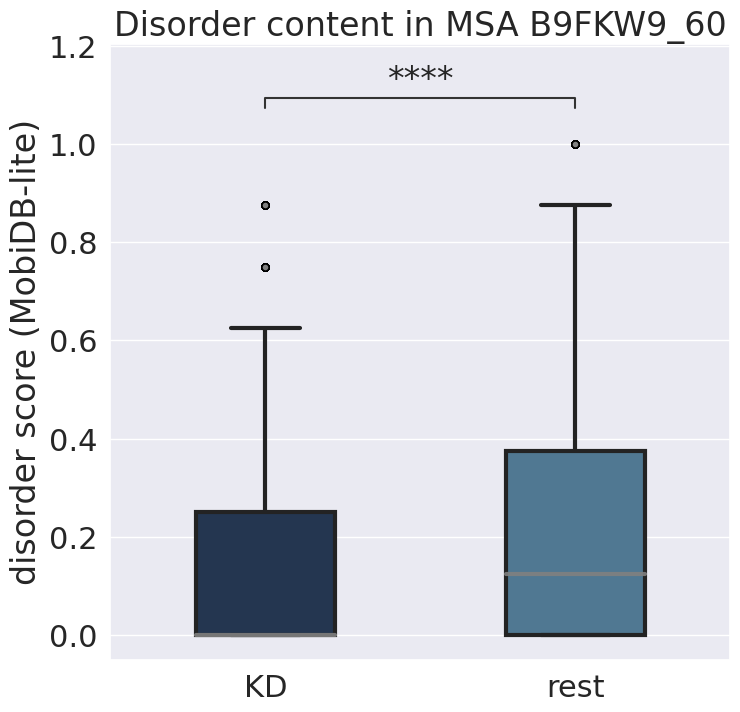

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.812e-253 U_stat=1.531e+06


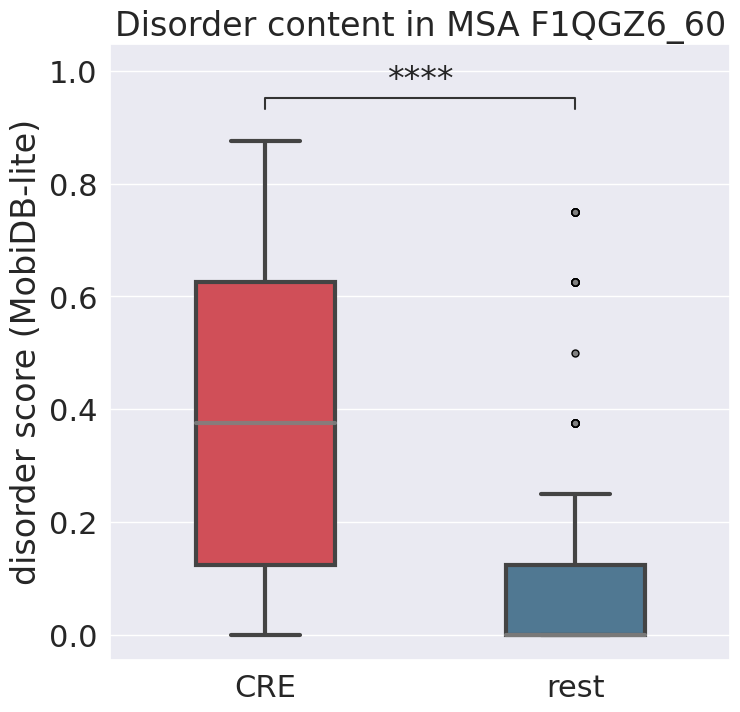

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:7.535e-21 U_stat=2.163e+06


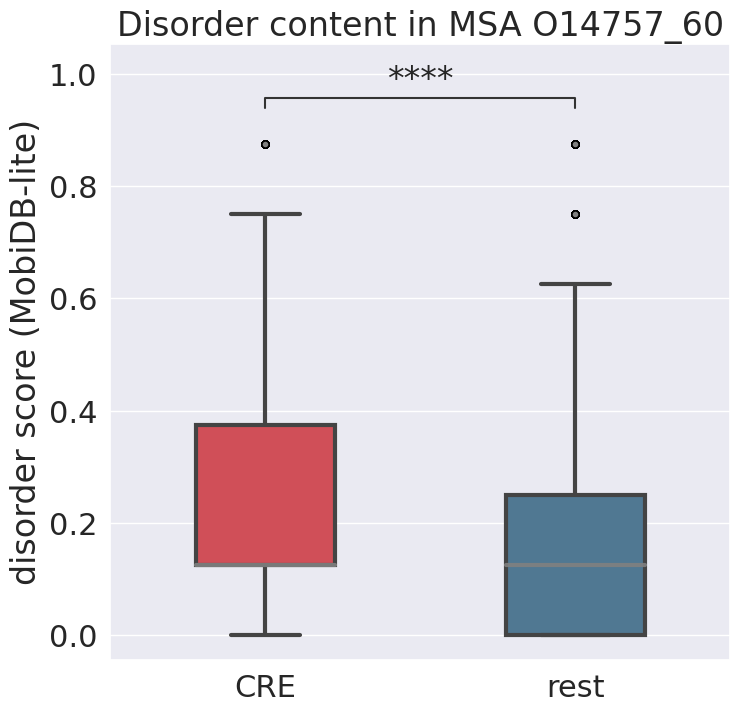

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.690e-28 U_stat=4.539e+06


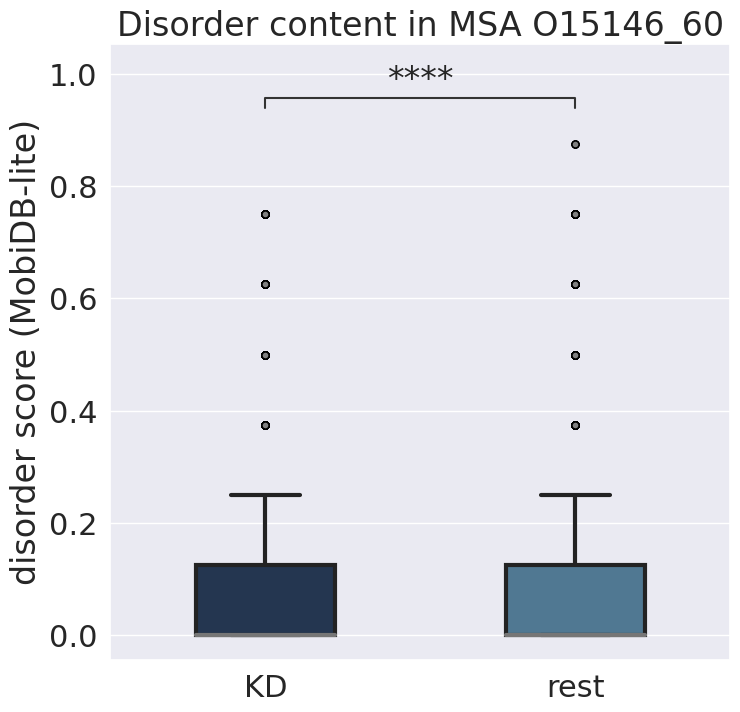

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:7.535e-21 U_stat=2.163e+06


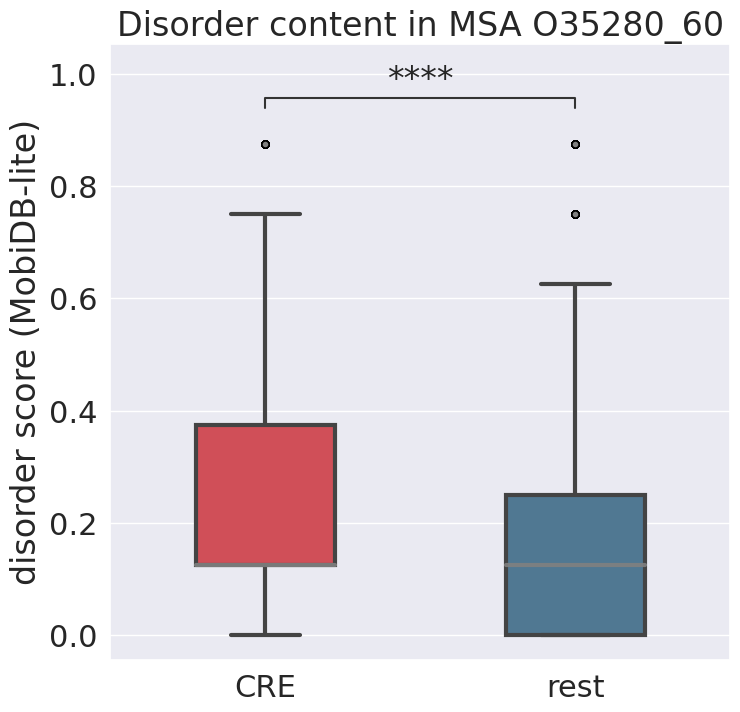

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:7.808e-19 U_stat=1.105e+04
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:3.085e-79 U_stat=1.433e+05
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.067e-09 U_stat=2.430e+04


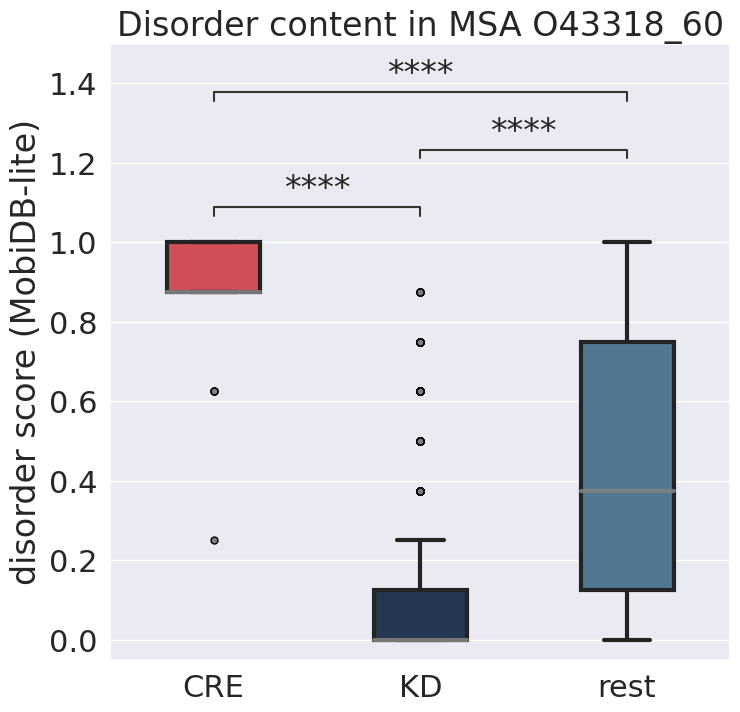

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.530e-12 U_stat=2.493e+06


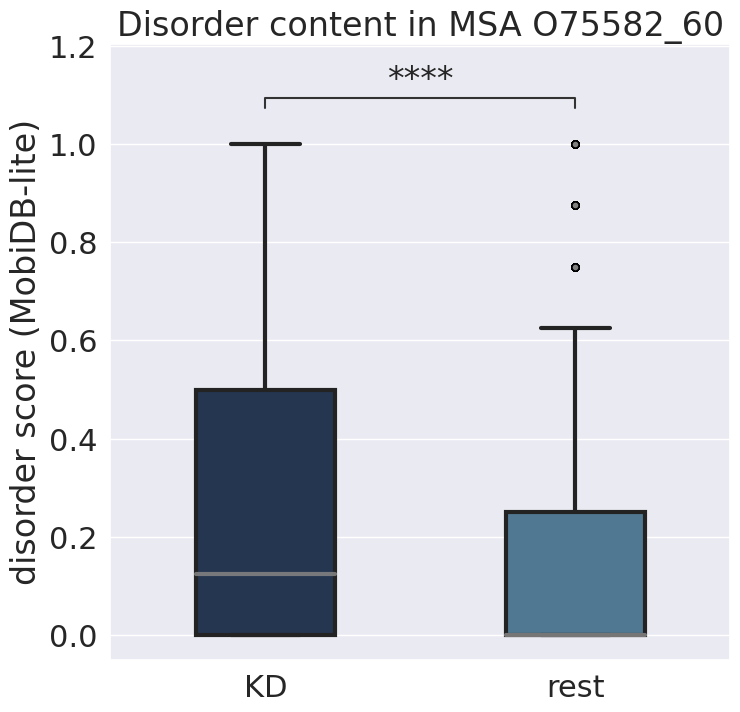

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=5.672e+06
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:7.633e-143 U_stat=1.909e+08
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.567e-218 U_stat=3.191e+07


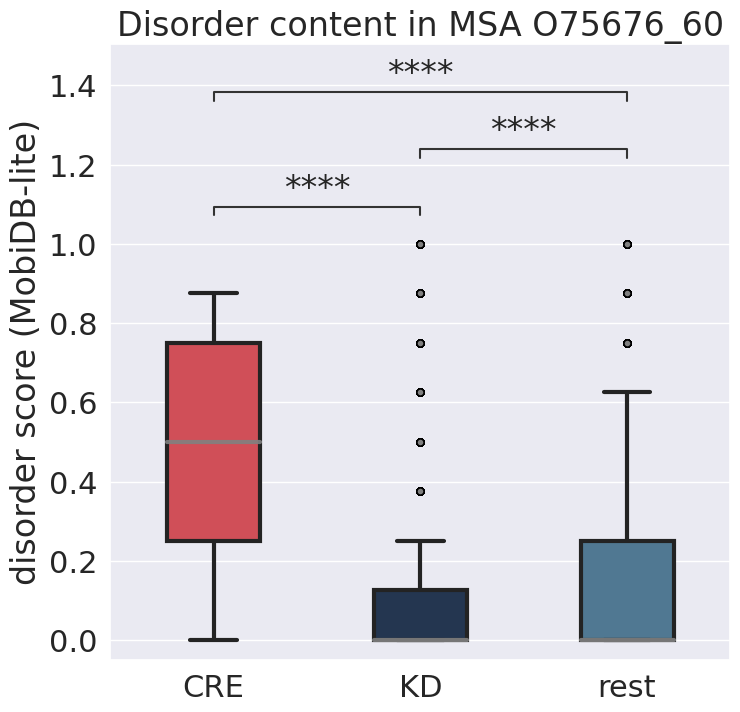

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=5.088e+07
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:2.765e-162 U_stat=1.161e+08
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=3.211e+09


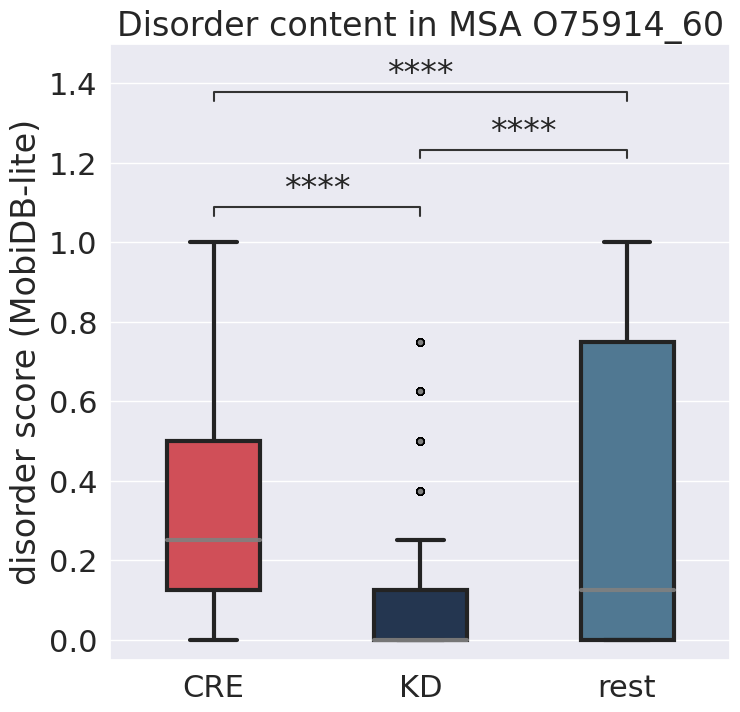

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=3.101e+06


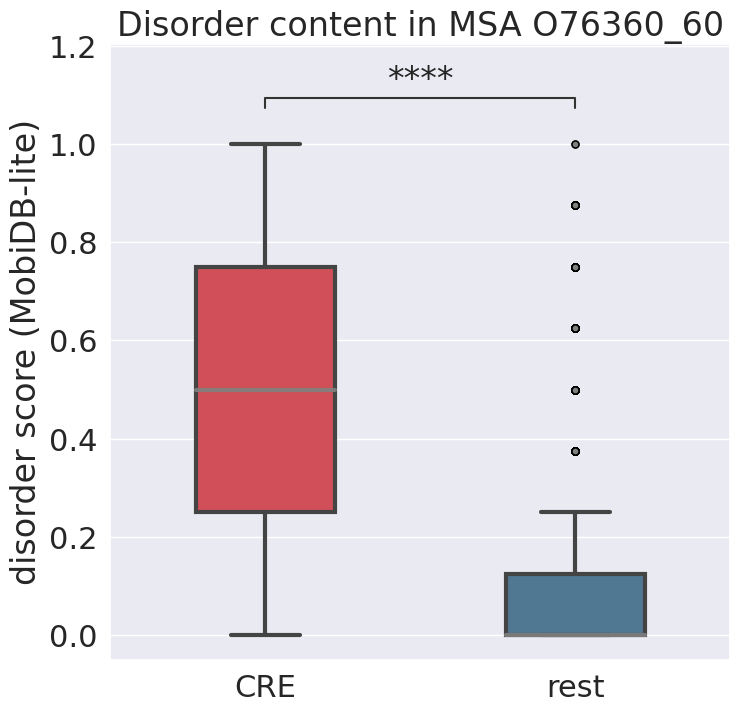

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.960e-87 U_stat=4.851e+05


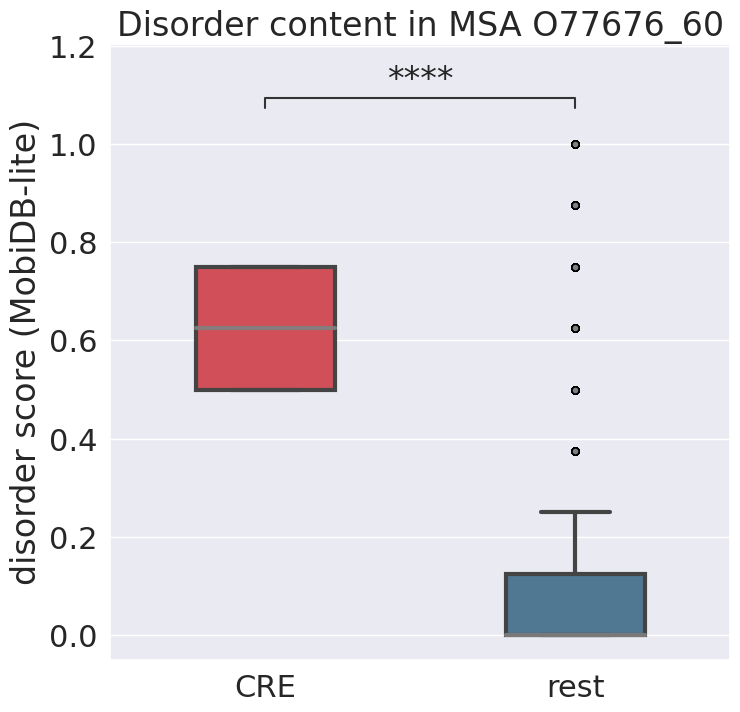

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.976e-139 U_stat=6.274e+08


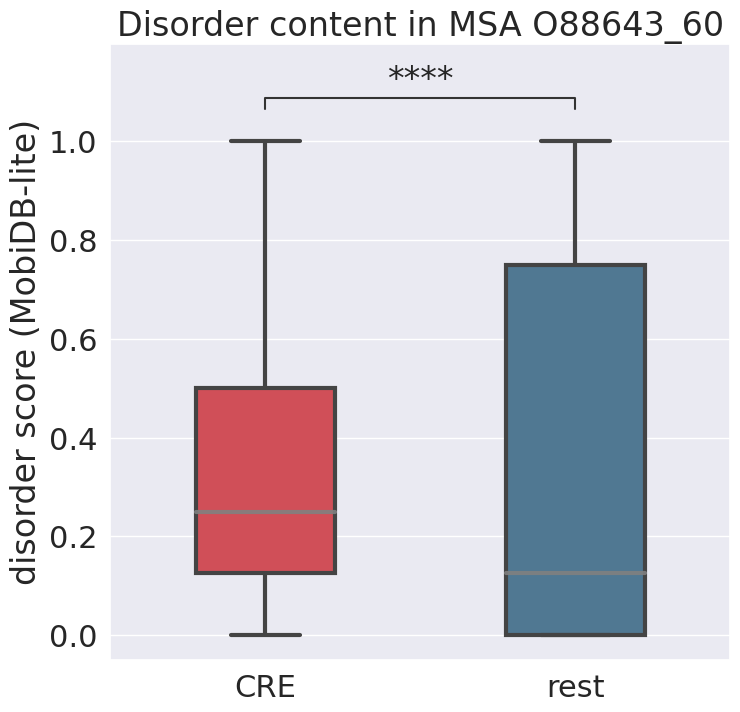

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:1.032e-113 U_stat=1.265e+07
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=1.915e+08
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:4.009e-69 U_stat=8.553e+06


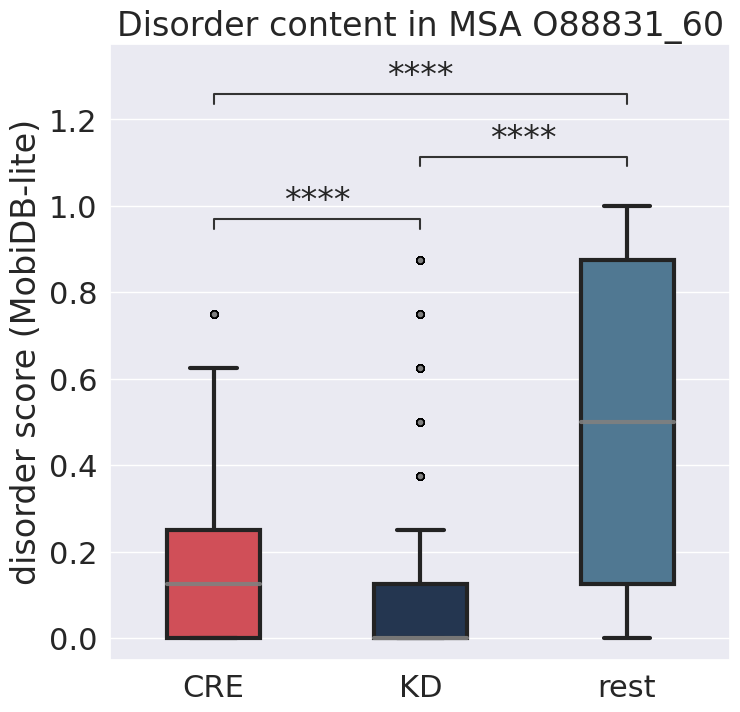

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:1.460e-38 U_stat=5.737e+06
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:3.174e-03 U_stat=6.925e+07
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.812e-42 U_stat=2.543e+07


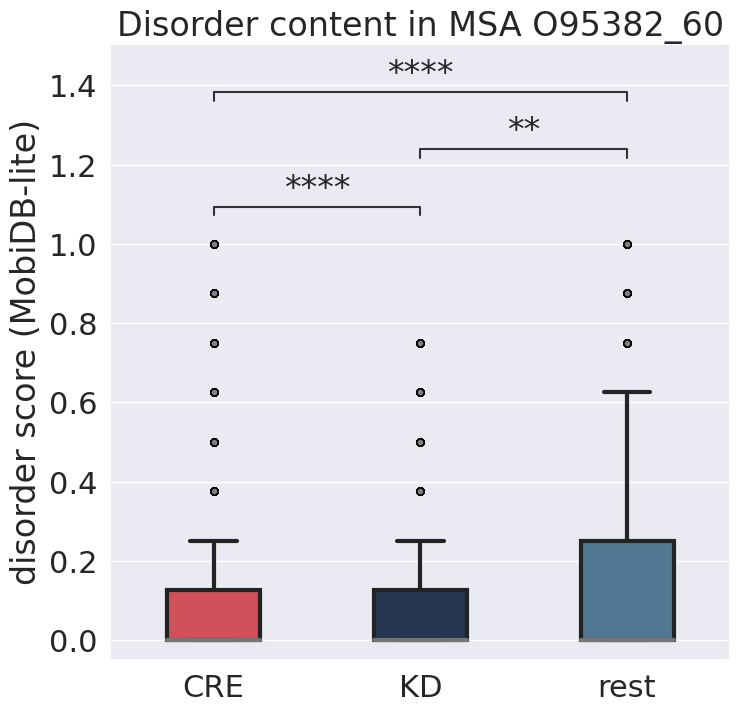

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:6.535e-141 U_stat=3.368e+06
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:3.235e-14 U_stat=6.910e+06
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:9.026e-199 U_stat=5.041e+07


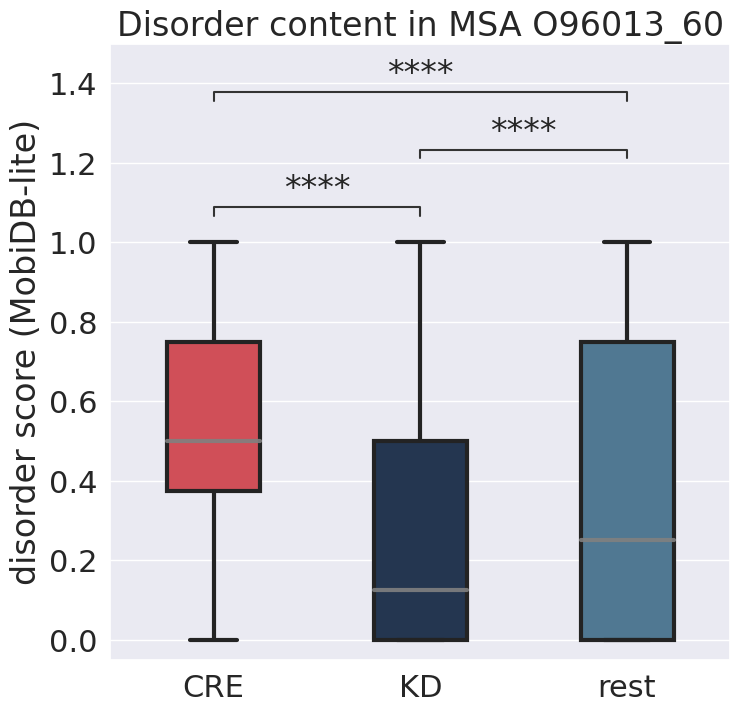

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:9.716e-61 U_stat=2.185e+05


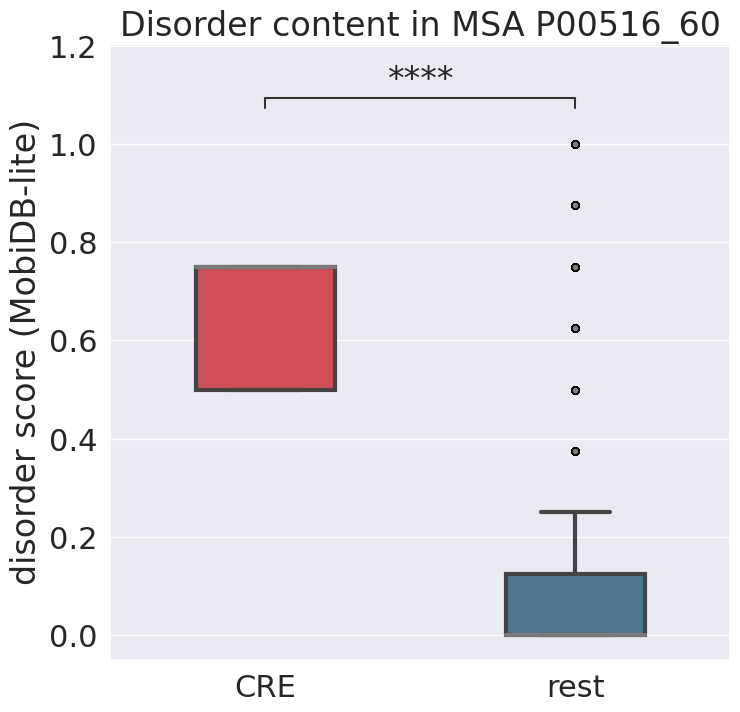

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.726e-44 U_stat=4.606e+04


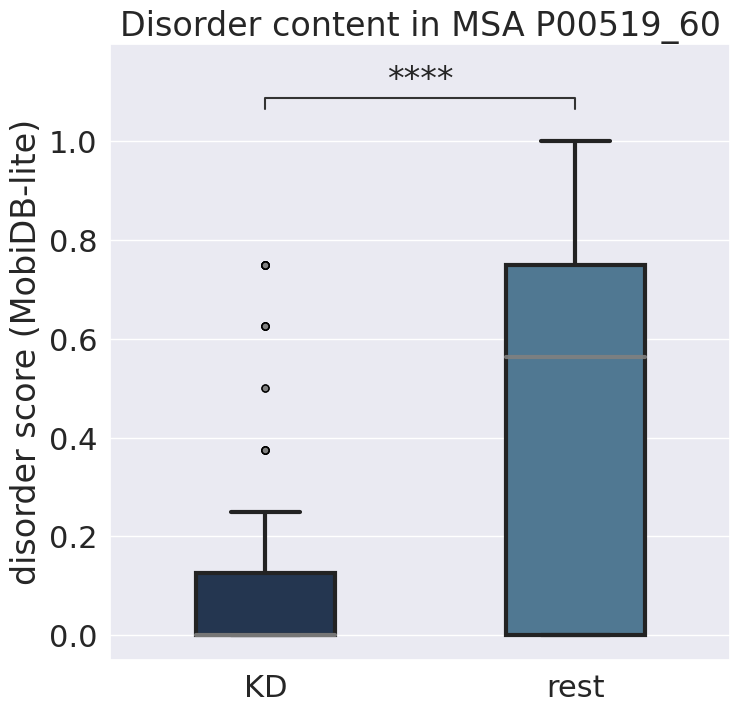

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:3.919e-120 U_stat=1.013e+06


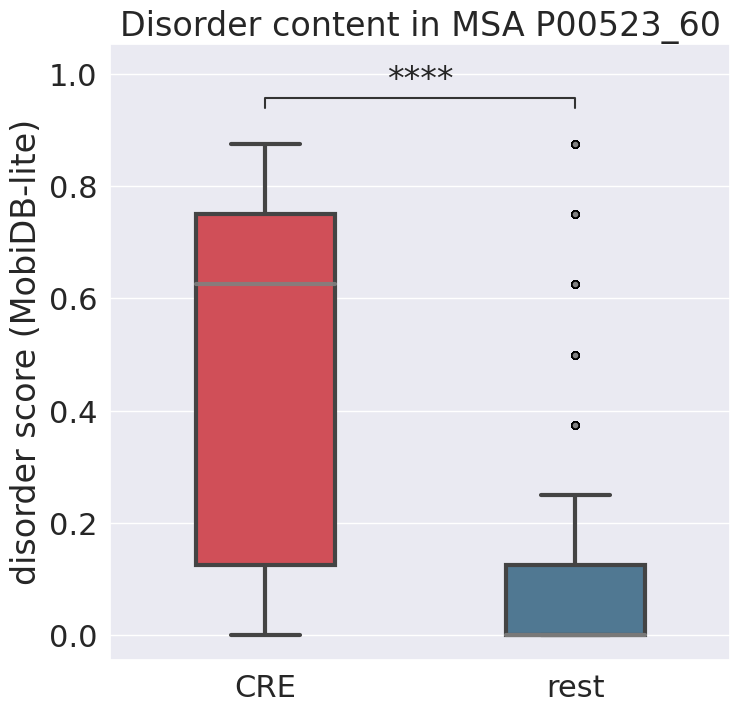

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:6.974e-59 U_stat=3.242e+05
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.632e-73 U_stat=9.975e+06
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:7.841e-13 U_stat=2.919e+06


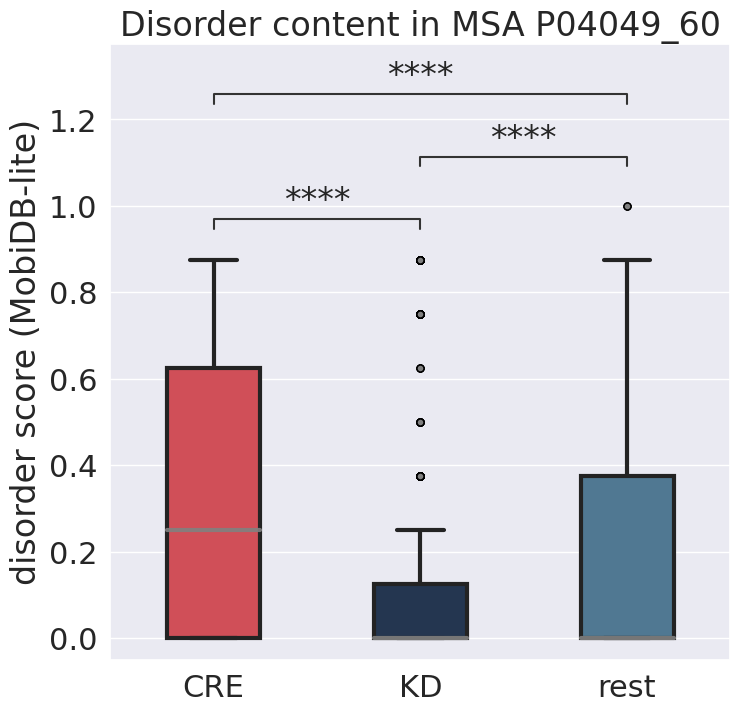

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:3.636e-46 U_stat=2.116e+05


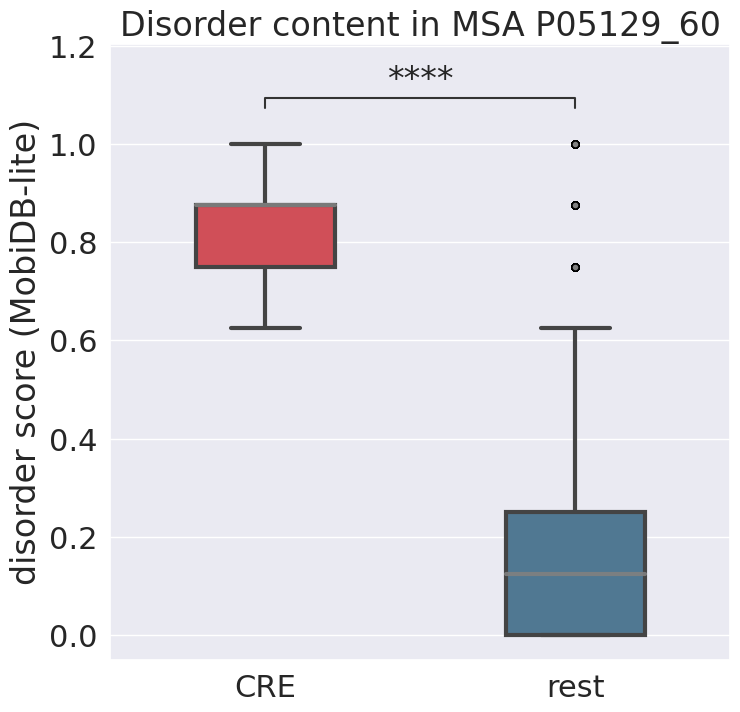

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:3.157e-88 U_stat=1.808e+05
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:2.606e-32 U_stat=3.586e+06
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.284e-74 U_stat=1.454e+06


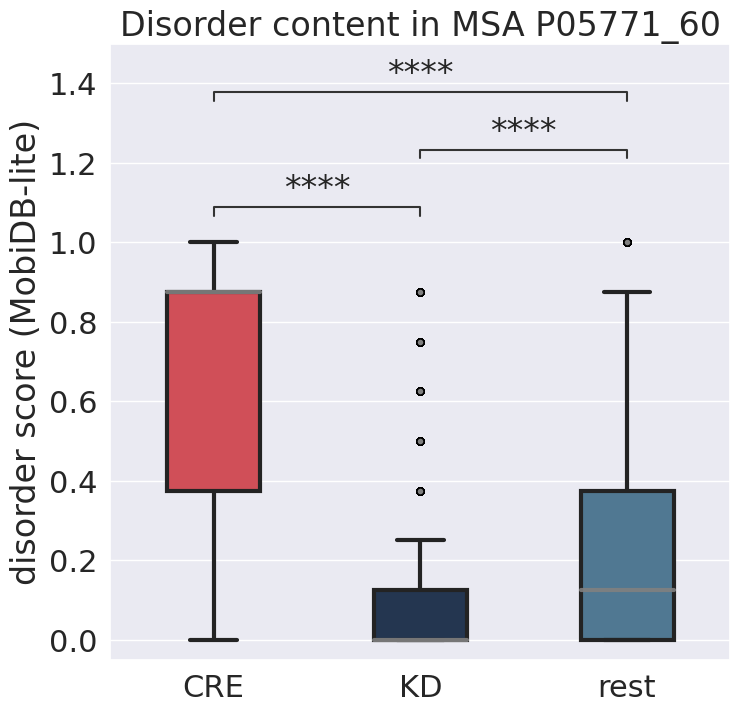

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:7.178e-02 U_stat=1.330e+05


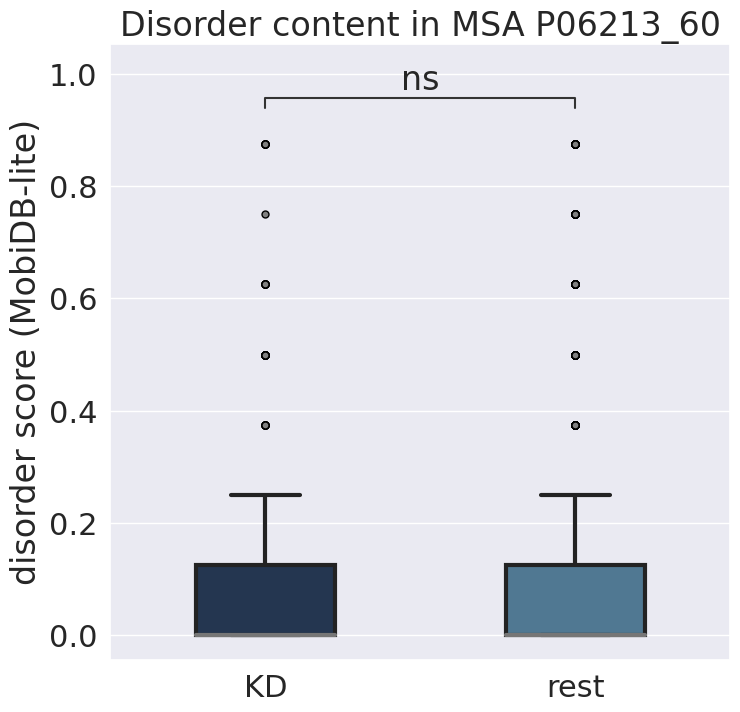

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:3.282e-93 U_stat=1.060e+06


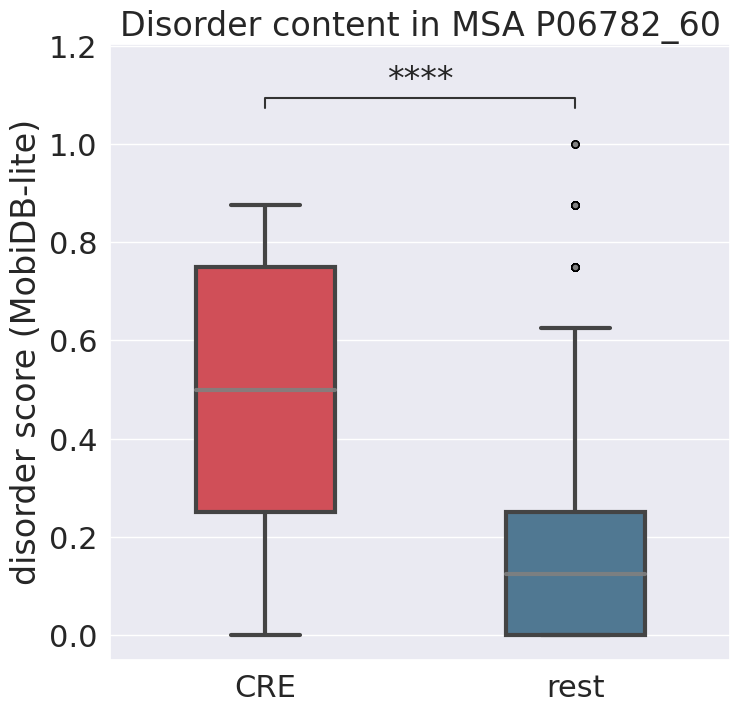

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:9.663e-01 U_stat=1.613e+06


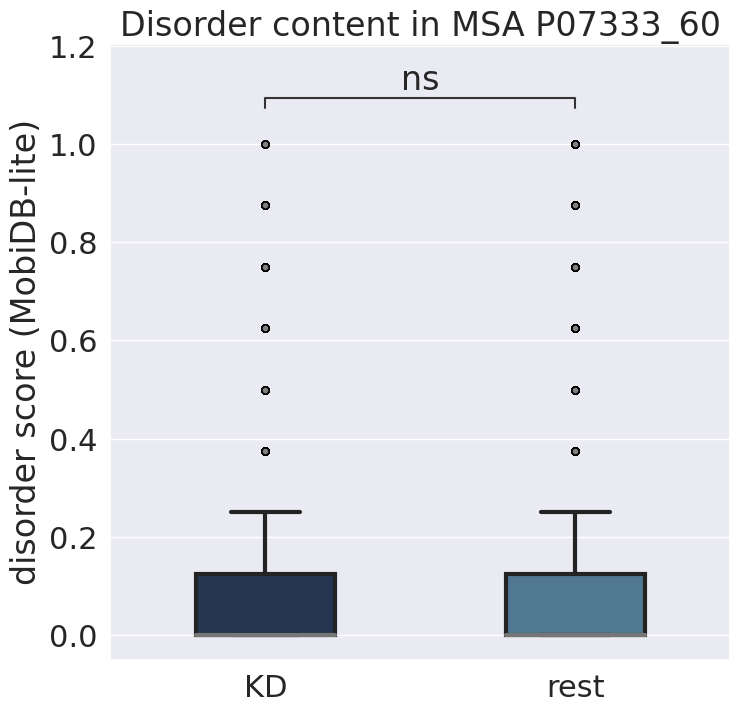

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:3.992e-01 U_stat=1.650e+06


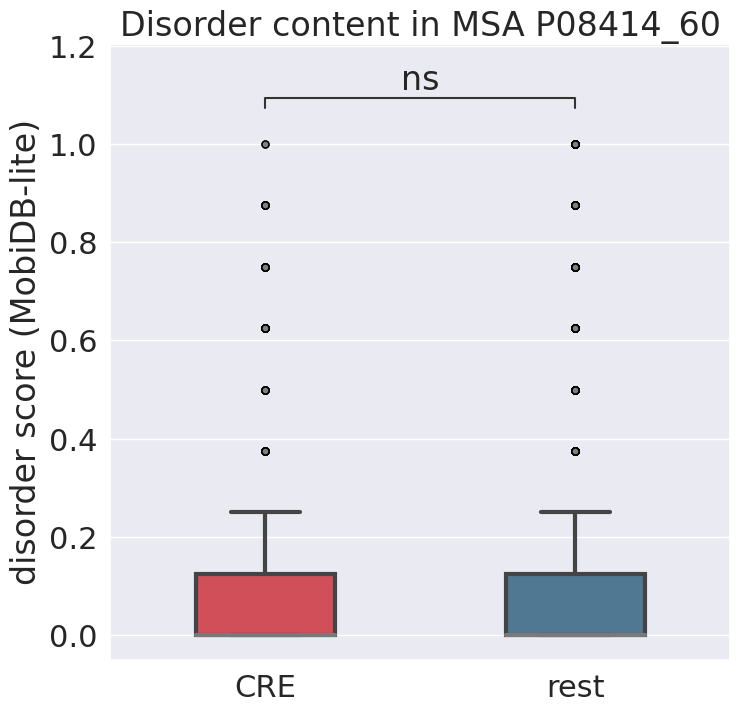

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=2.065e+08


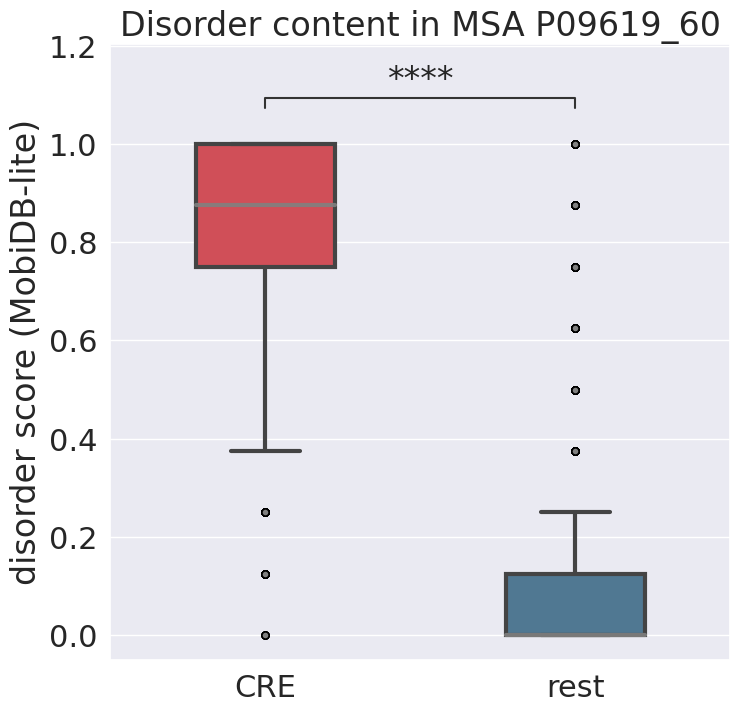

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:9.716e-61 U_stat=2.185e+05


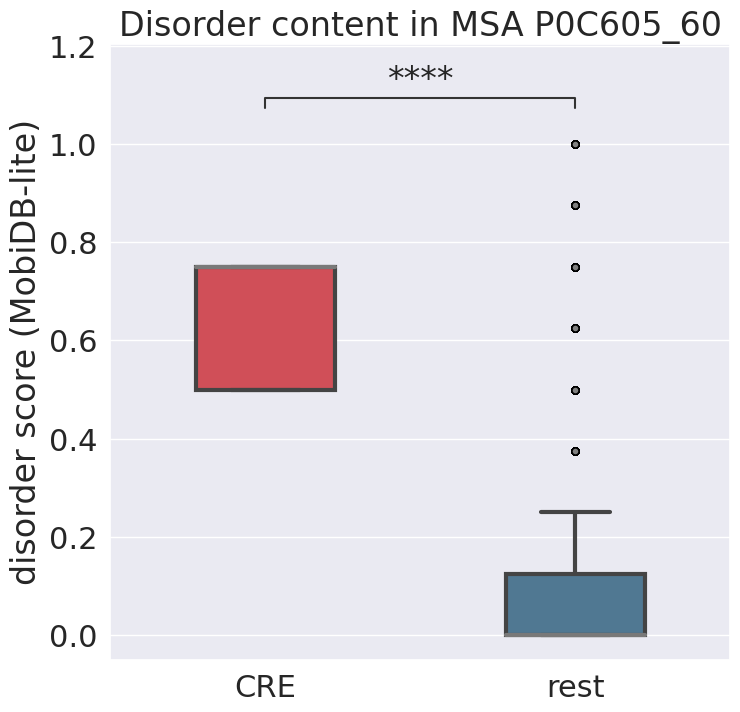

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.653e-04 U_stat=9.300e+04


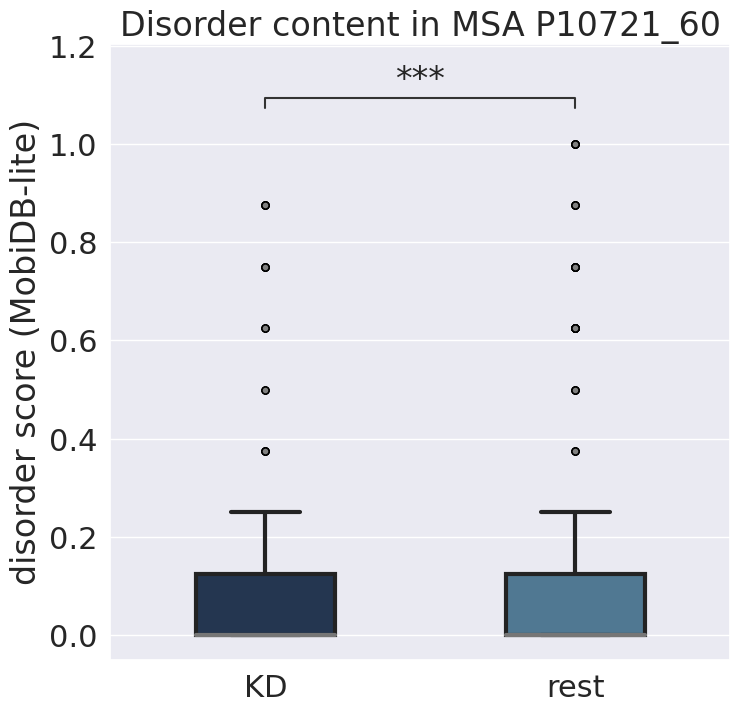

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:1.526e-160 U_stat=2.333e+05
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:3.946e-01 U_stat=3.191e+06
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=1.781e+07


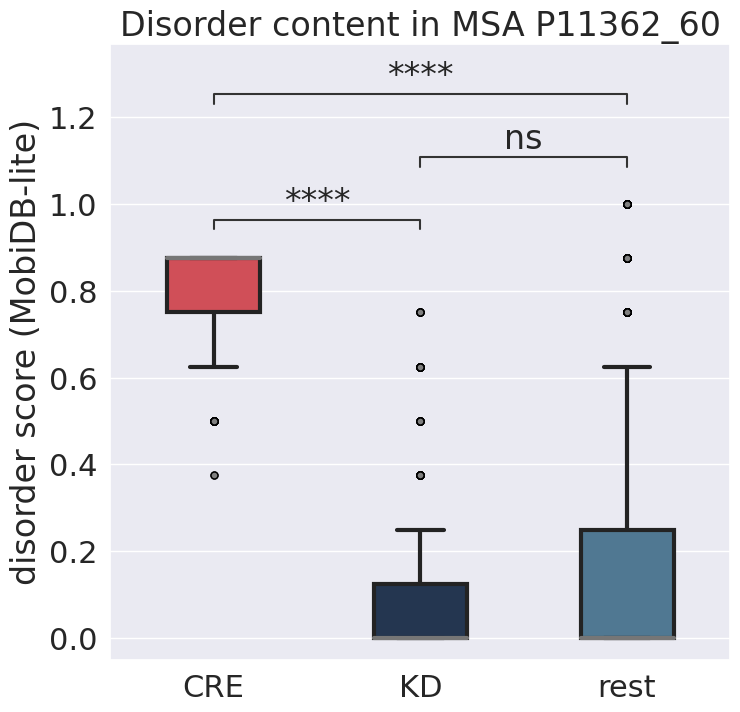

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:3.992e-01 U_stat=1.650e+06


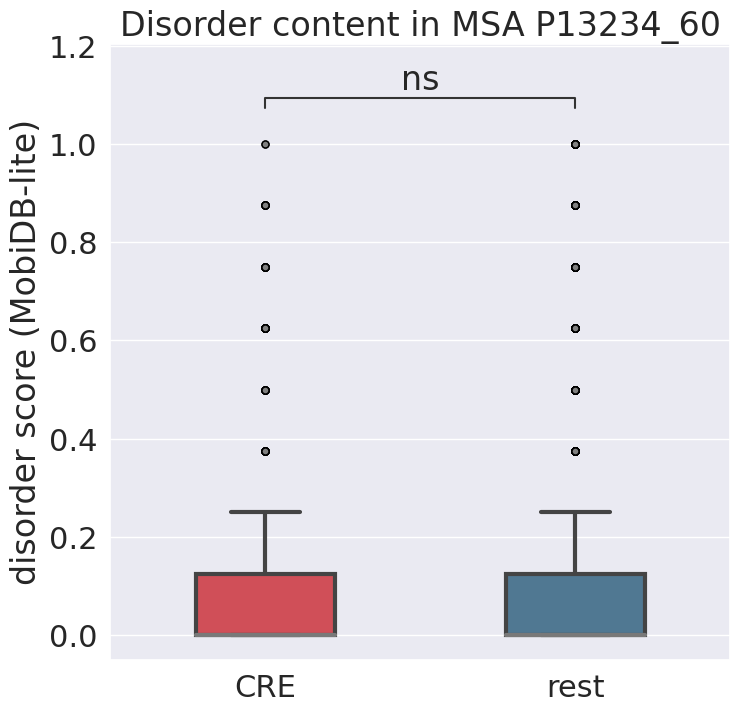

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=2.307e+08


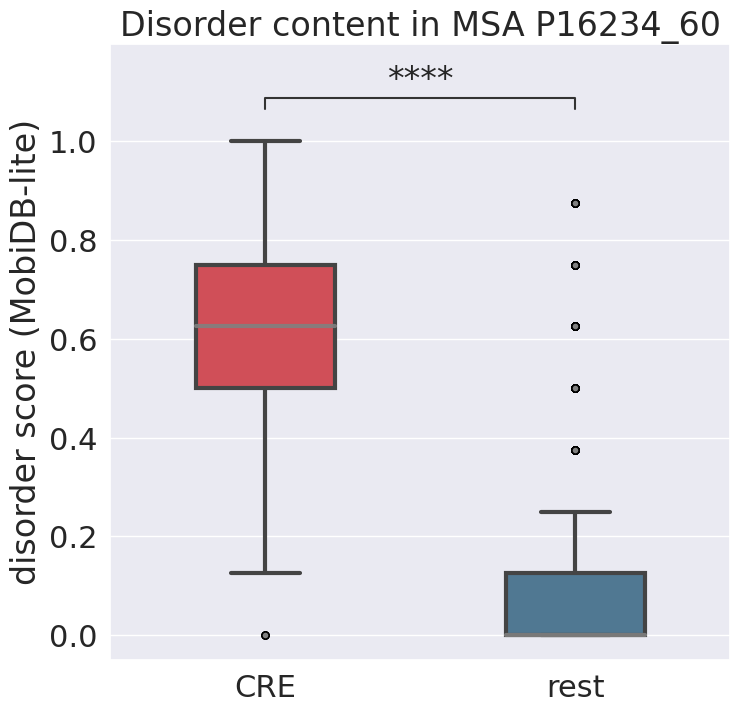

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:6.834e-15 U_stat=1.286e+04


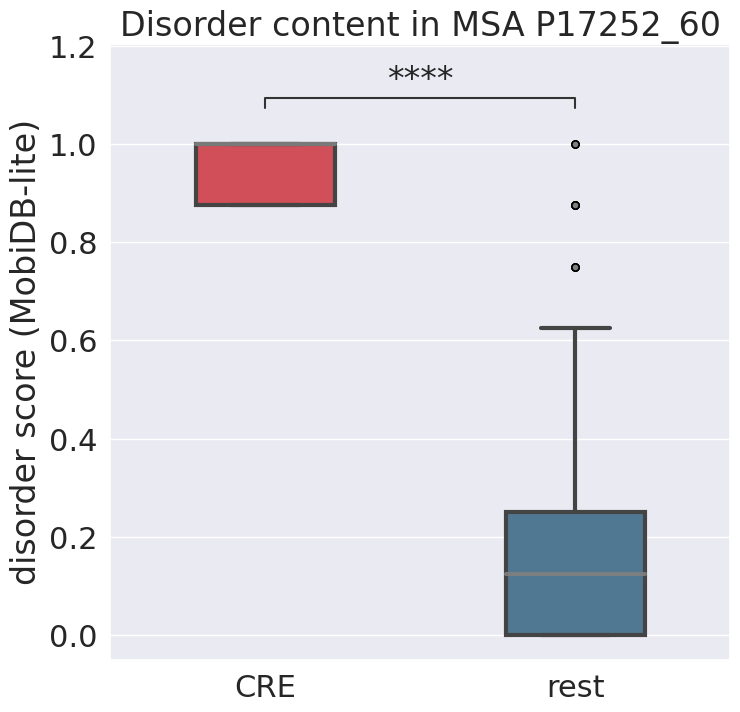

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.556e-16 U_stat=2.618e+08


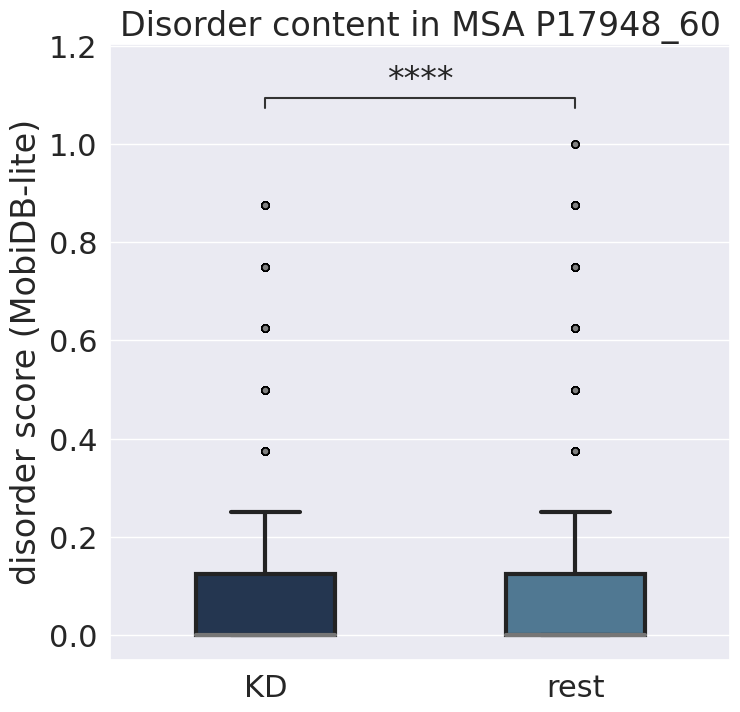

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:5.800e-129 U_stat=5.089e+05
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:7.789e-38 U_stat=1.204e+07
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:6.508e-99 U_stat=3.314e+06


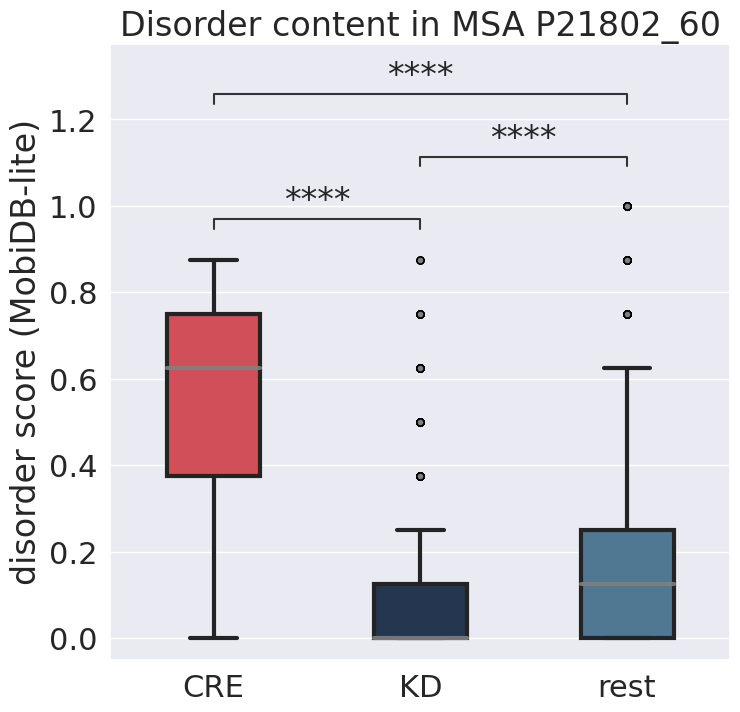

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:2.396e-88 U_stat=8.238e+04
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:5.667e-02 U_stat=1.638e+06
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.913e-213 U_stat=3.482e+06


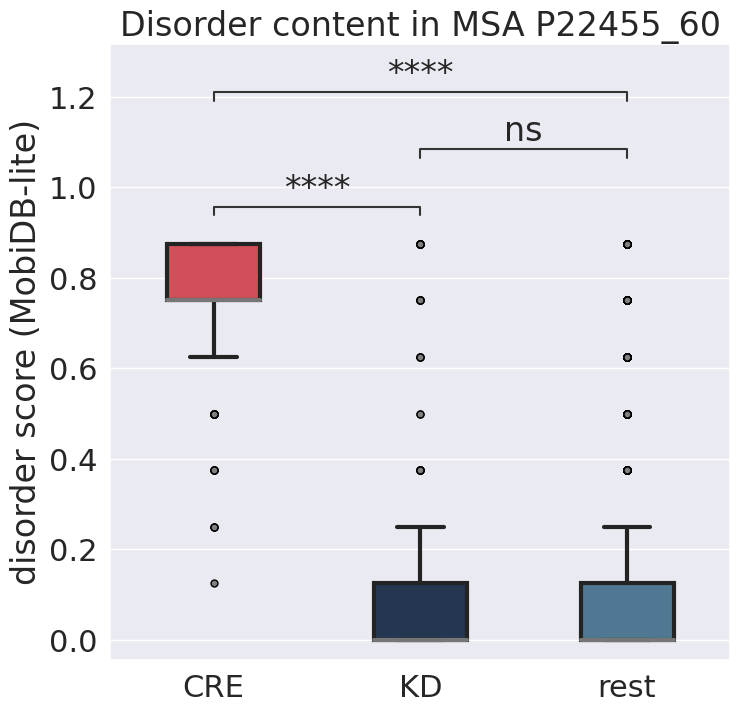

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:4.063e-23 U_stat=3.842e+04
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:9.723e-09 U_stat=1.330e+06
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=1.083e+07


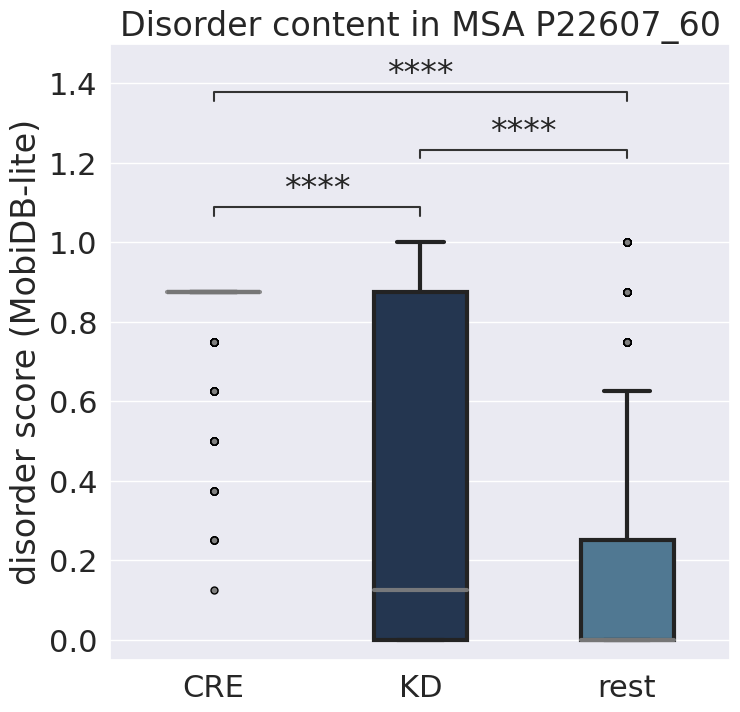

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:3.030e-179 U_stat=3.879e+06


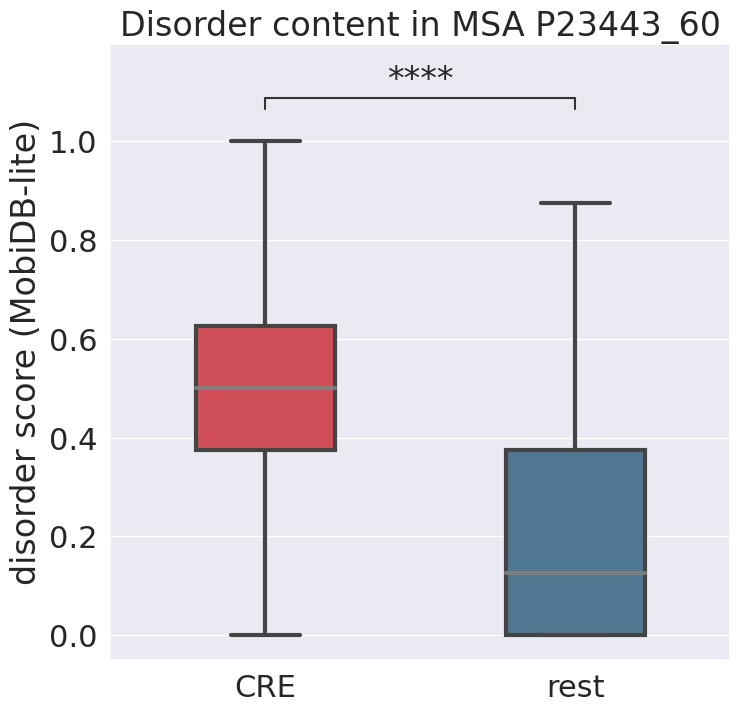

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:2.112e-27 U_stat=2.352e+03


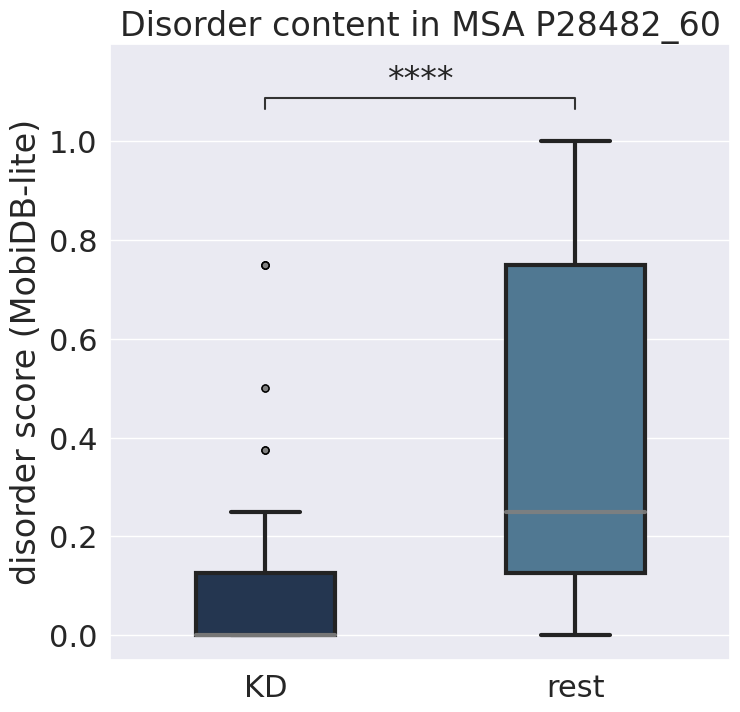

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:6.665e-179 U_stat=1.358e+07


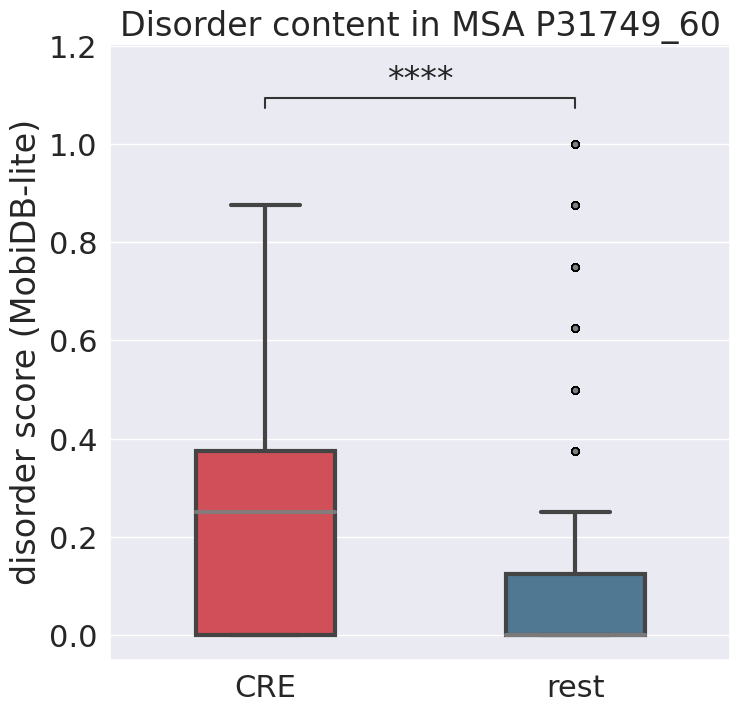

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:1.129e-17 U_stat=1.409e+05
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:6.319e-01 U_stat=2.956e+05
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.540e-45 U_stat=1.244e+06


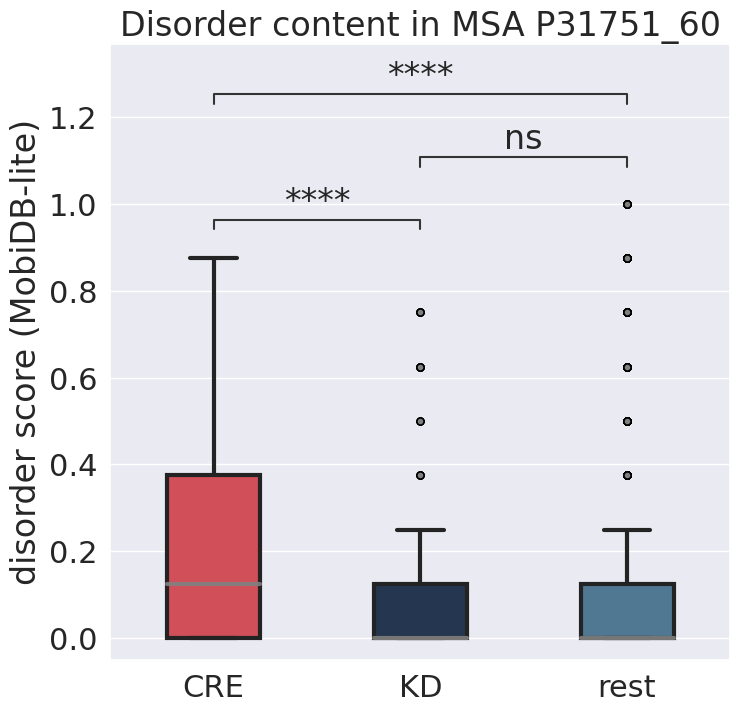

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:7.829e-131 U_stat=6.868e+08


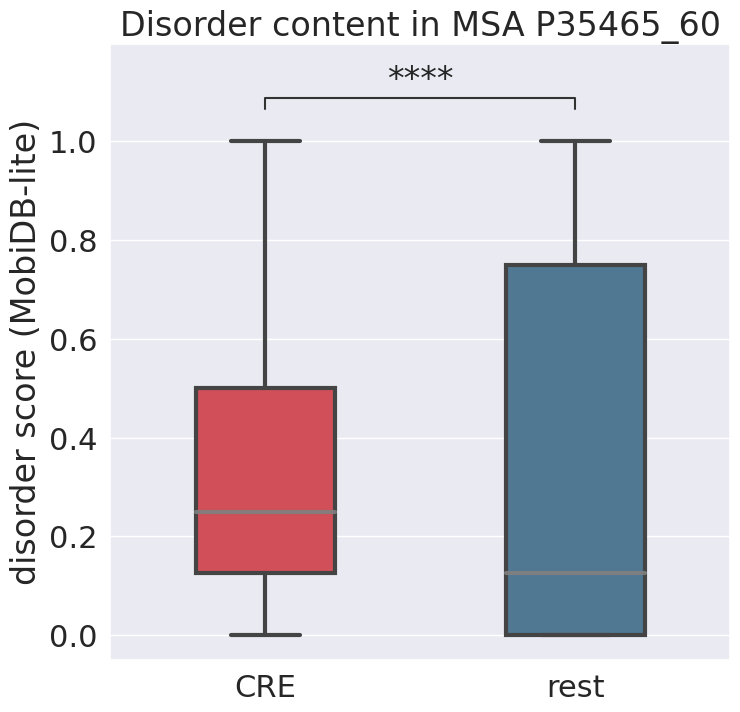

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=6.869e+08


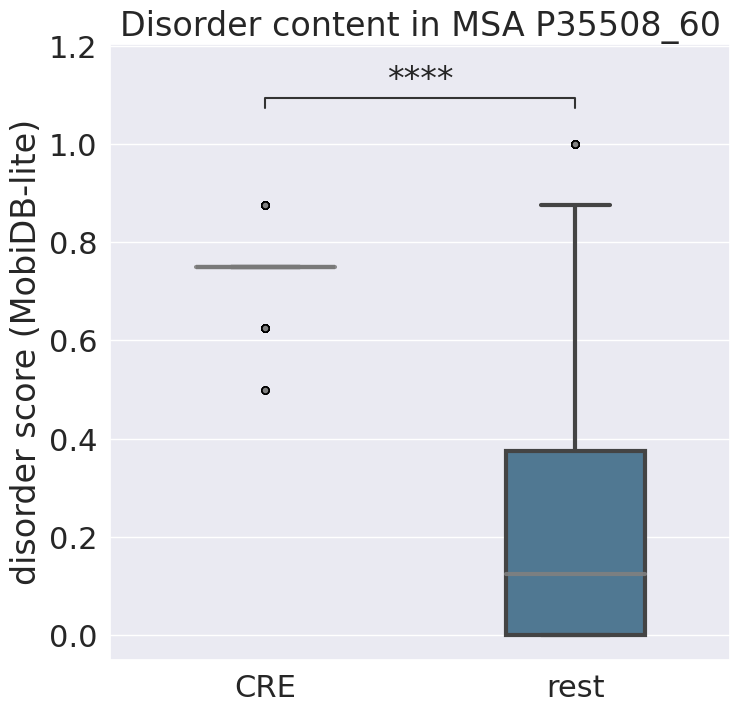

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=7.734e+07


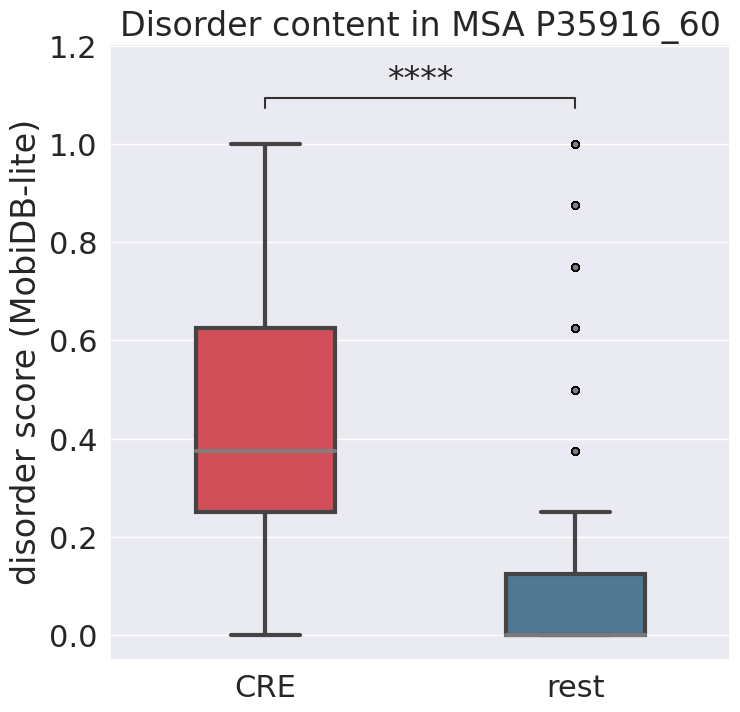

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=1.962e+07
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:6.549e-18 U_stat=9.174e+07
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=4.945e+08


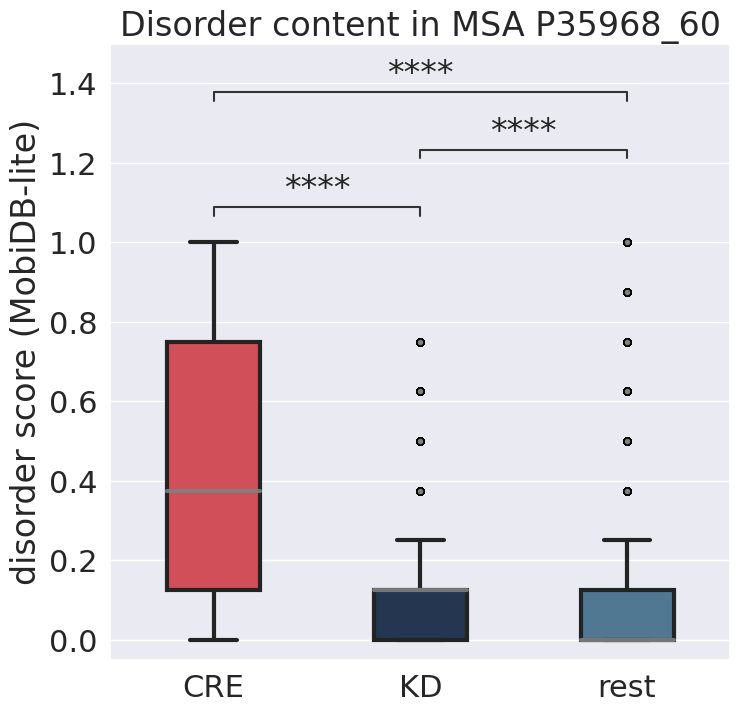

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=1.681e+07


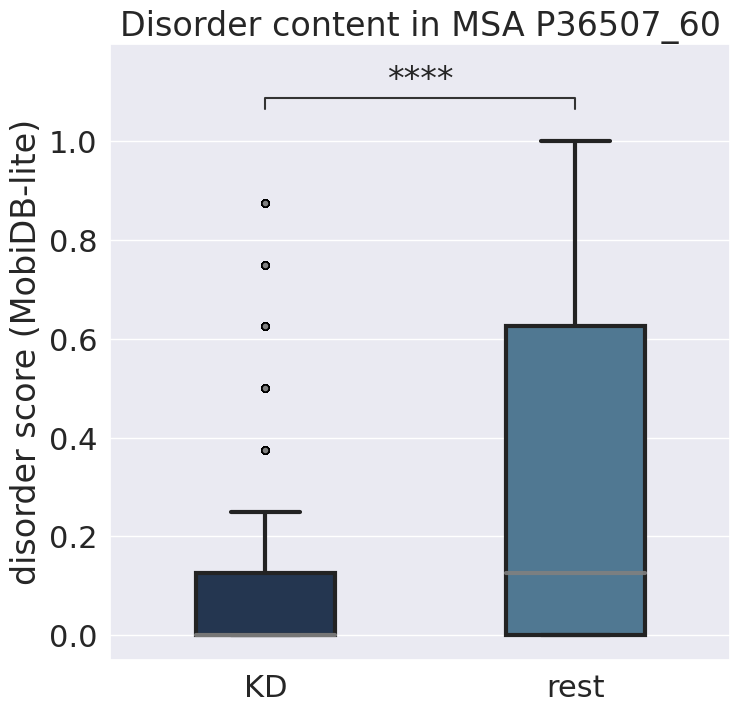

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:9.588e-18 U_stat=7.740e+04


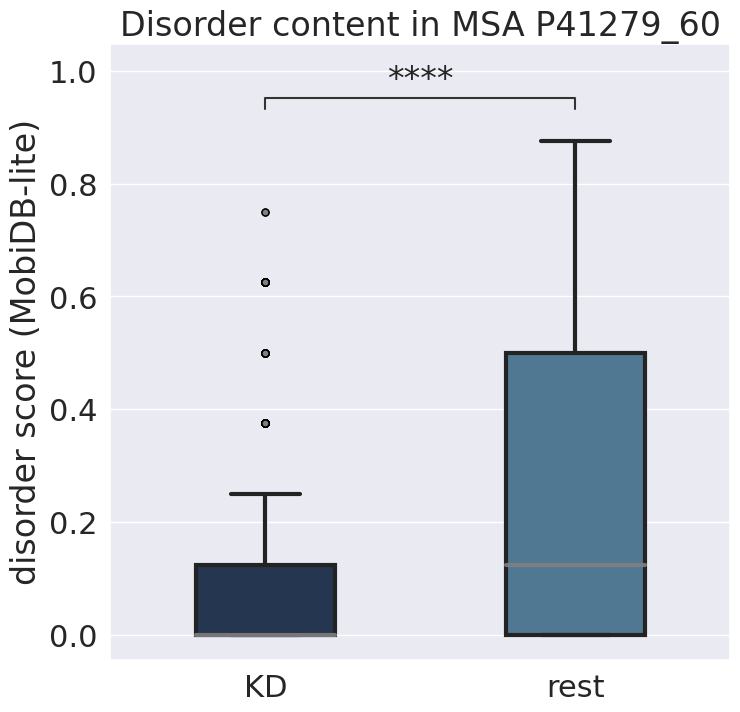

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.299e-71 U_stat=6.208e+06


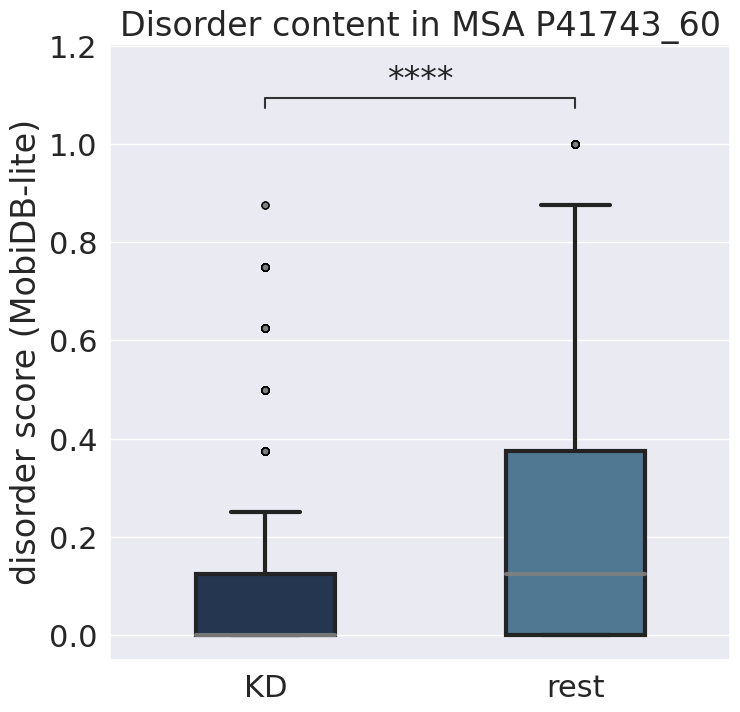

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:3.578e-83 U_stat=4.521e+05
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:5.786e-03 U_stat=2.053e+06
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=2.485e+07


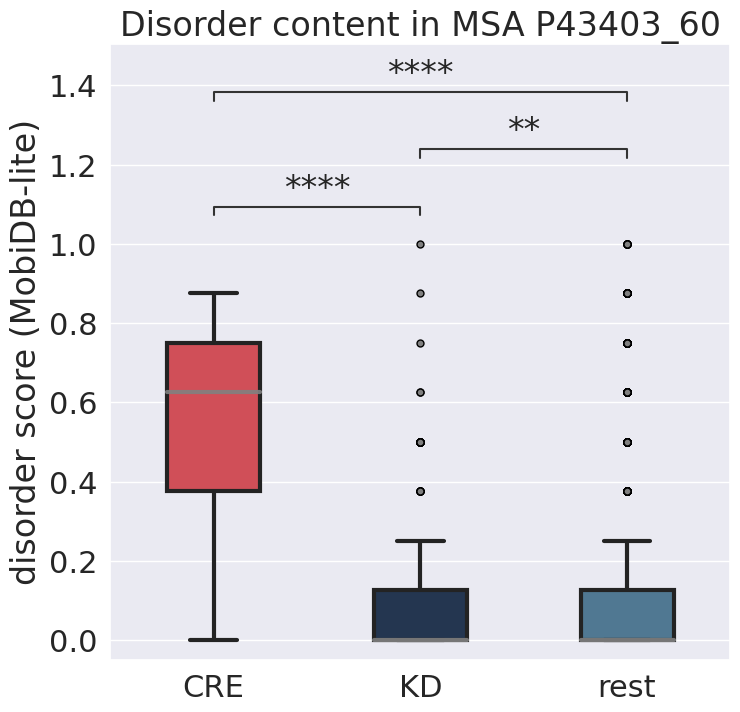

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:3.142e-15 U_stat=6.942e+03
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.376e-05 U_stat=7.744e+04
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:3.499e-12 U_stat=1.738e+04


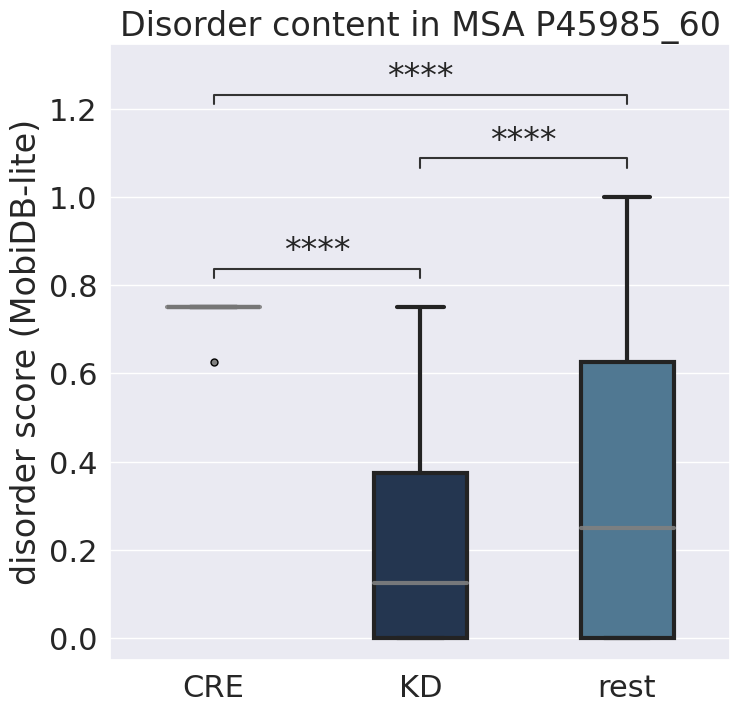

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=8.851e+08


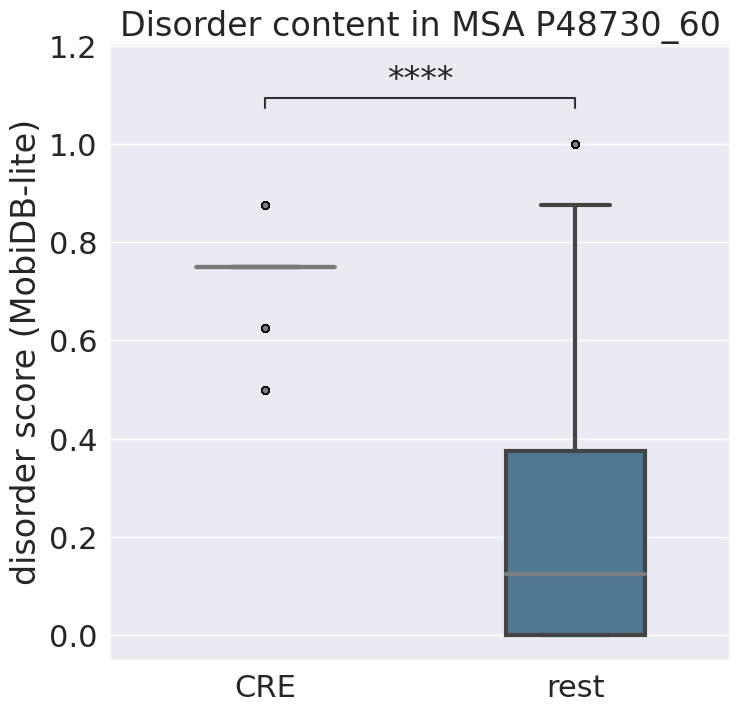

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.048e-64 U_stat=2.796e+04


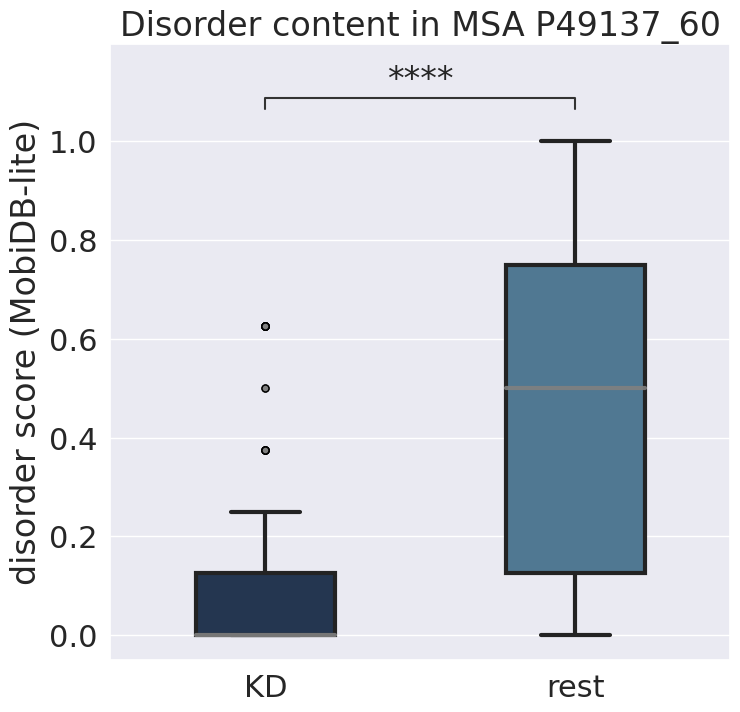

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.048e-64 U_stat=2.796e+04


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


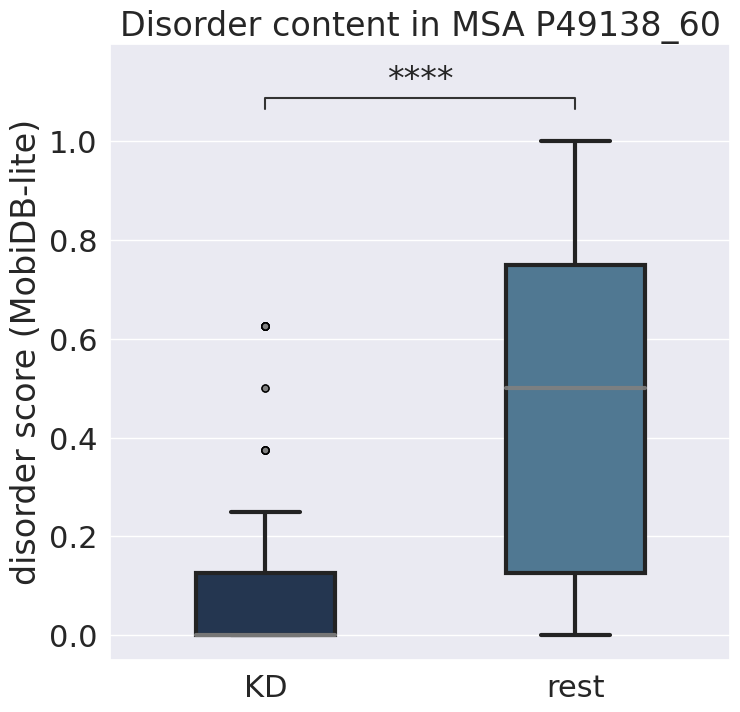

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=4.124e+06


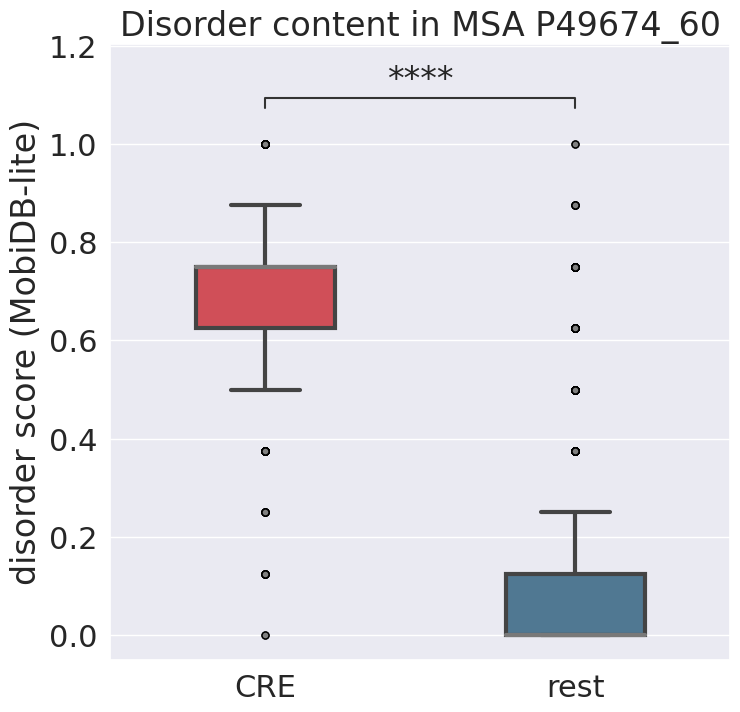

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:4.332e-11 U_stat=8.602e+05


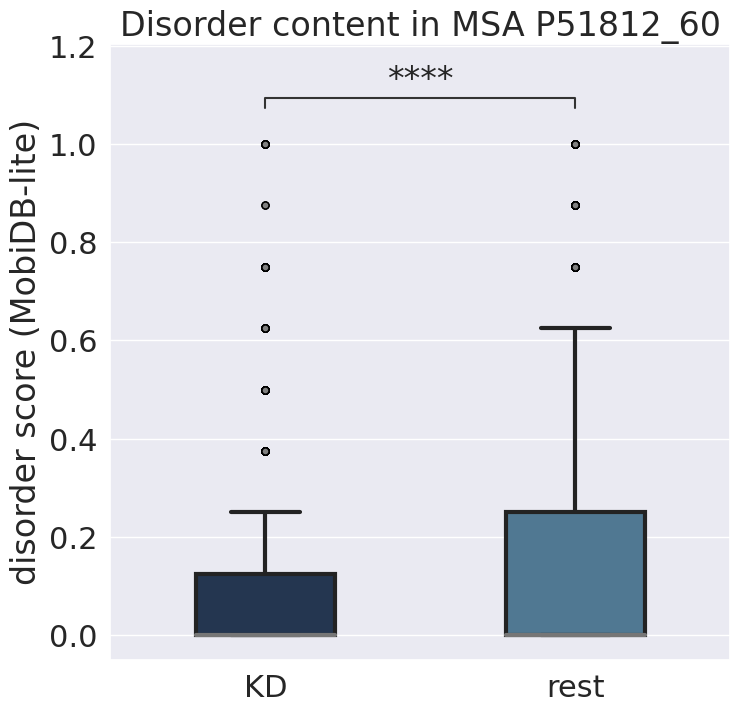

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:4.377e-224 U_stat=5.502e+06


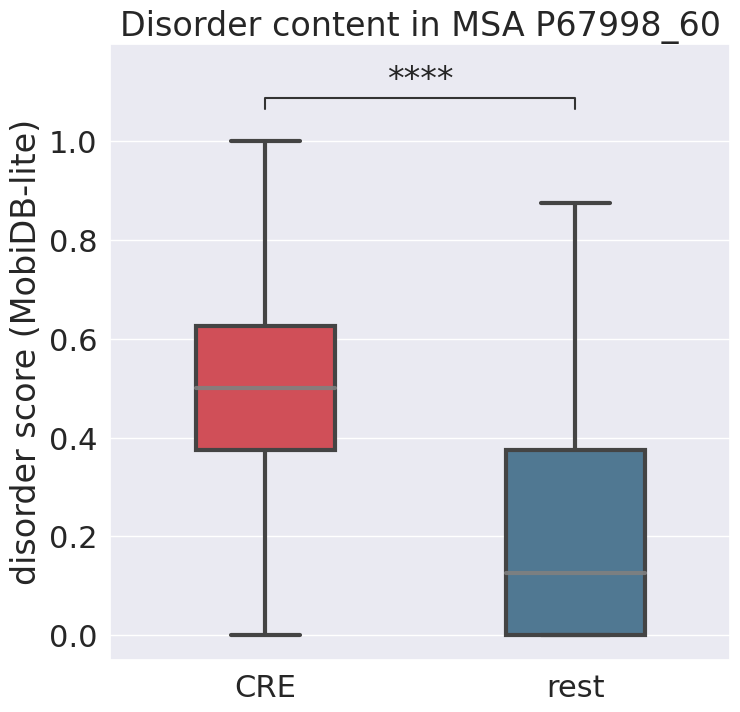

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:3.247e-275 U_stat=7.387e+06


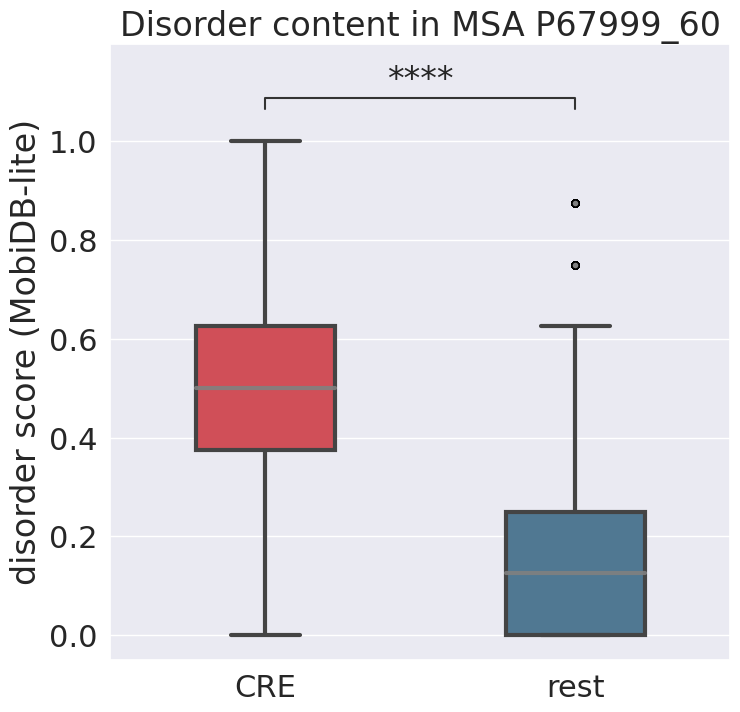

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:4.392e-28 U_stat=1.176e+09


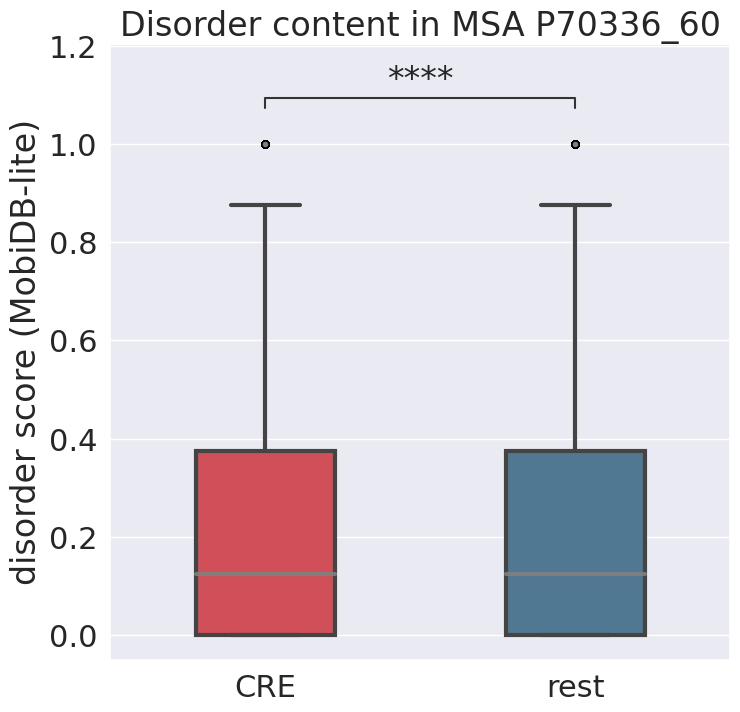

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.244e-13 U_stat=2.819e+06


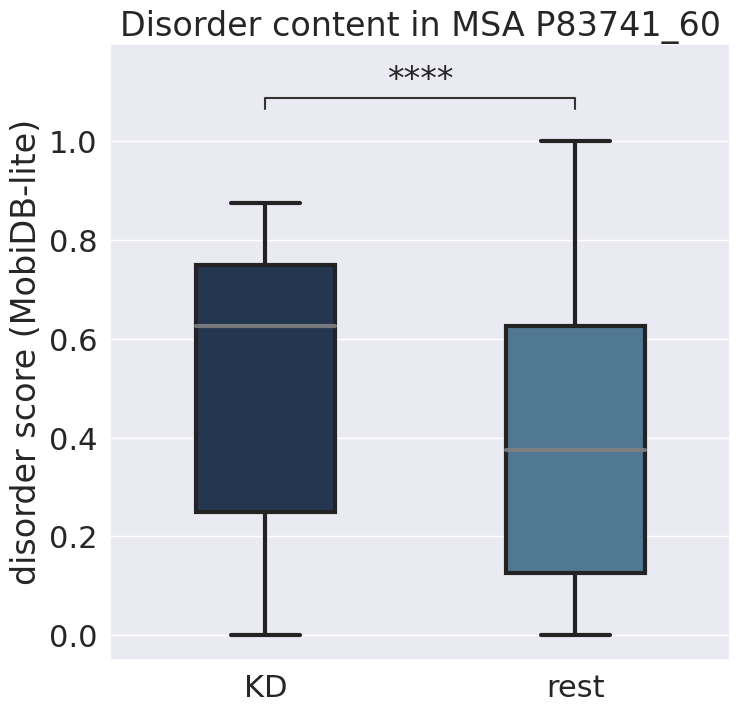

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:7.551e-86 U_stat=2.041e+04


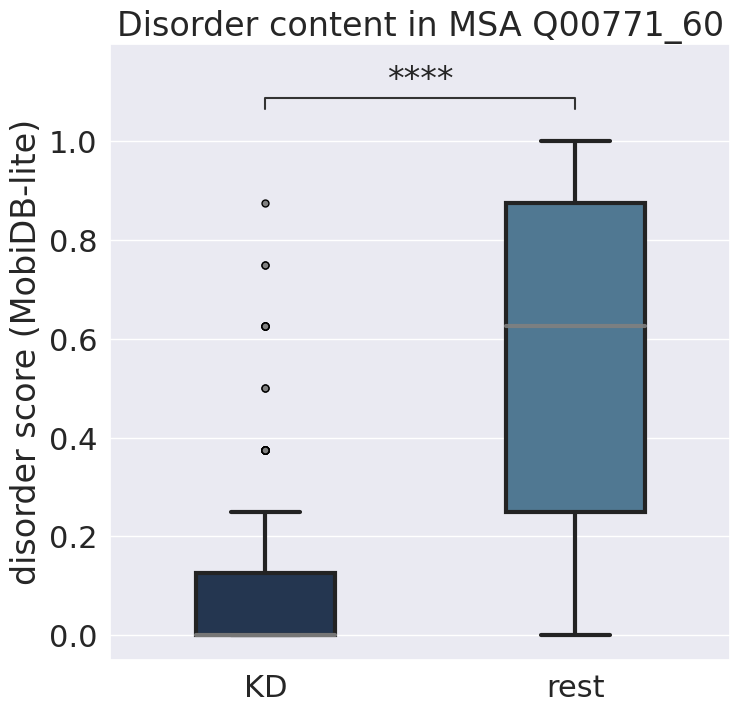

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:3.157e-02 U_stat=4.487e+05
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:2.004e-24 U_stat=1.112e+06
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:3.713e-30 U_stat=3.915e+06


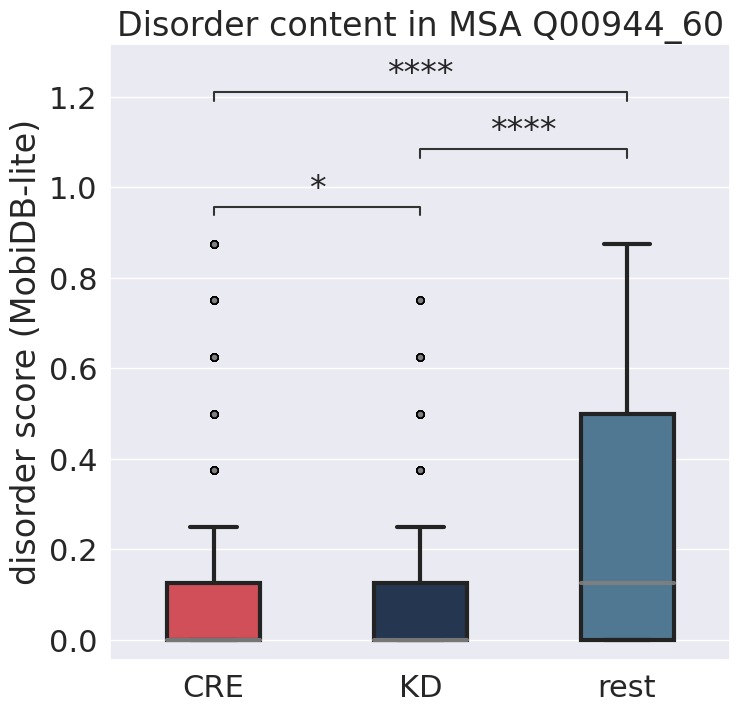

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:4.105e-18 U_stat=5.715e+04


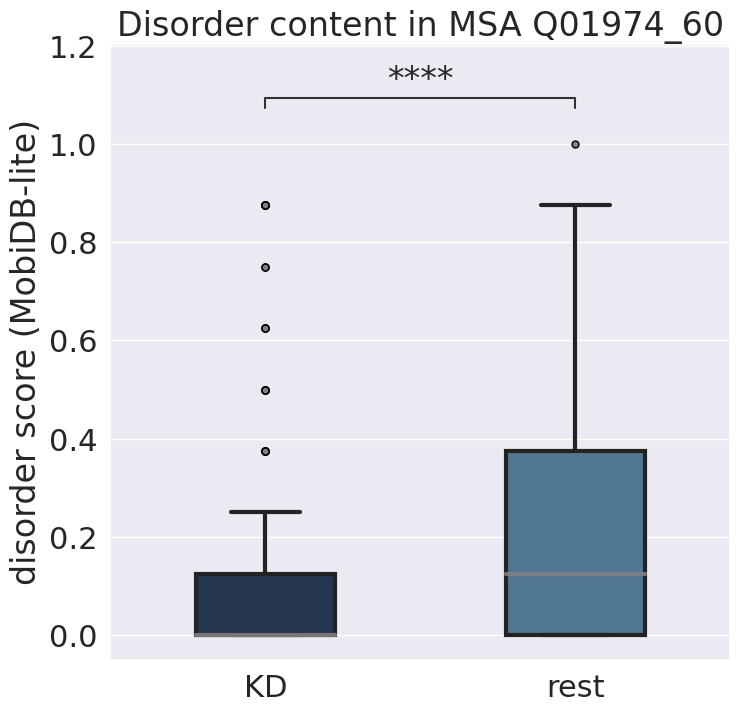

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:5.724e-09 U_stat=3.423e+05
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=2.899e+07
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:5.268e-01 U_stat=8.530e+04


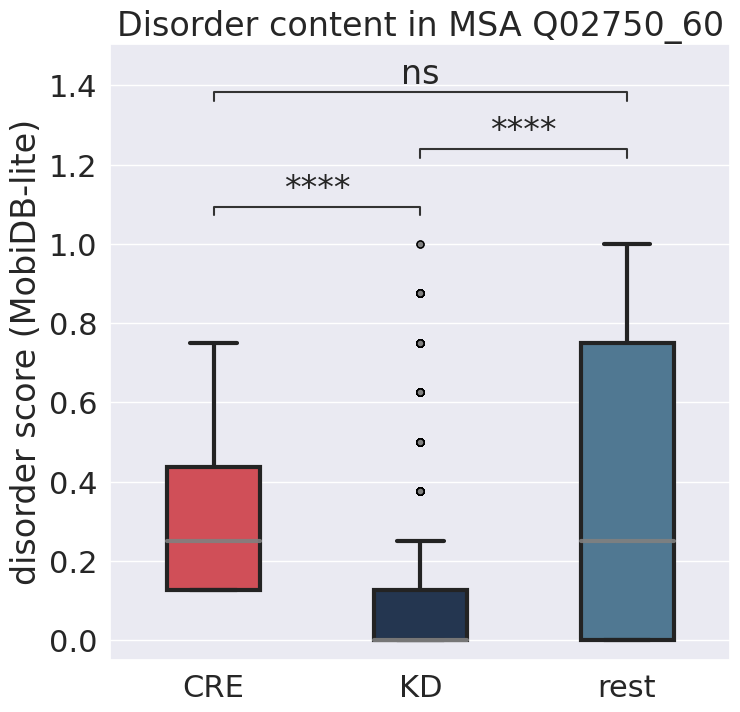

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:4.999e-160 U_stat=2.434e+06
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:4.209e-03 U_stat=1.791e+07
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=1.238e+09


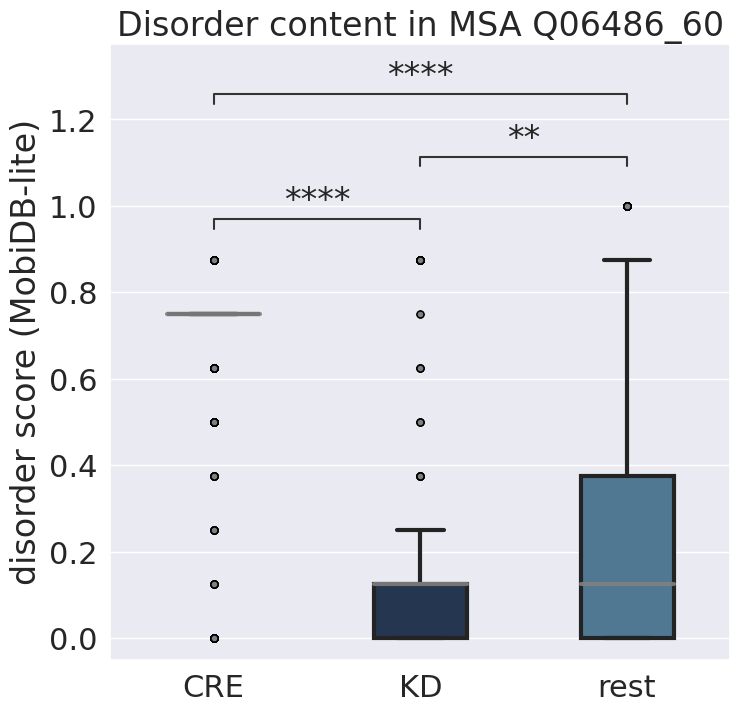

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=6.653e+07
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=4.274e+08
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=5.909e+08


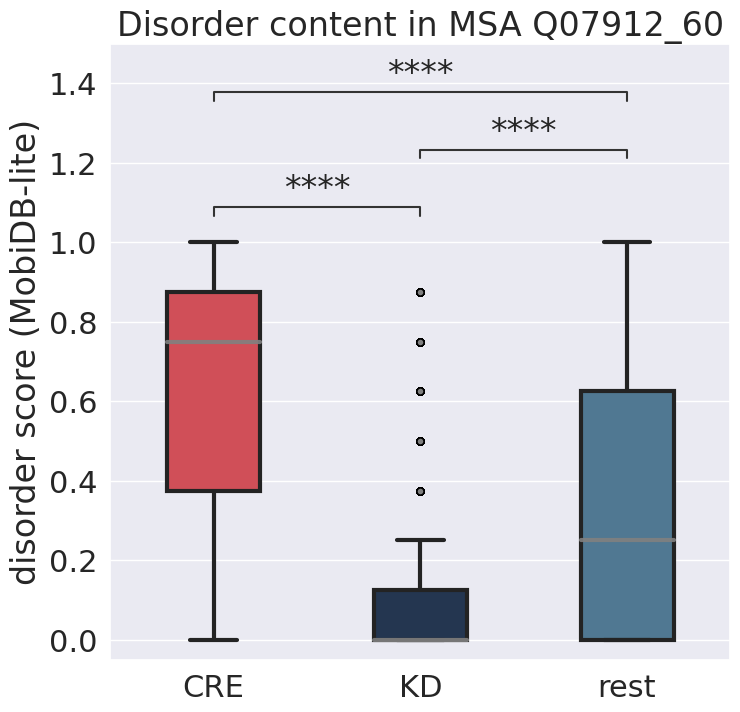

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:9.079e-64 U_stat=3.417e+06
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:8.973e-18 U_stat=1.002e+07
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.276e-157 U_stat=1.085e+09


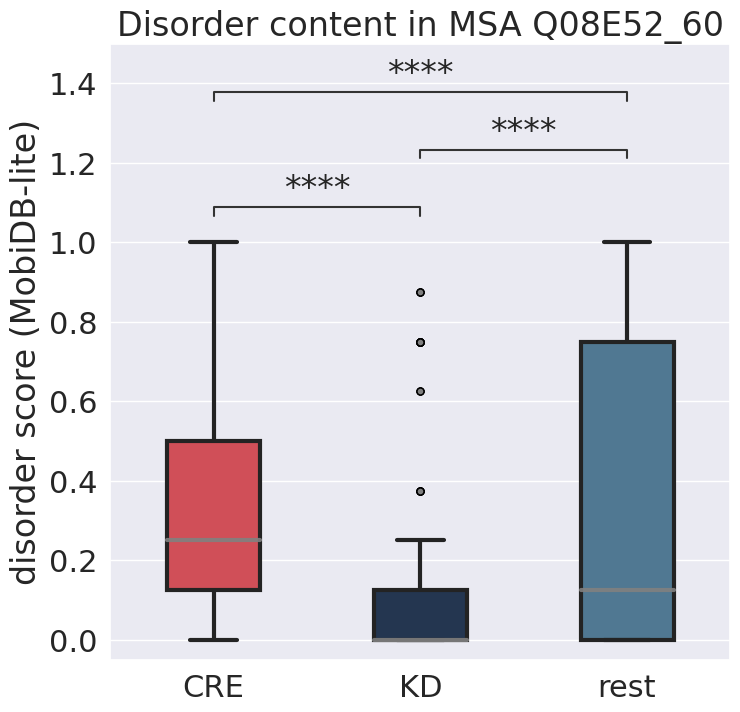

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:4.387e-02 U_stat=3.712e+06


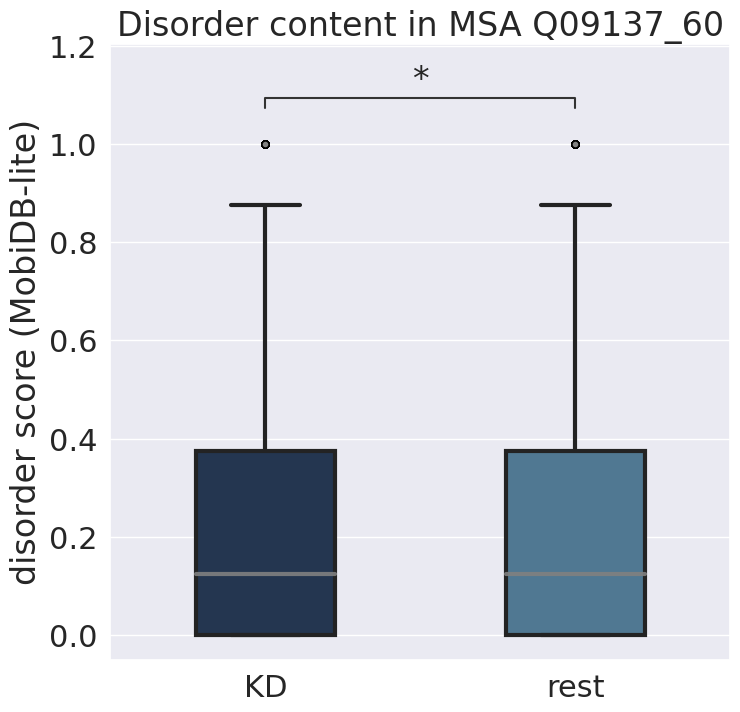

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:6.619e-05 U_stat=4.725e+04


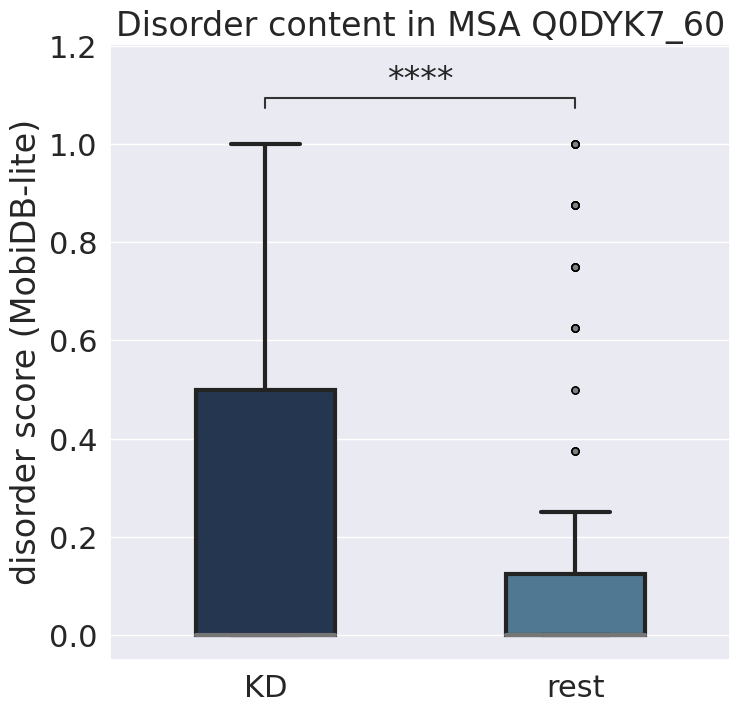

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.104e-23 U_stat=4.920e+05


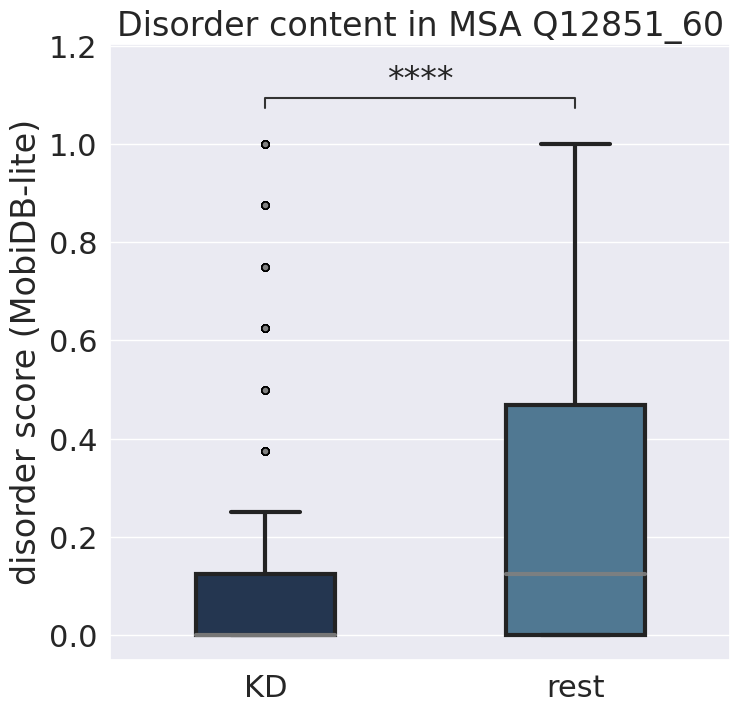

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:1.711e-185 U_stat=6.830e+06
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:2.816e-07 U_stat=7.514e+06
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=5.261e+08


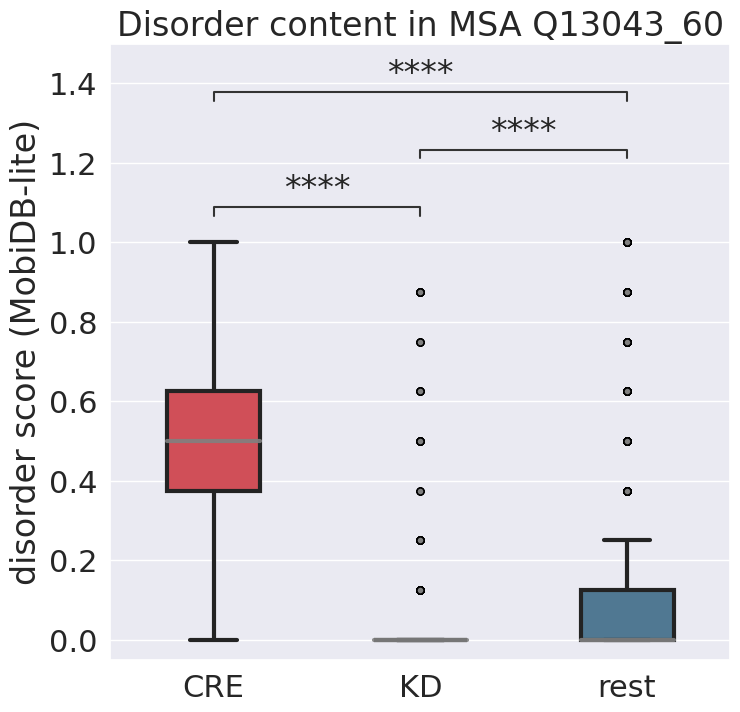

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:3.091e-04 U_stat=1.431e+06


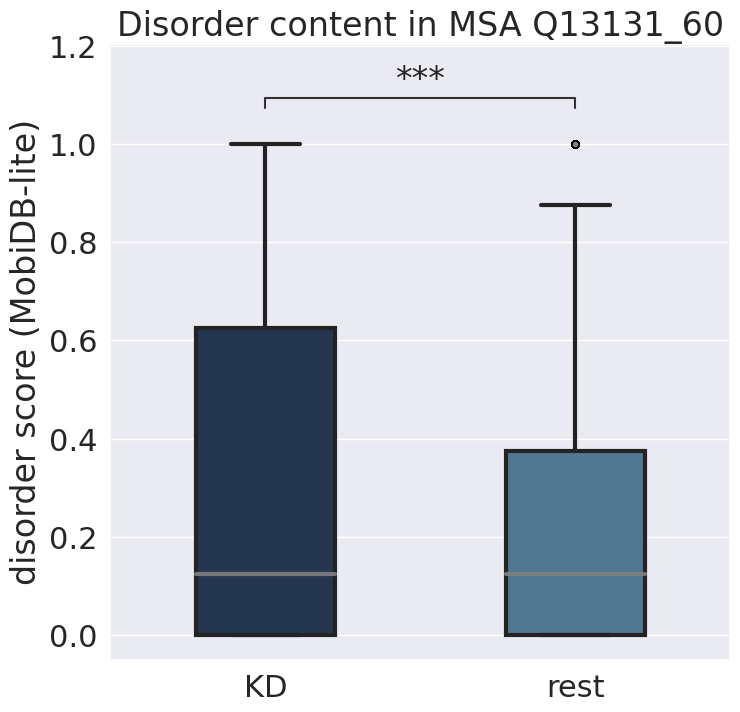

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:9.065e-65 U_stat=3.343e+06
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:6.663e-18 U_stat=9.756e+06
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.461e-159 U_stat=1.034e+09


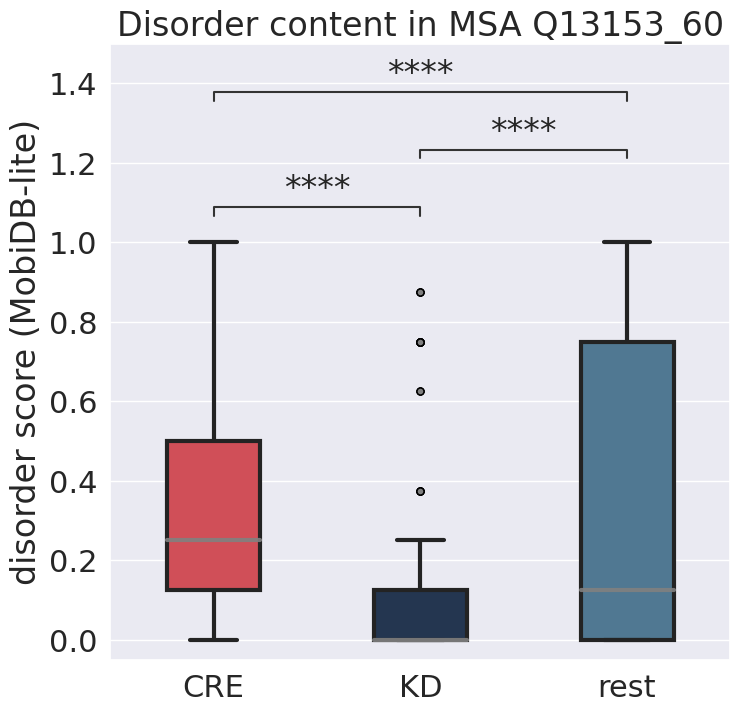

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:2.330e-134 U_stat=4.809e+06
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.384e-17 U_stat=9.010e+06
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=1.138e+09


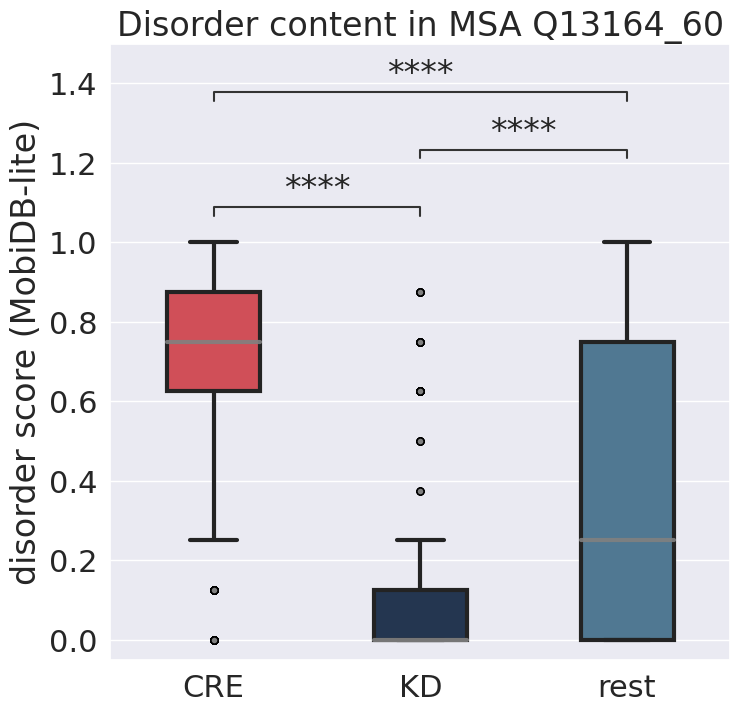

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:1.367e-213 U_stat=2.592e+07
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.685e-44 U_stat=1.097e+08
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=9.814e+08


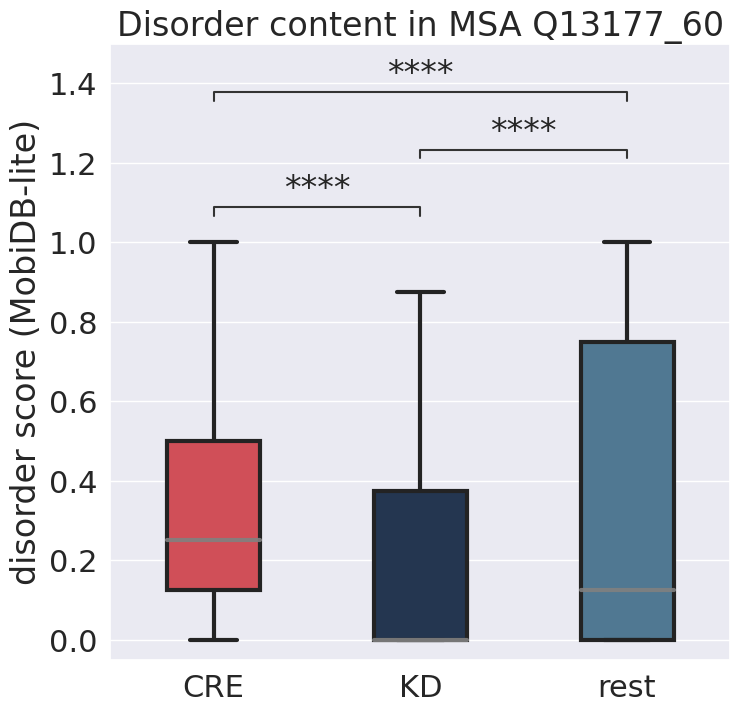

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:6.334e-265 U_stat=2.816e+07
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:7.071e-01 U_stat=3.640e+07
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=2.268e+09


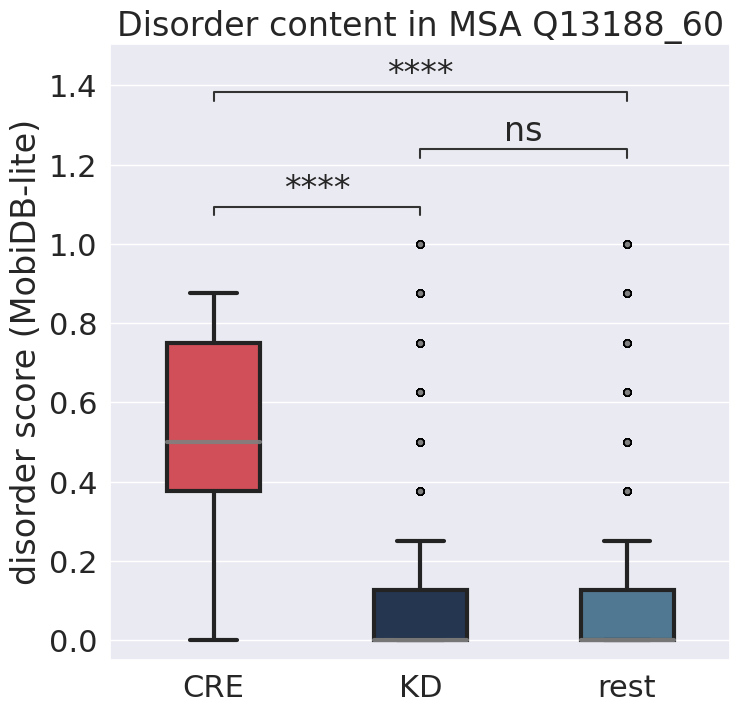

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:1.727e-92 U_stat=5.853e+06
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:9.930e-01 U_stat=1.143e+07
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=1.827e+09


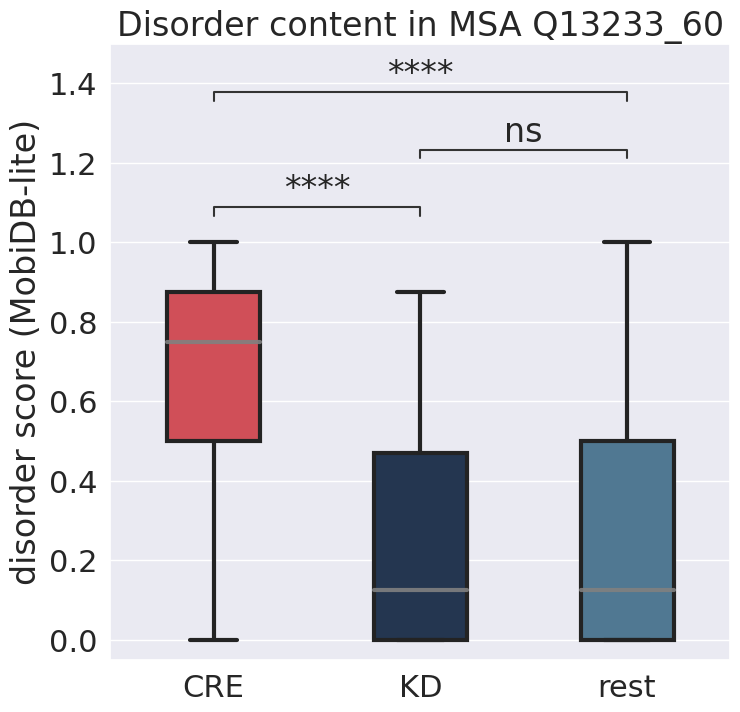

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:3.188e-192 U_stat=1.503e+09


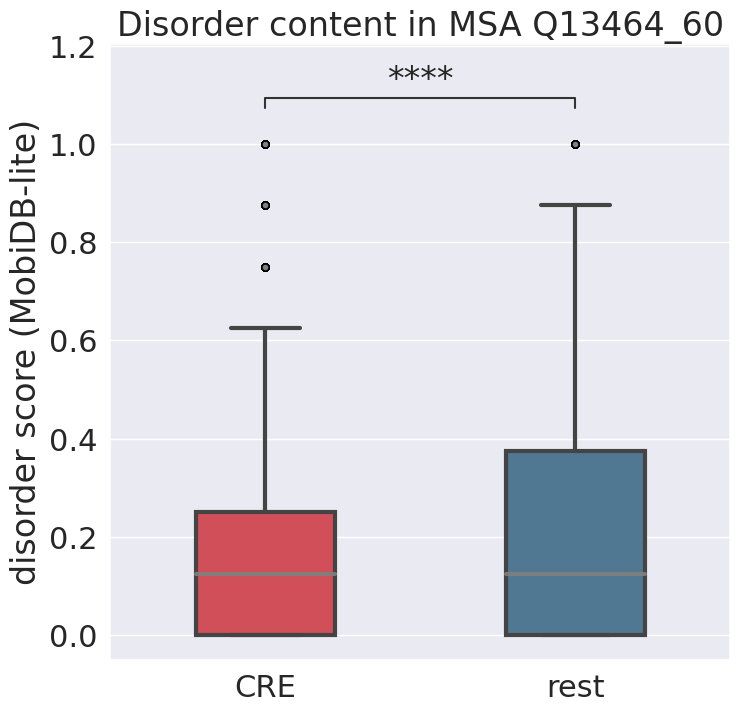

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:5.653e-09 U_stat=5.029e+05


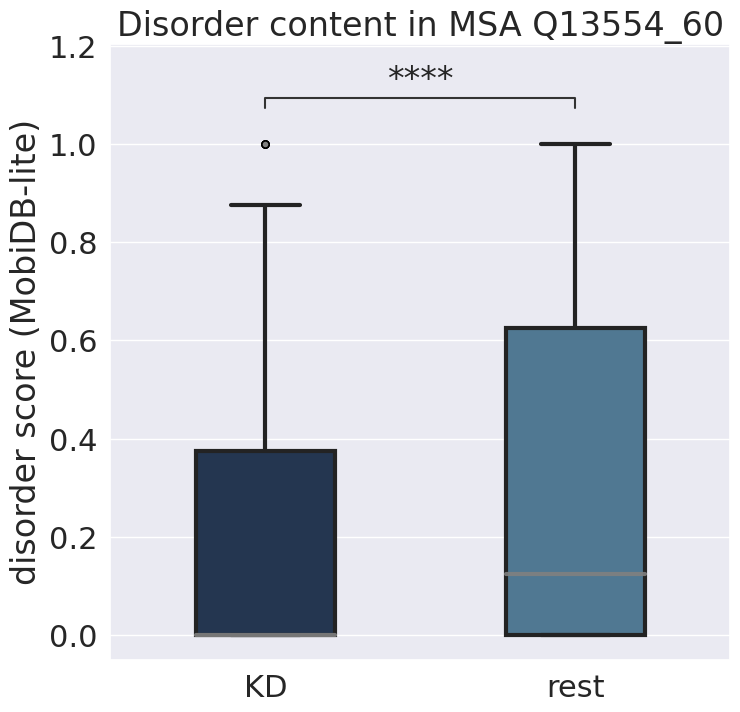

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:6.135e-03 U_stat=1.254e+06


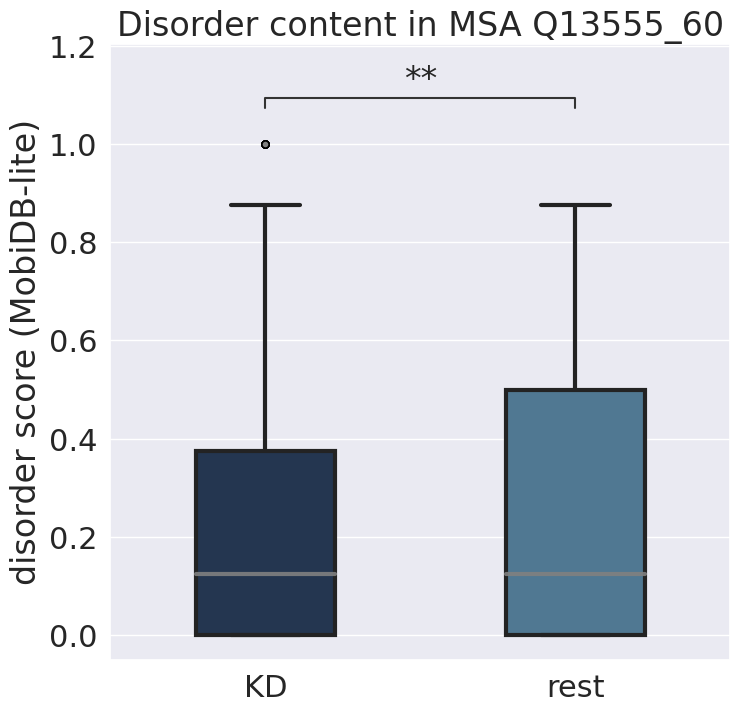

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:4.455e-10 U_stat=2.636e+04


/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


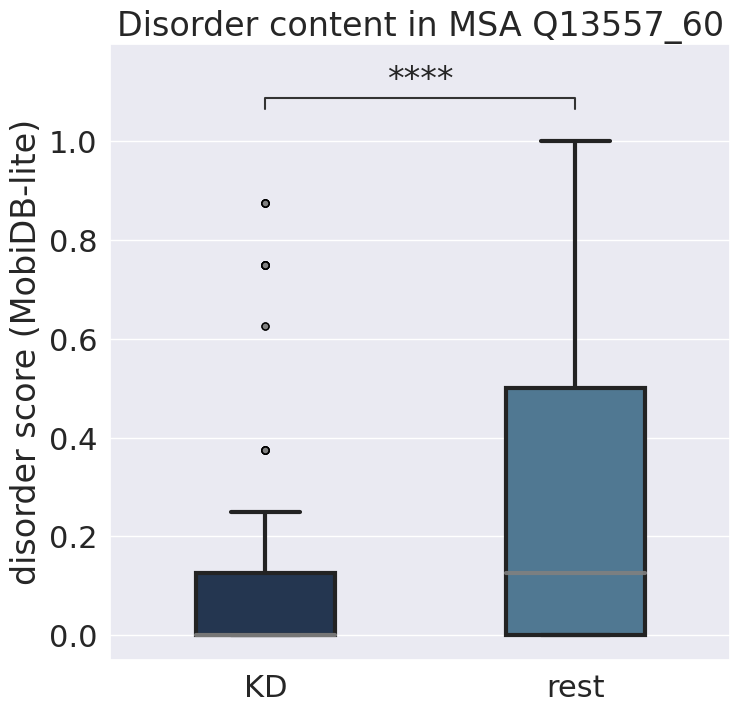

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.960e-87 U_stat=4.851e+05


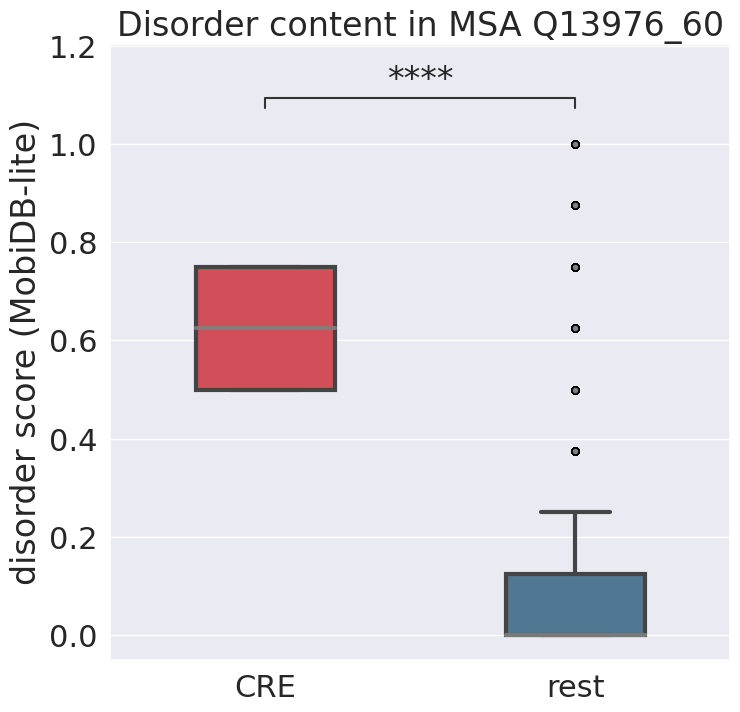

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:3.174e-36 U_stat=7.025e+04
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:9.346e-05 U_stat=4.664e+05
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.032e-27 U_stat=1.102e+05


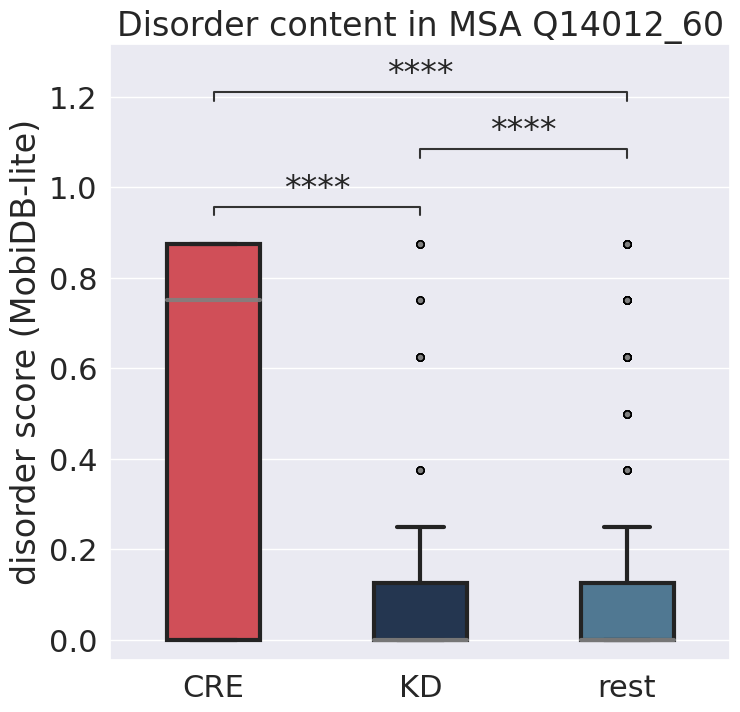

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:9.527e-129 U_stat=3.627e+05


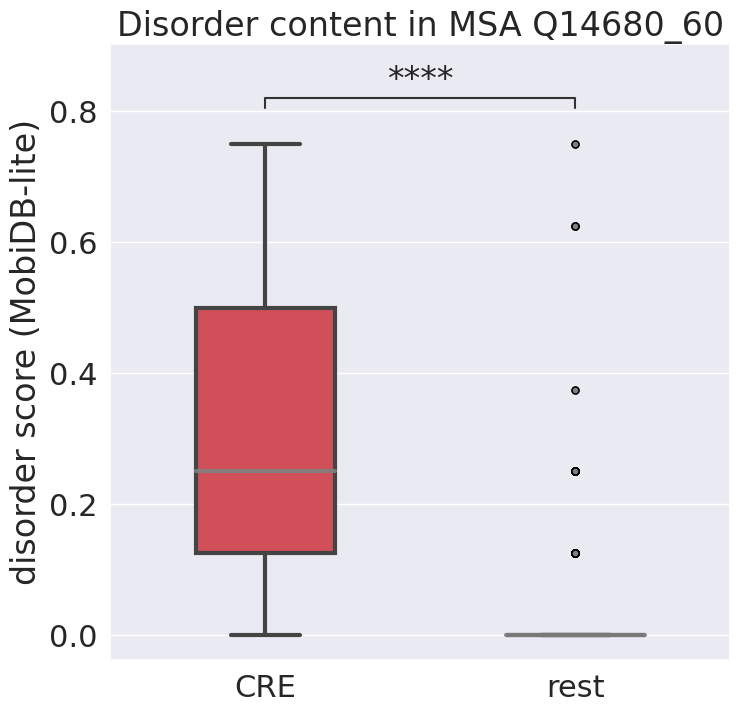

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.474e-10 U_stat=2.332e+05


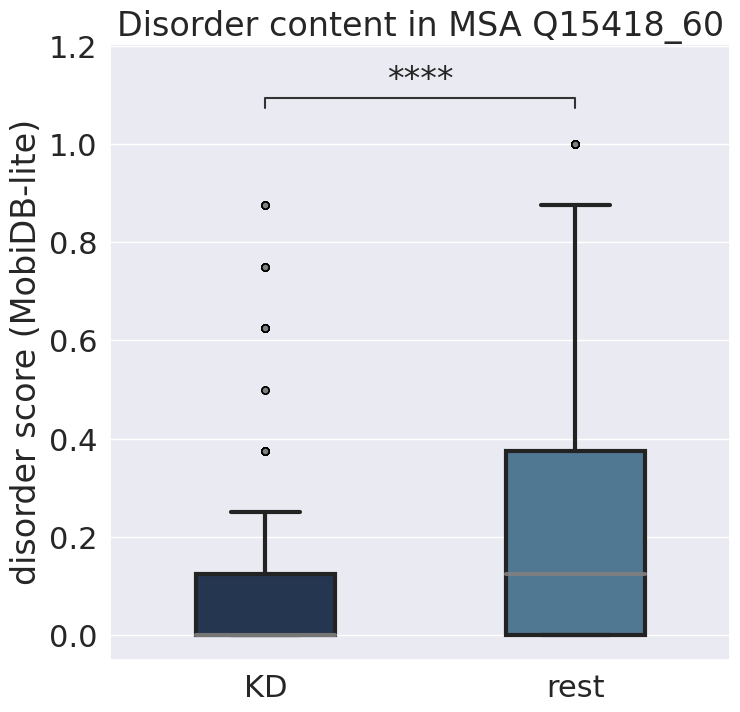

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:2.035e-13 U_stat=5.768e+04
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:6.498e-13 U_stat=8.887e+05
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.313e-01 U_stat=1.737e+06


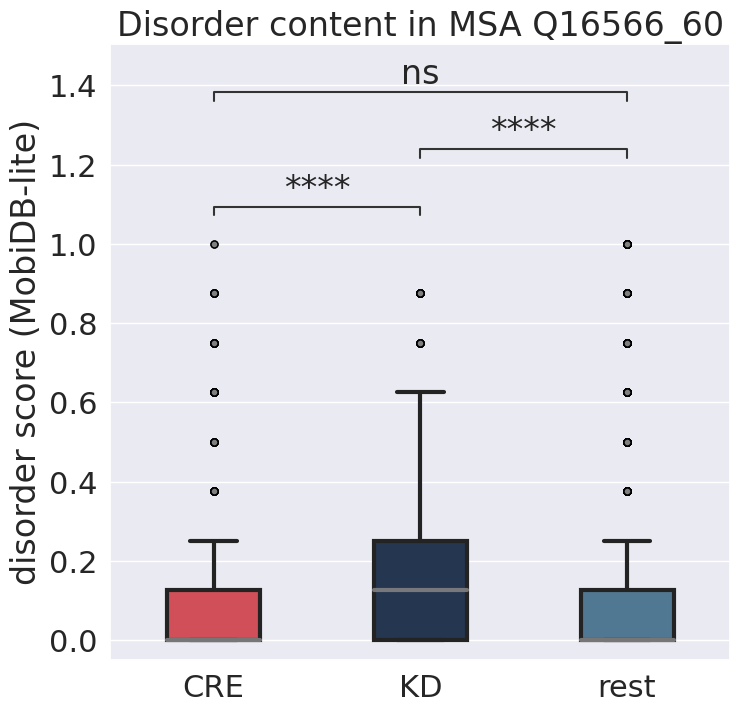

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.751e-12 U_stat=3.454e+04


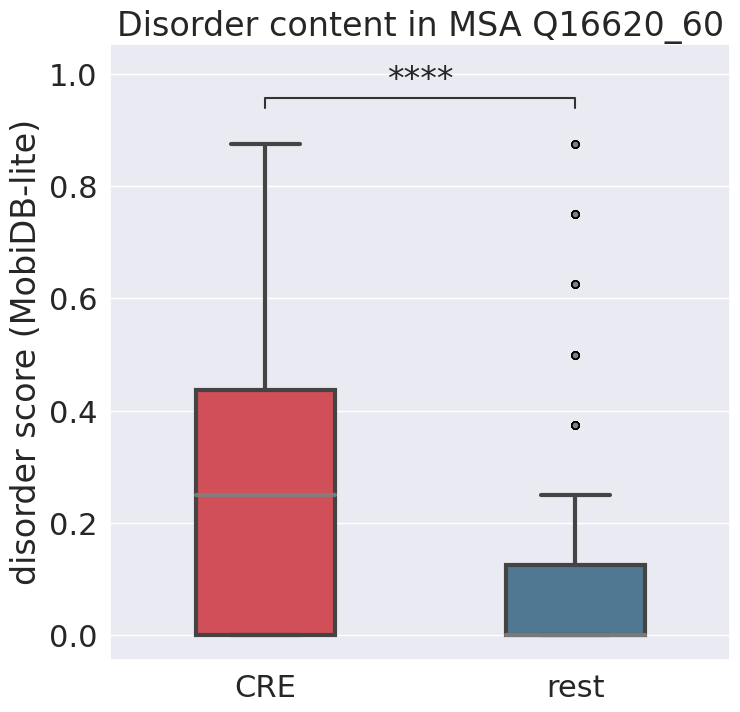

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=2.733e+06
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.637e-12 U_stat=1.159e+07
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=4.107e+07


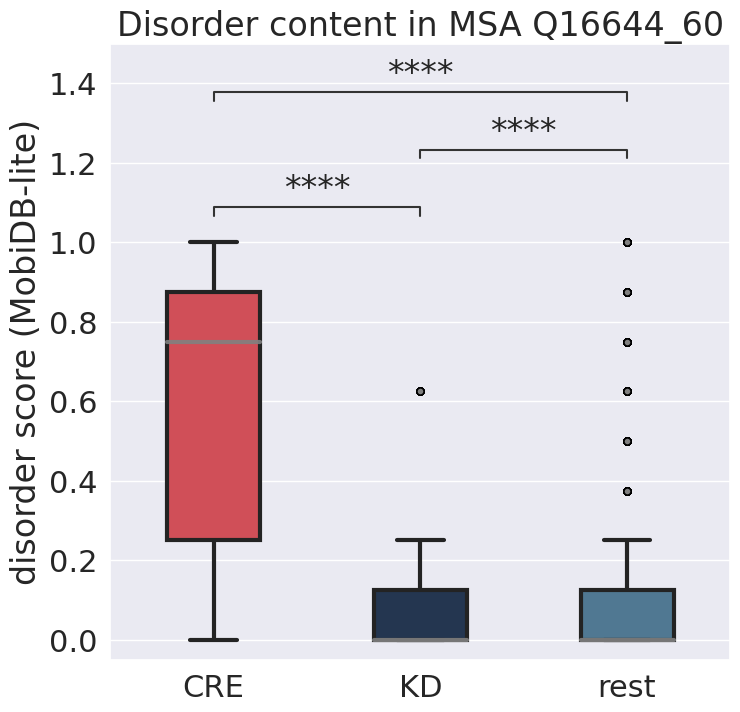

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:8.393e-42 U_stat=2.530e+05


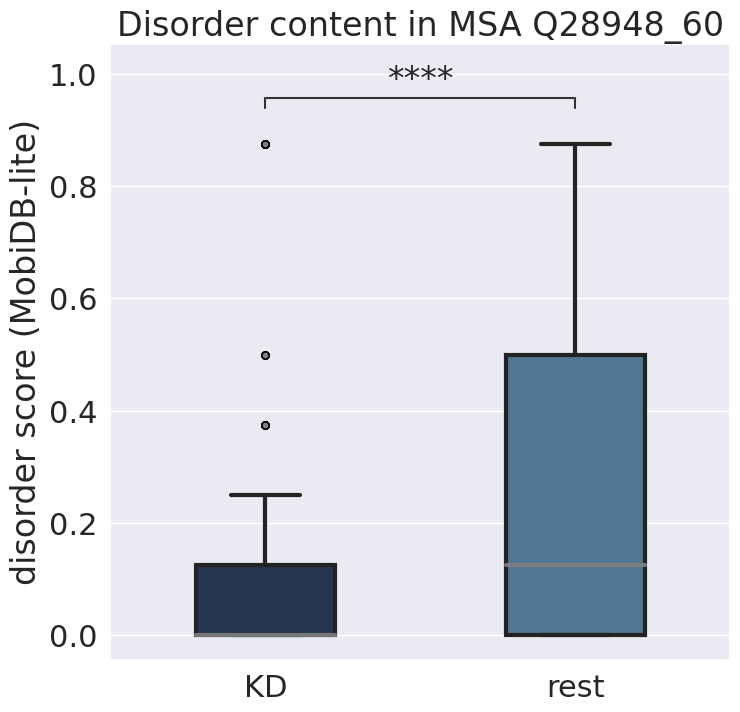

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.219e-193 U_stat=8.352e+05


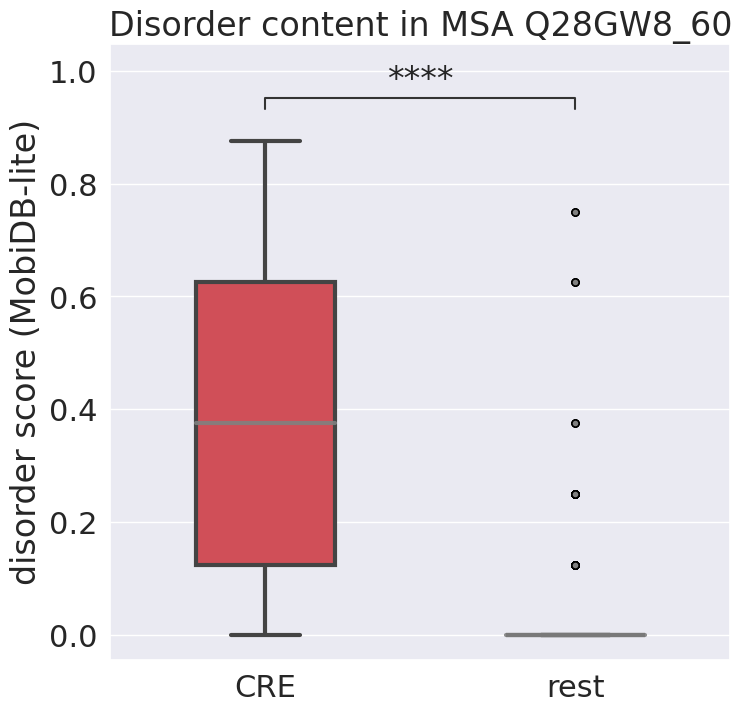

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:7.054e-199 U_stat=1.770e+07
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:3.349e-42 U_stat=7.181e+07
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=6.961e+08


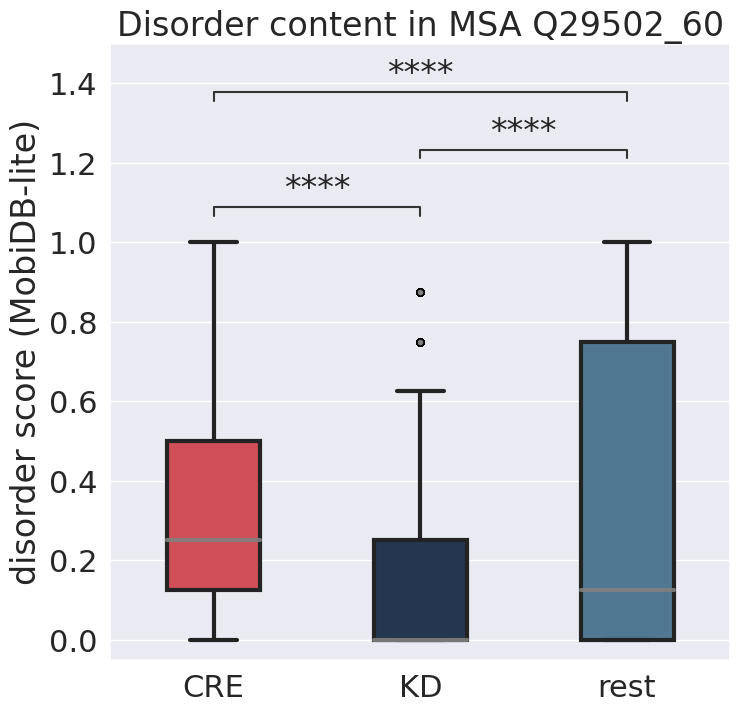

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=3.178e+06
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:9.988e-16 U_stat=1.354e+07
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=3.844e+07


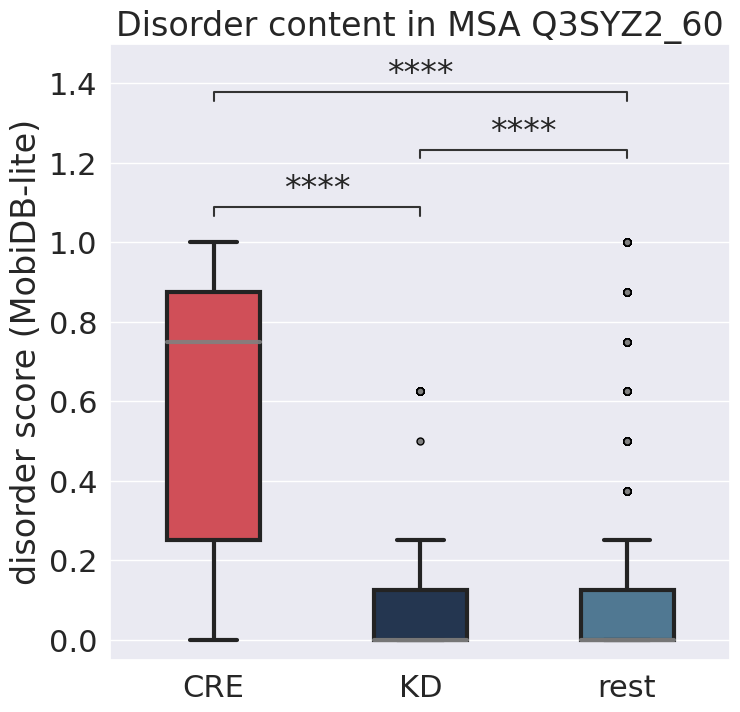

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=2.634e+06
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.942e-12 U_stat=1.120e+07
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=3.822e+07


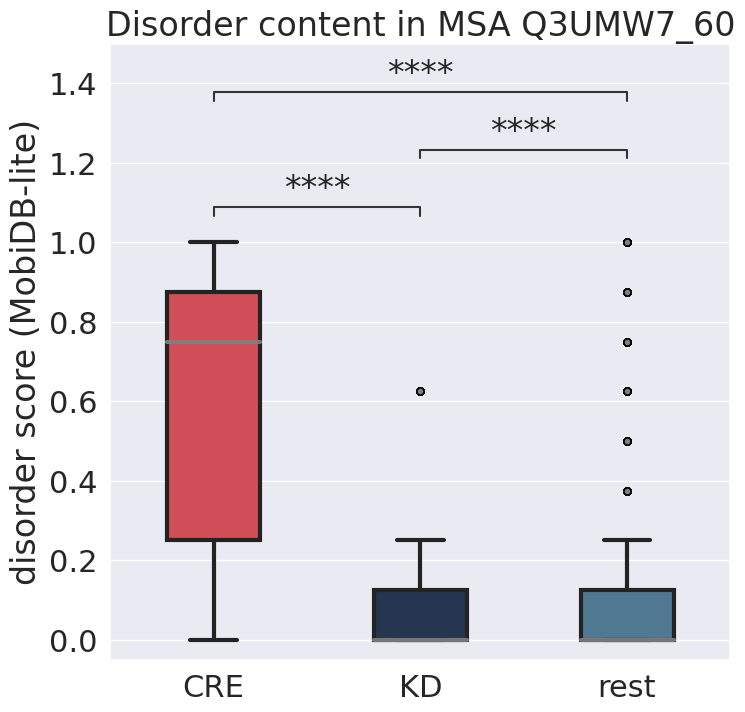

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:9.359e-01 U_stat=1.328e+05


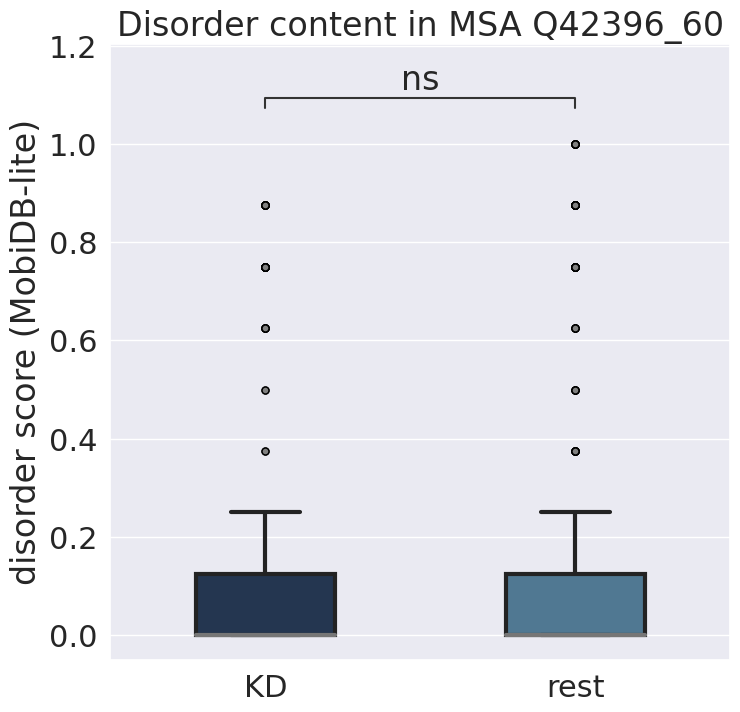

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:3.146e-02 U_stat=1.371e+05


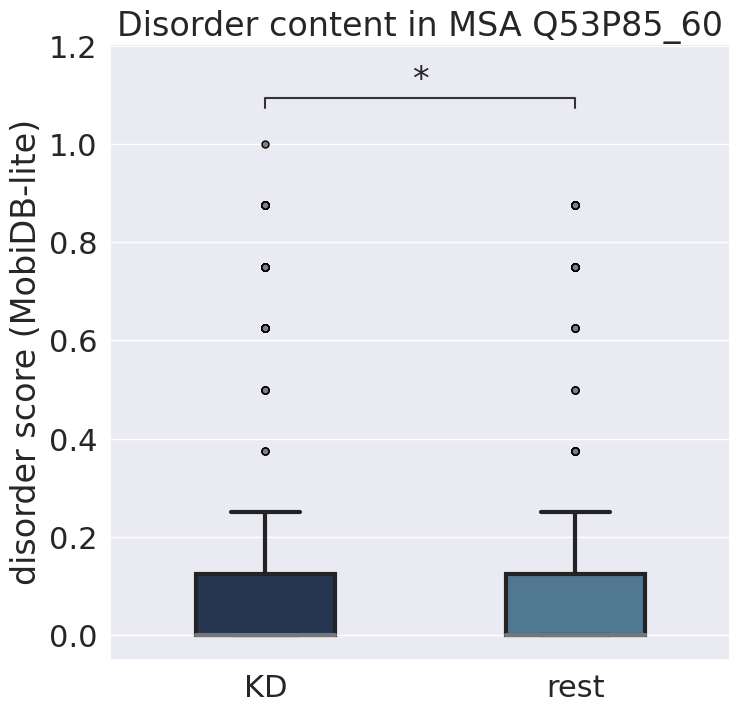

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=8.180e+08


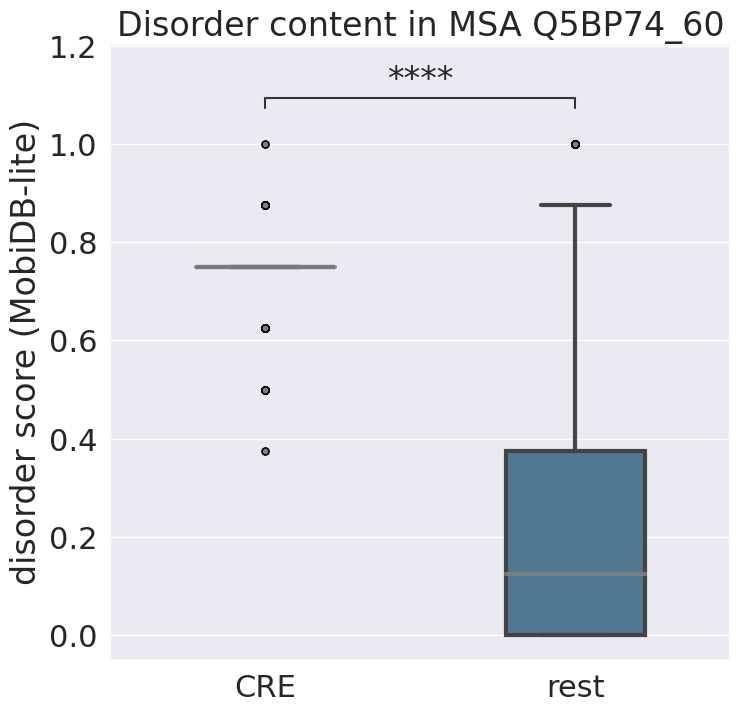

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=8.485e+08


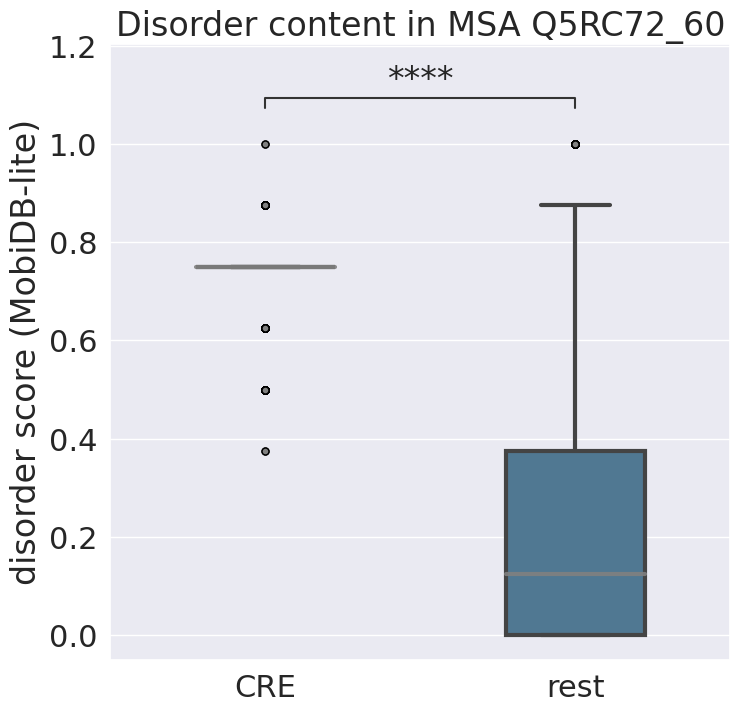

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.878e-21 U_stat=4.780e+05


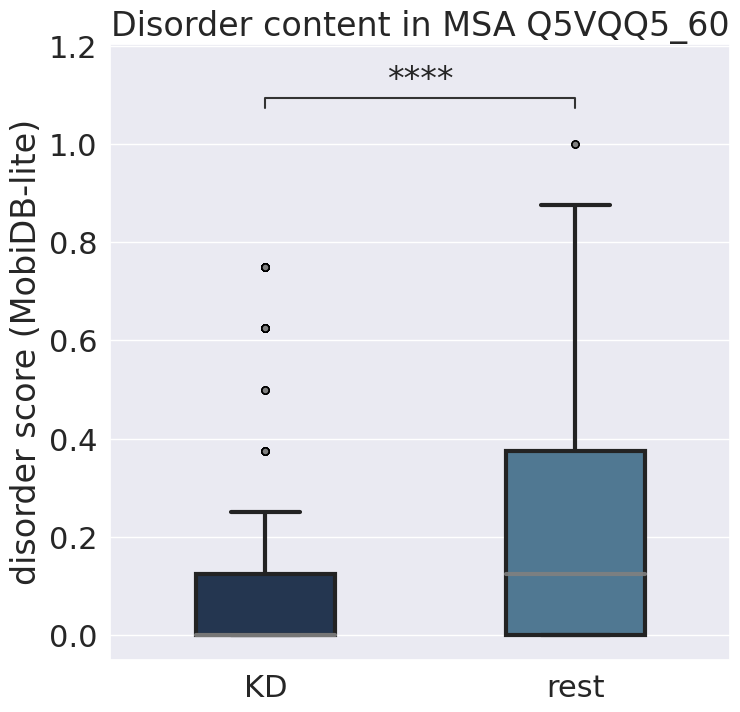

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:3.442e-05 U_stat=1.723e+07


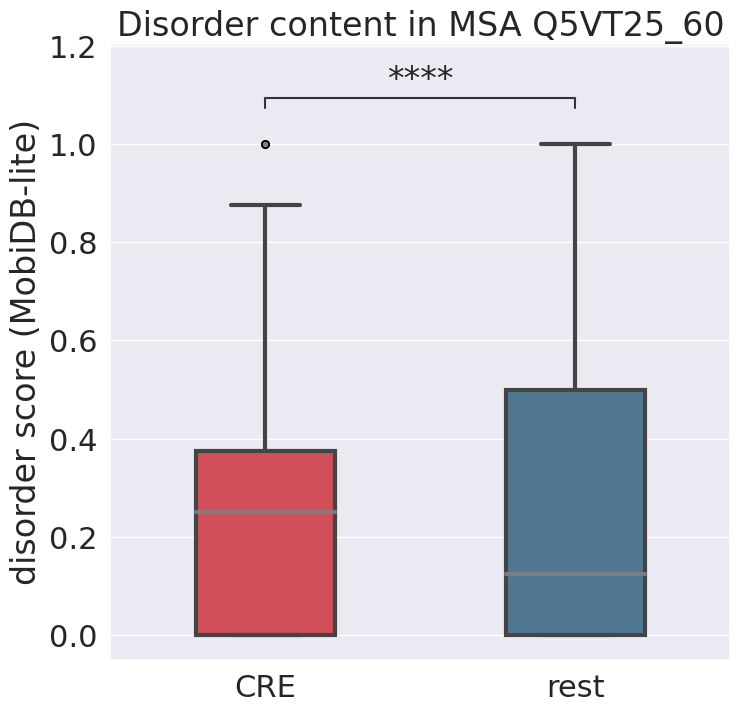

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=1.904e+07
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:2.379e-133 U_stat=4.370e+07
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:2.142e-146 U_stat=8.118e+08


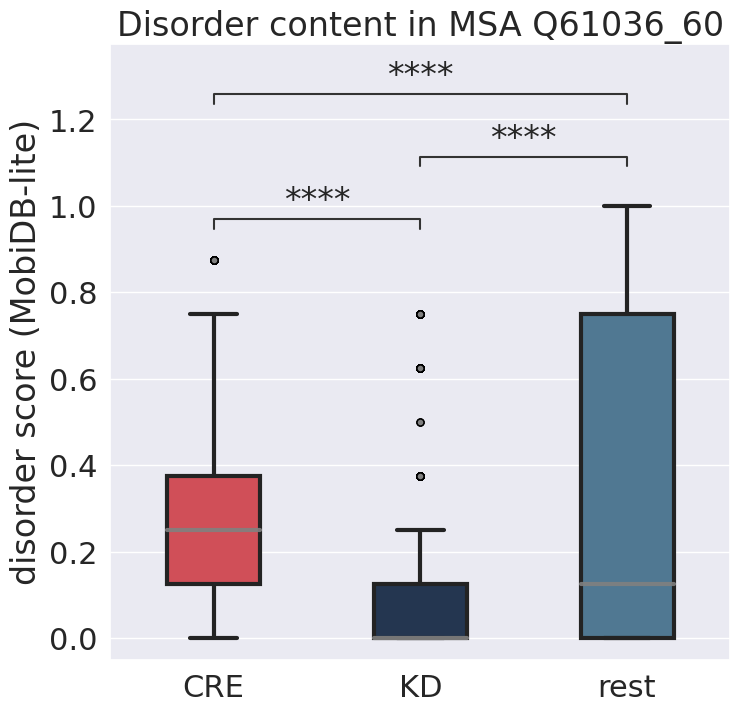

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:9.527e-129 U_stat=3.627e+05


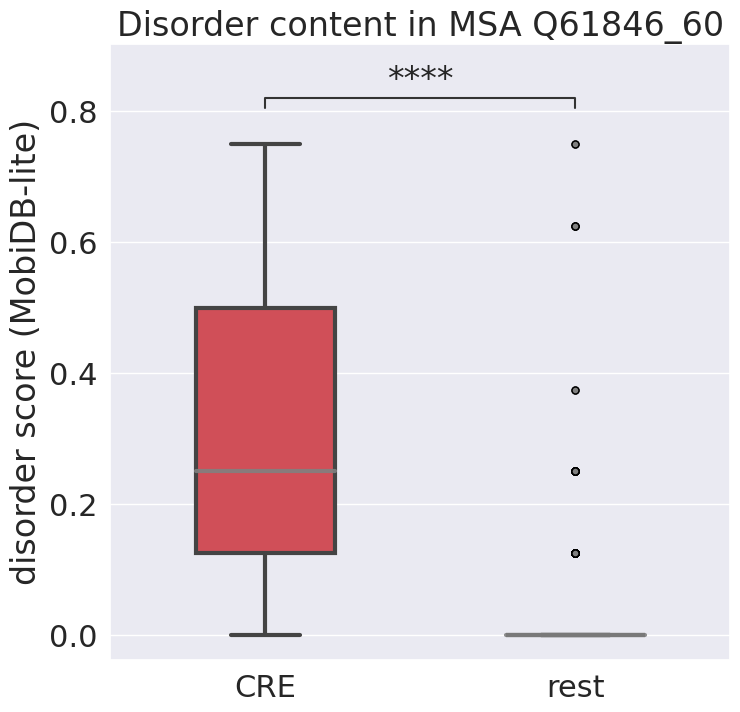

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:2.615e-107 U_stat=4.331e+04


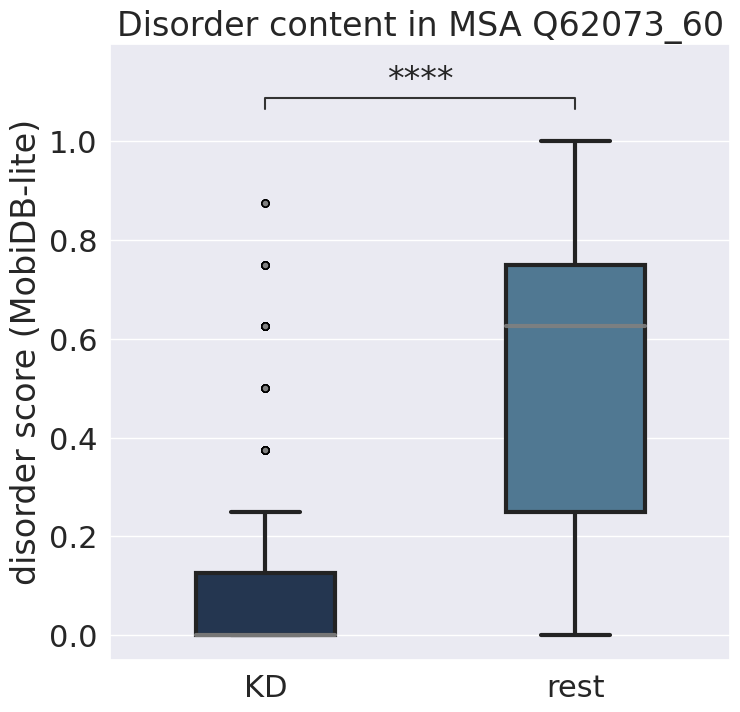

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:7.109e-06 U_stat=1.367e+05


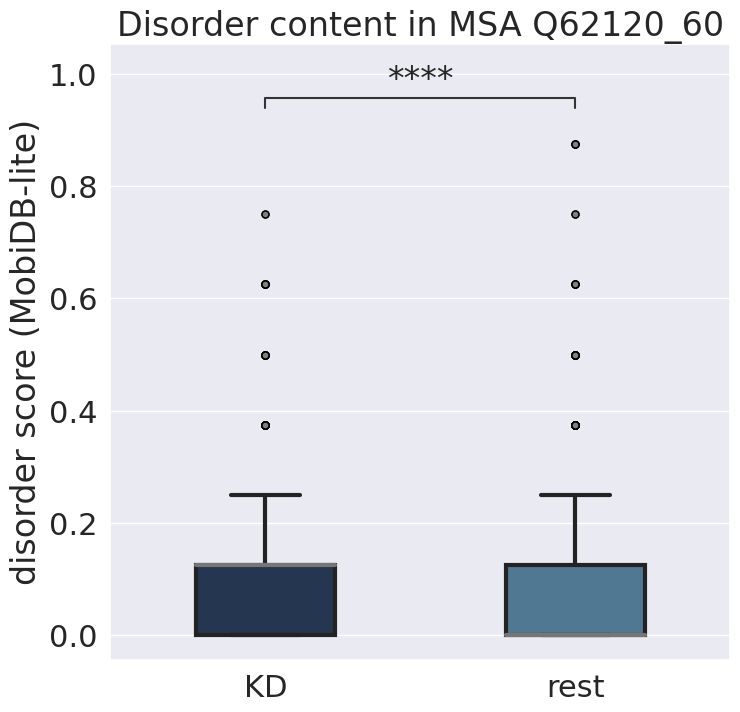

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=2.135e+07
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:4.761e-133 U_stat=5.092e+07
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:2.218e-117 U_stat=1.058e+09


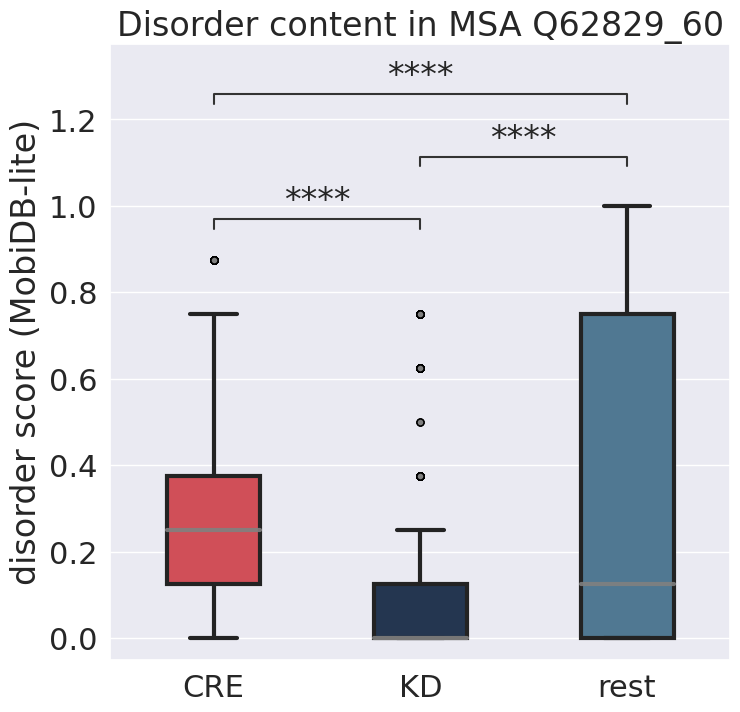

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:3.174e-36 U_stat=7.025e+04
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:9.346e-05 U_stat=4.664e+05
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.032e-27 U_stat=1.102e+05


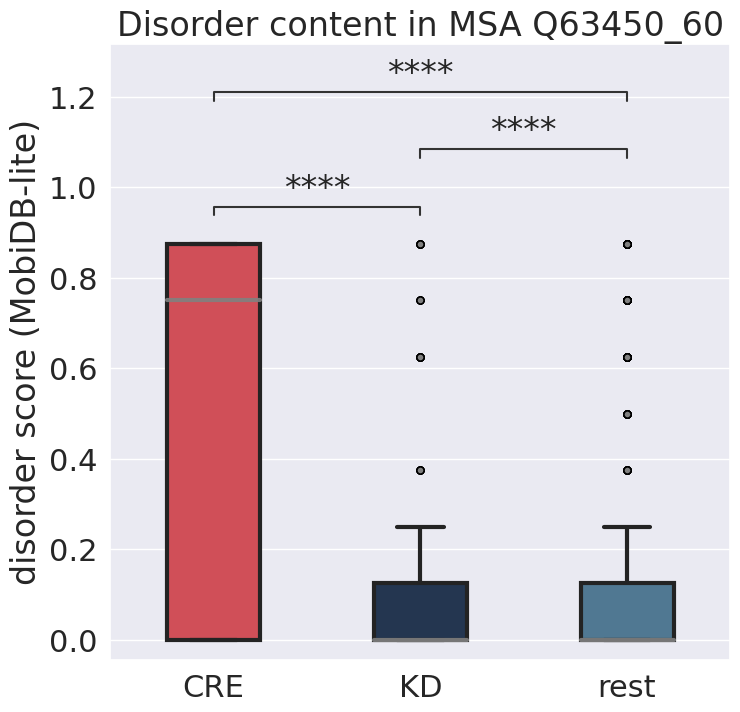

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:2.556e-133 U_stat=1.294e+07
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.093e-37 U_stat=5.451e+07
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:5.910e-146 U_stat=3.856e+08


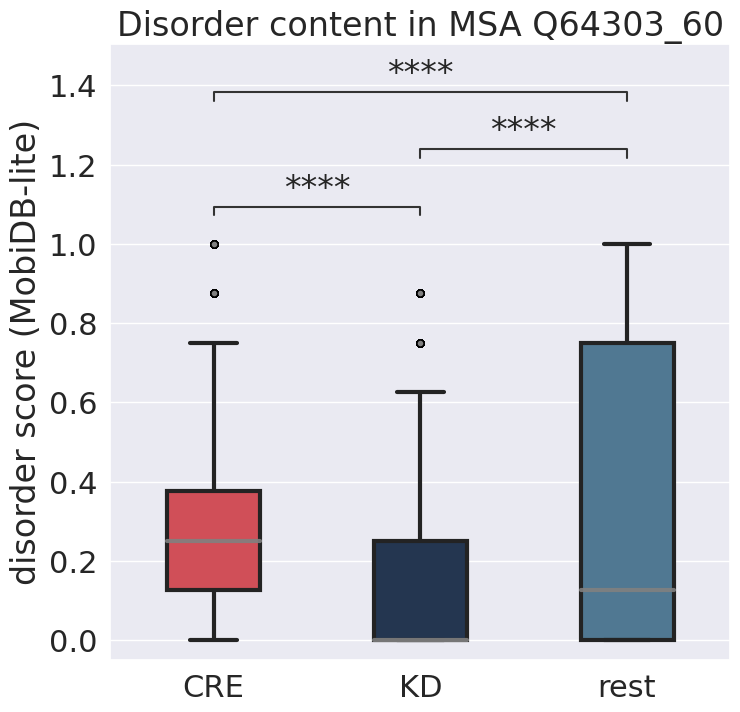

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=2.537e+06
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.292e-12 U_stat=1.078e+07
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=3.547e+07


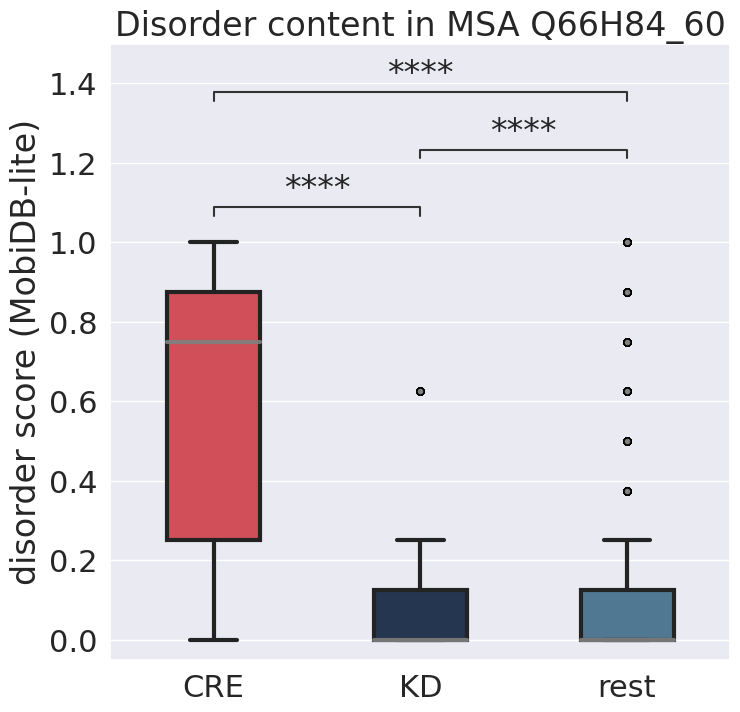

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:1.931e-300 U_stat=2.077e+06
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.564e-09 U_stat=6.732e+06
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=8.575e+07


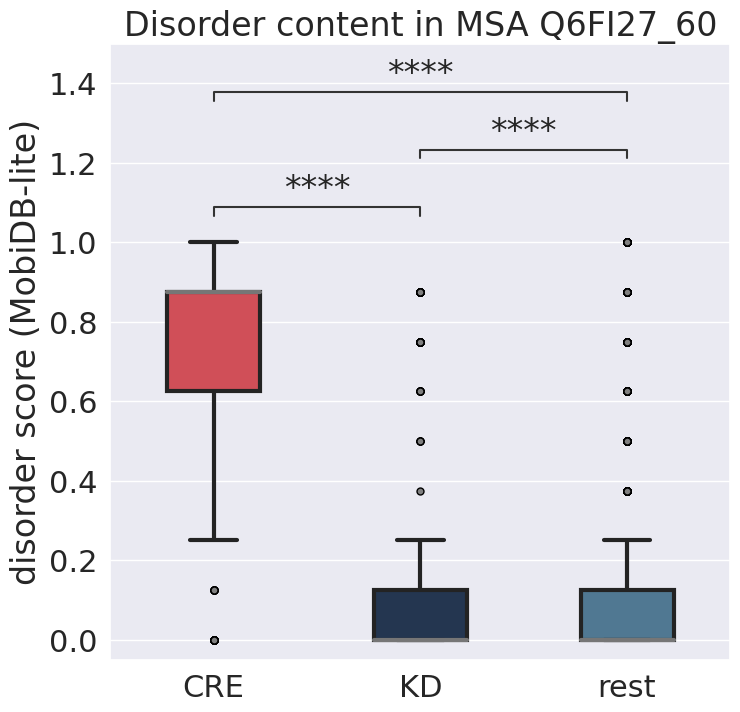

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.742e-09 U_stat=2.883e+04


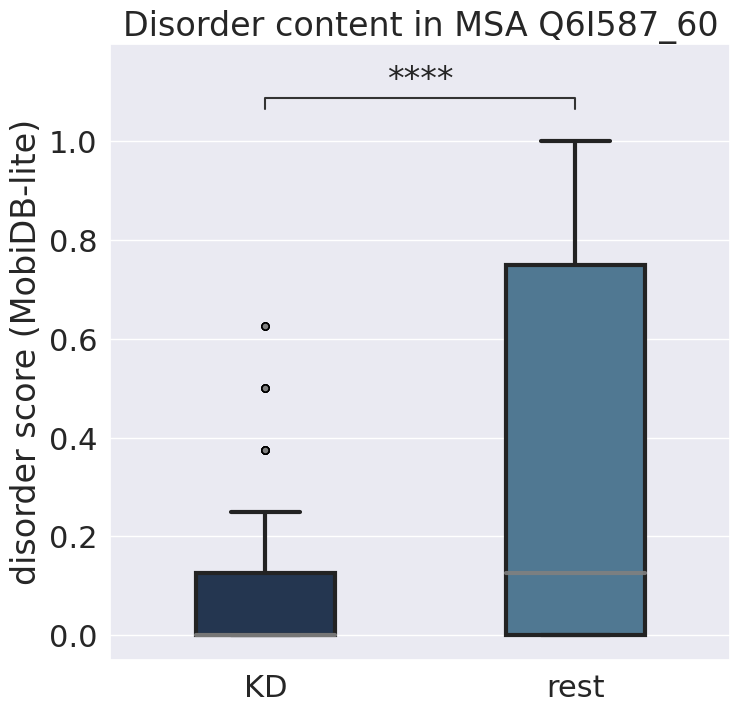

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:7.792e-03 U_stat=2.904e+04


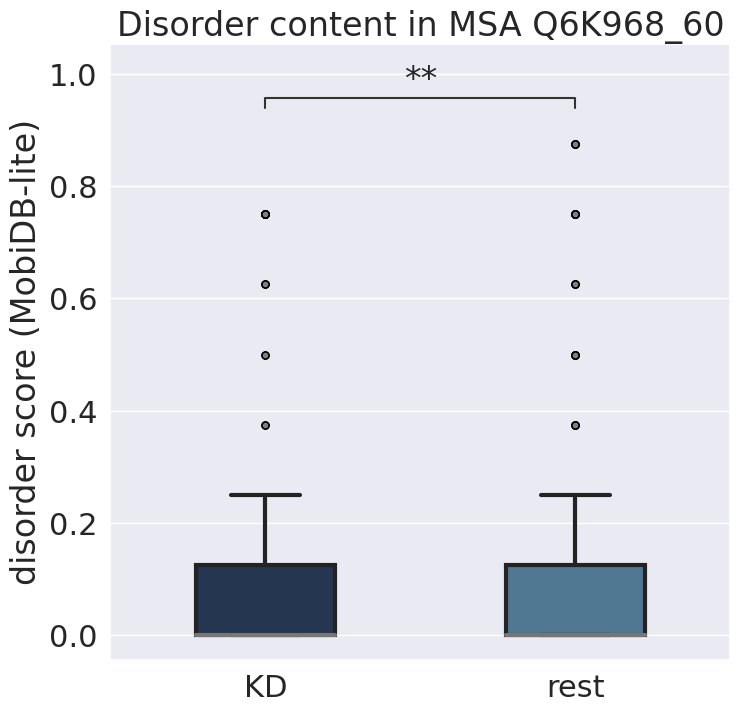

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=9.850e+06


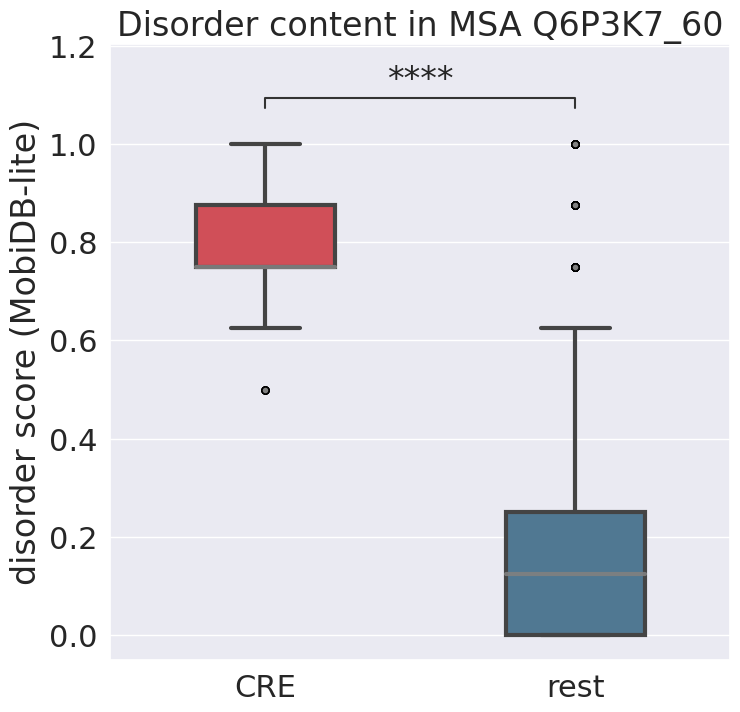

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=8.501e+08


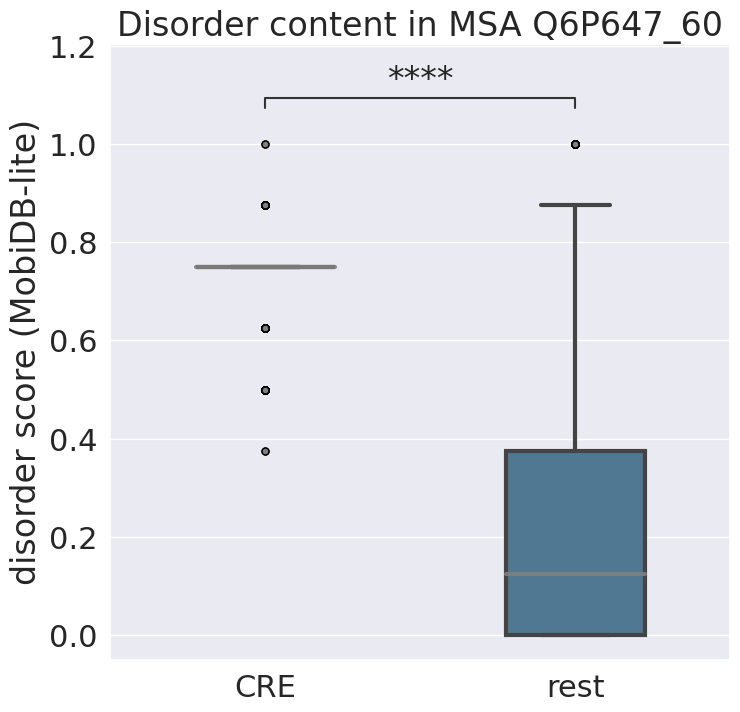

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:8.464e-229 U_stat=5.479e+06


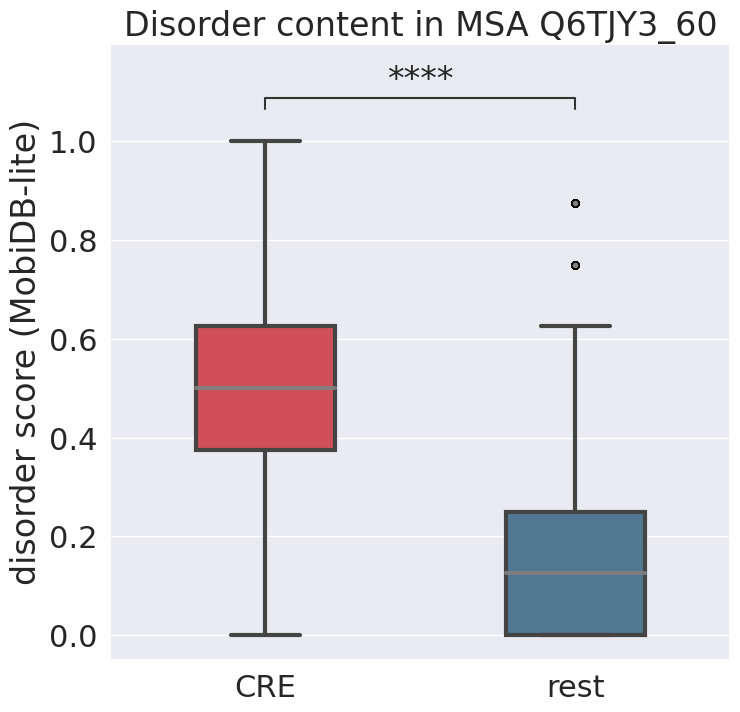

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:8.252e-01 U_stat=3.904e+04


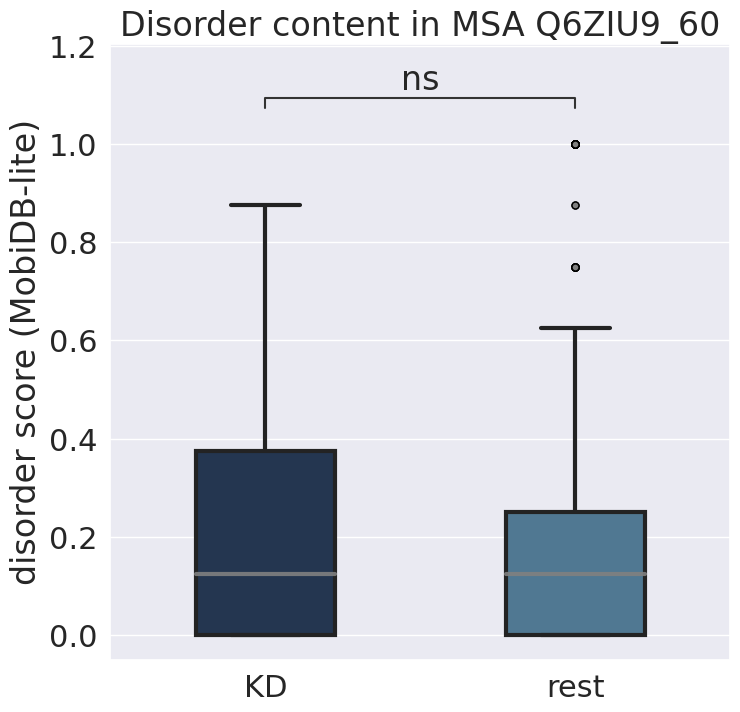

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:2.449e-06 U_stat=1.529e+05


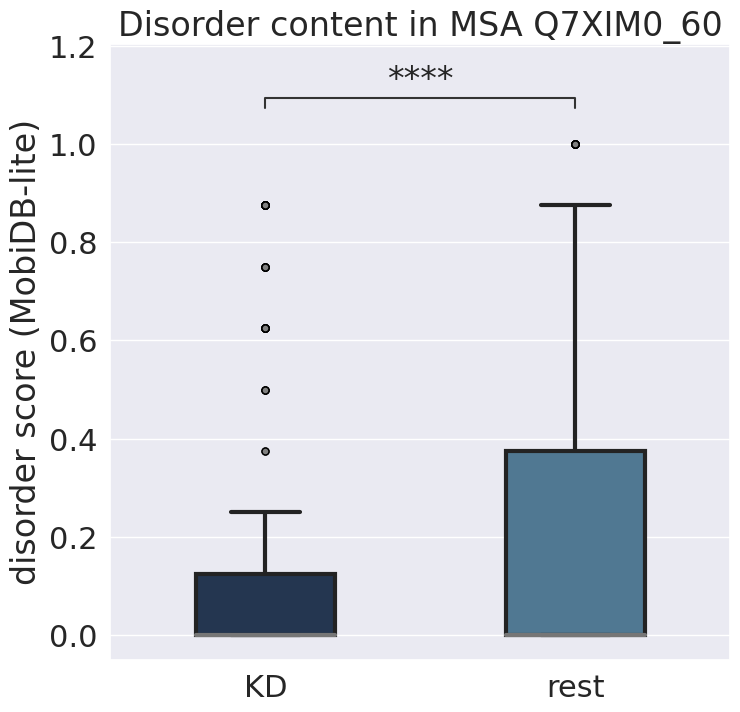

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.027e-11 U_stat=1.190e+05


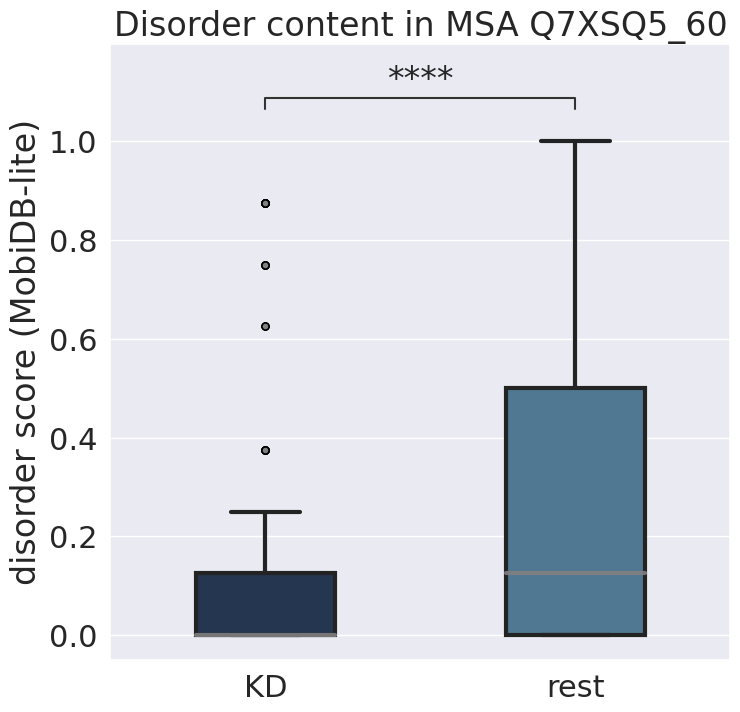

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:6.708e-109 U_stat=8.152e+06
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:2.642e-32 U_stat=1.903e+07
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=1.293e+09


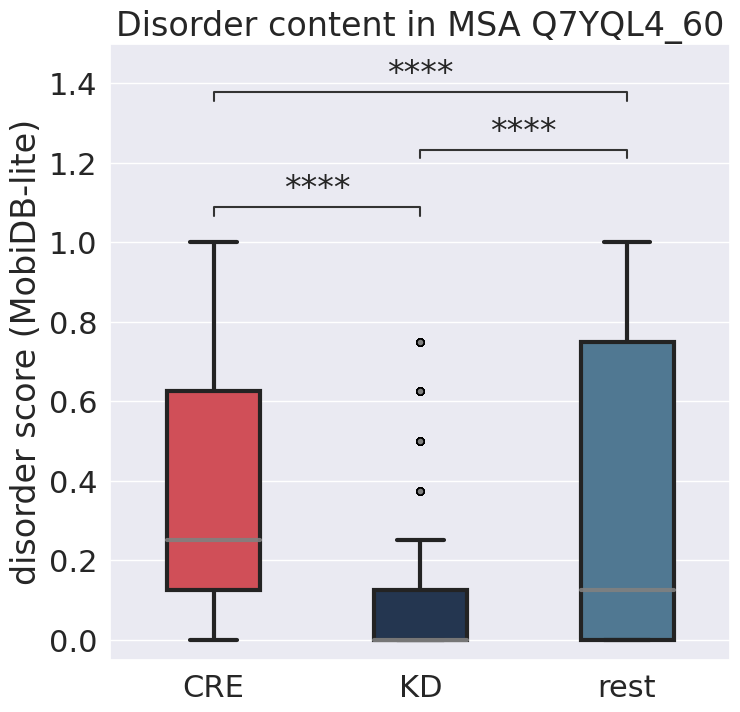

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:2.613e-02 U_stat=1.637e+05


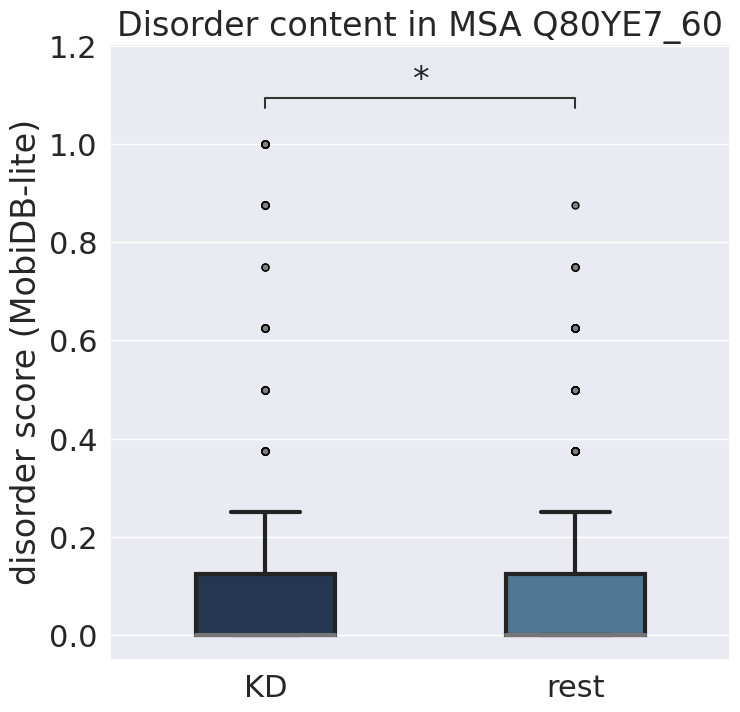

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.639e-08 U_stat=1.713e+05


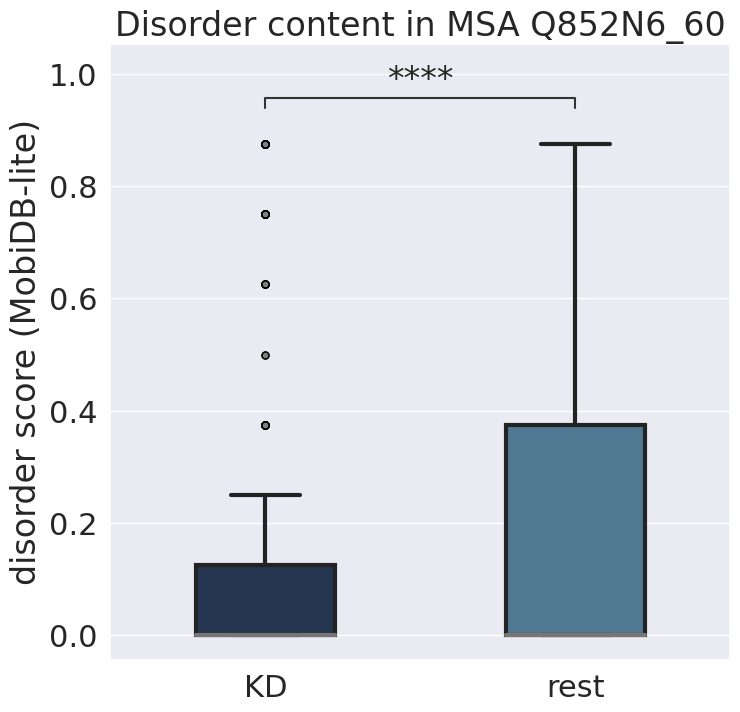

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.323e-05 U_stat=1.228e+06


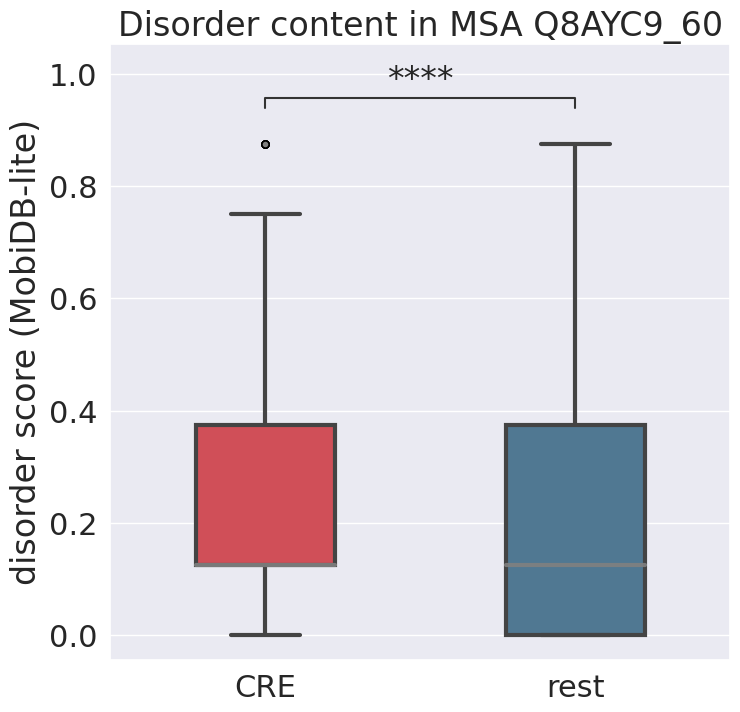

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:4.387e-02 U_stat=3.712e+06


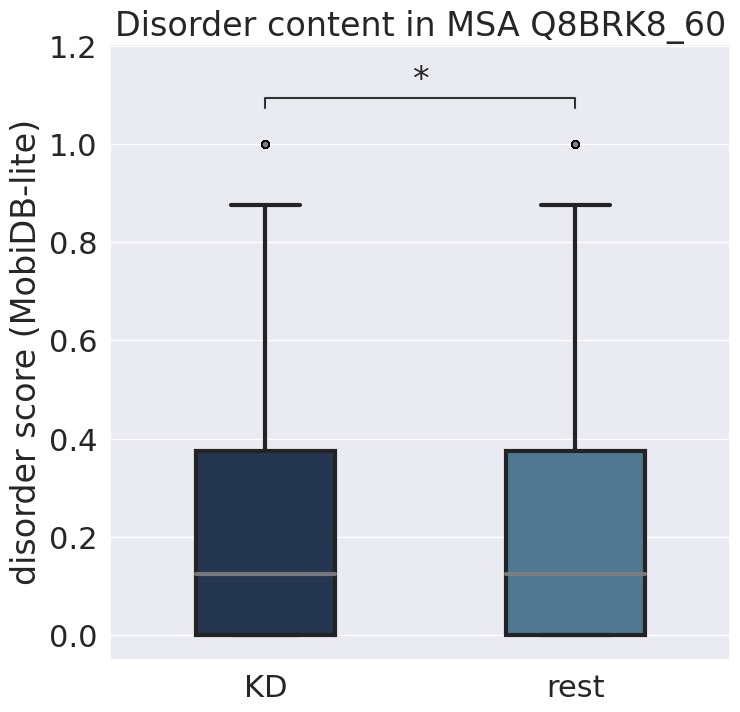

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=1.470e+07


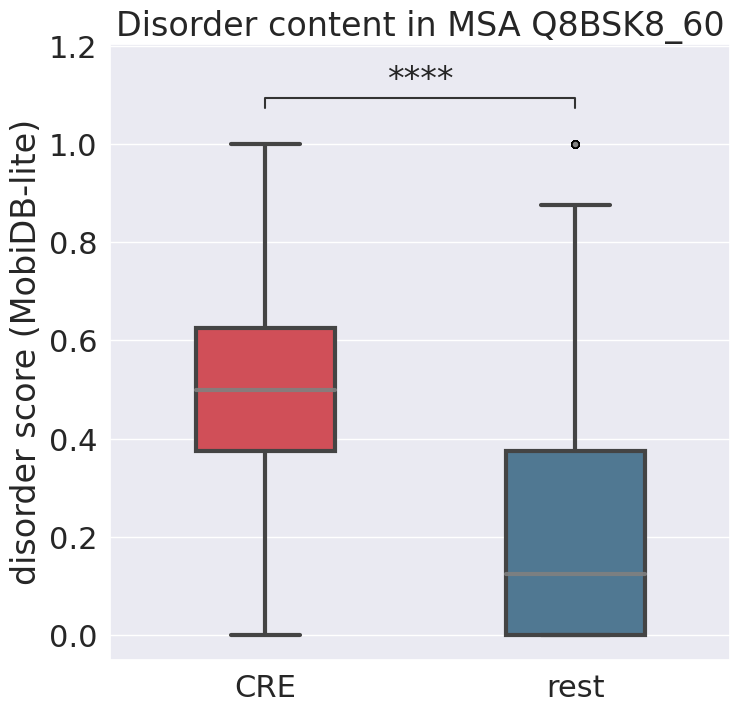

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:4.514e-32 U_stat=2.956e+04


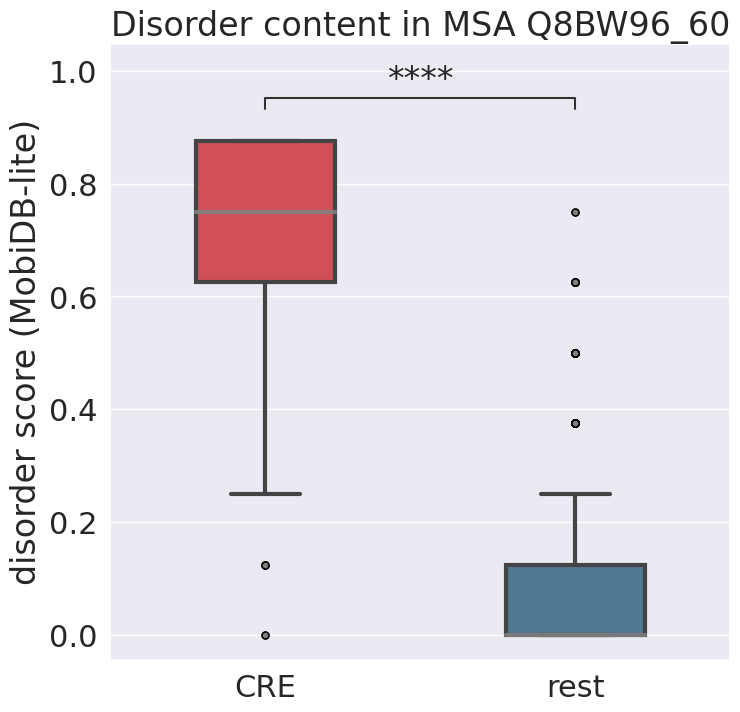

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:4.900e-116 U_stat=1.926e+07
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=3.556e+08
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.403e-85 U_stat=1.131e+07


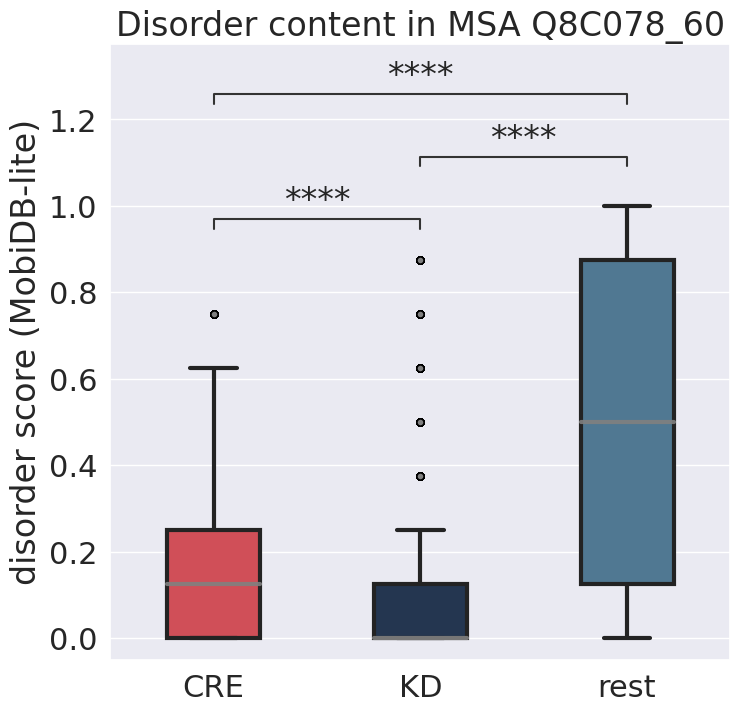

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:5.182e-203 U_stat=2.497e+07
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.696e-43 U_stat=1.055e+08
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=9.088e+08


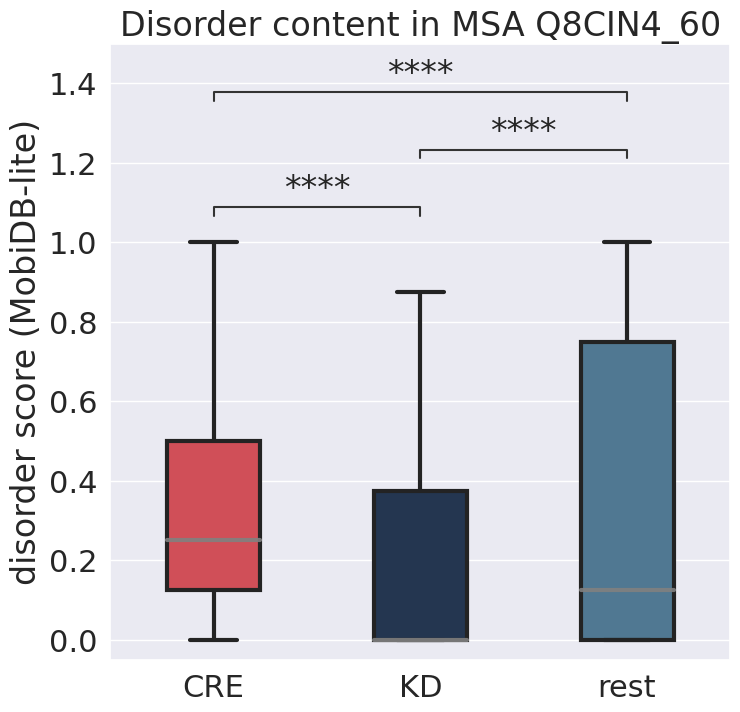

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:4.514e-32 U_stat=2.956e+04


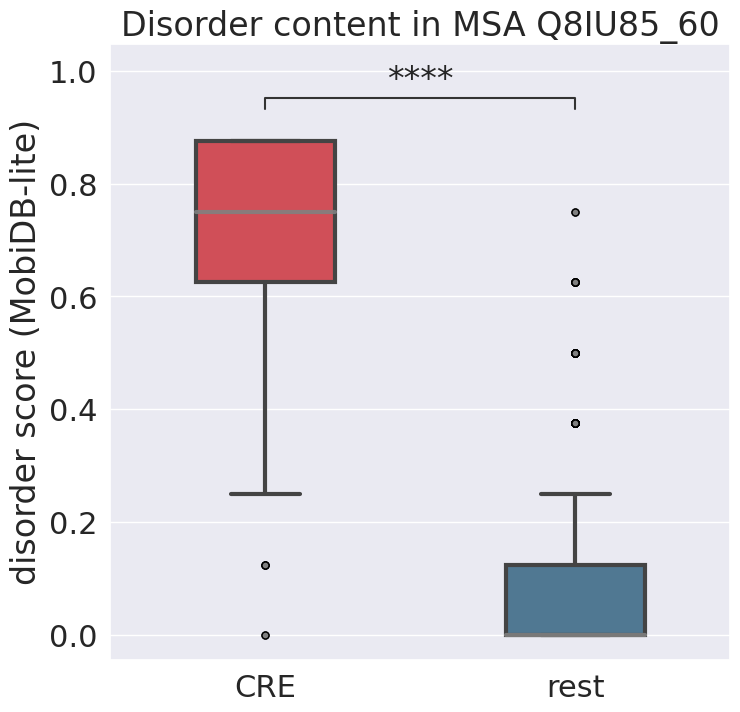

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=5.816e+08


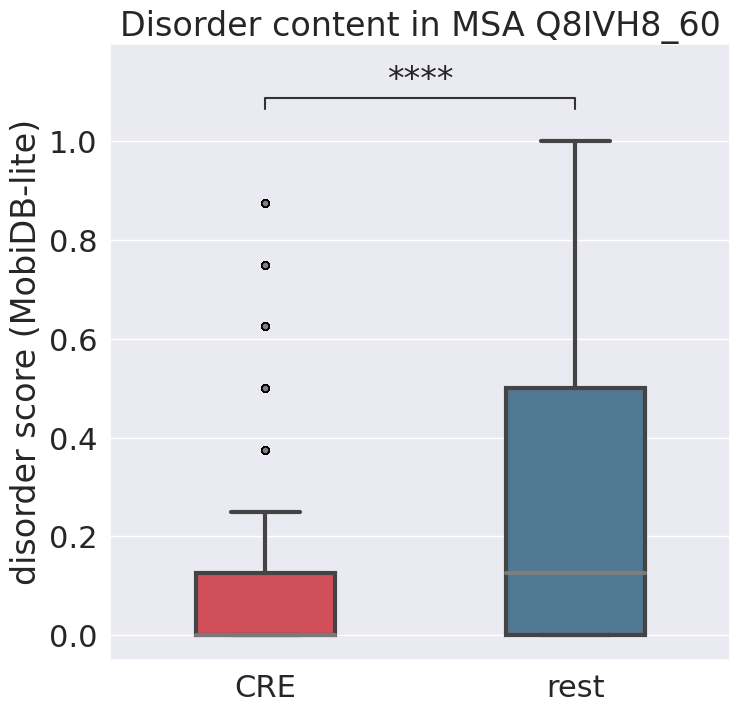

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=1.582e+07


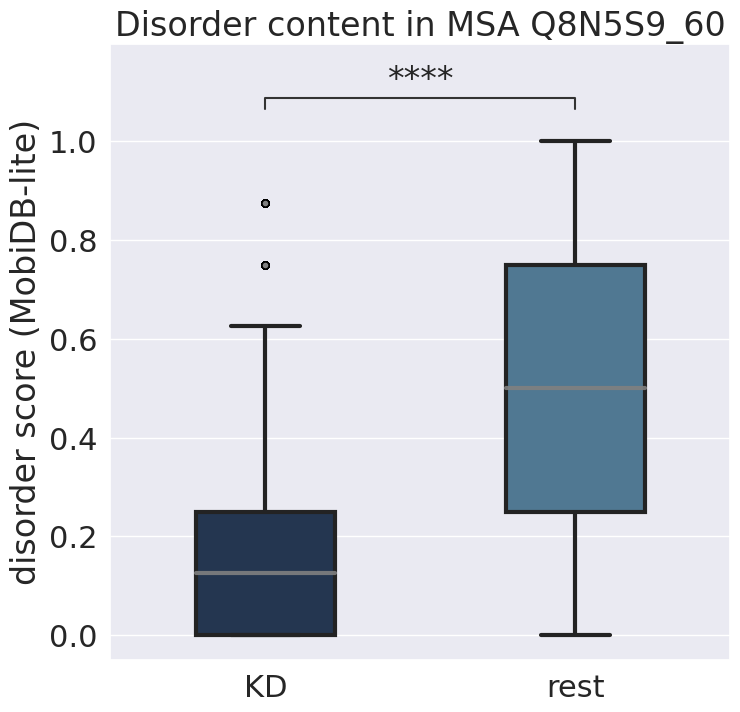

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:3.283e-29 U_stat=7.373e+05


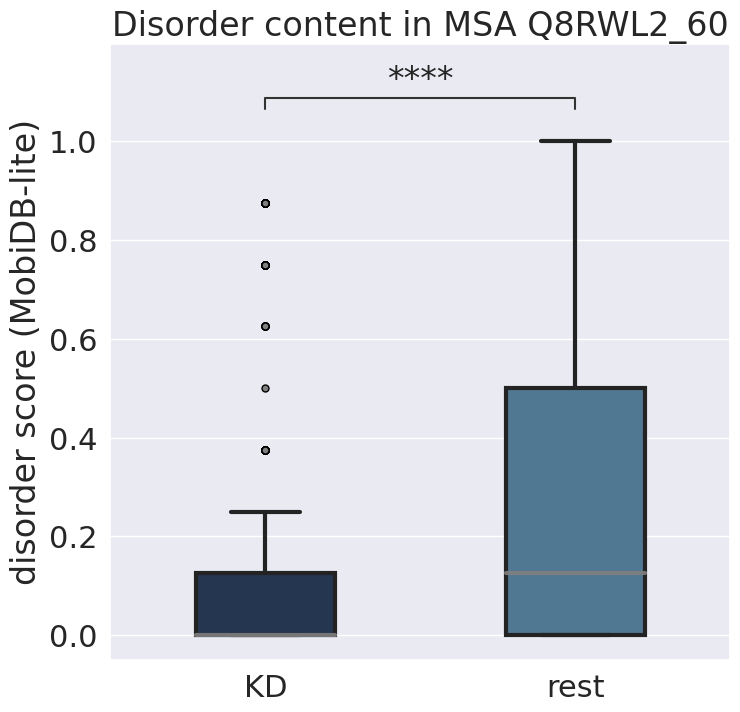

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=1.582e+07


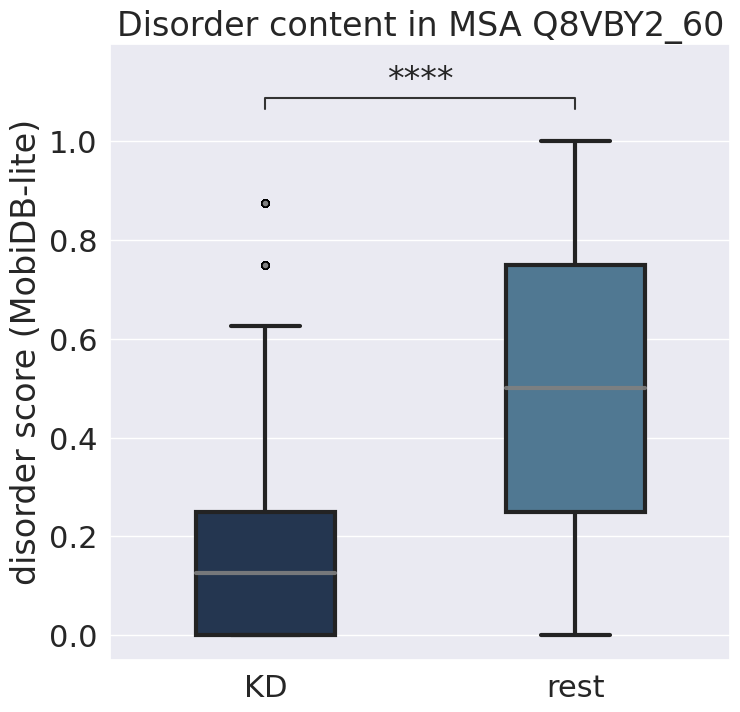

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.219e-193 U_stat=8.352e+05


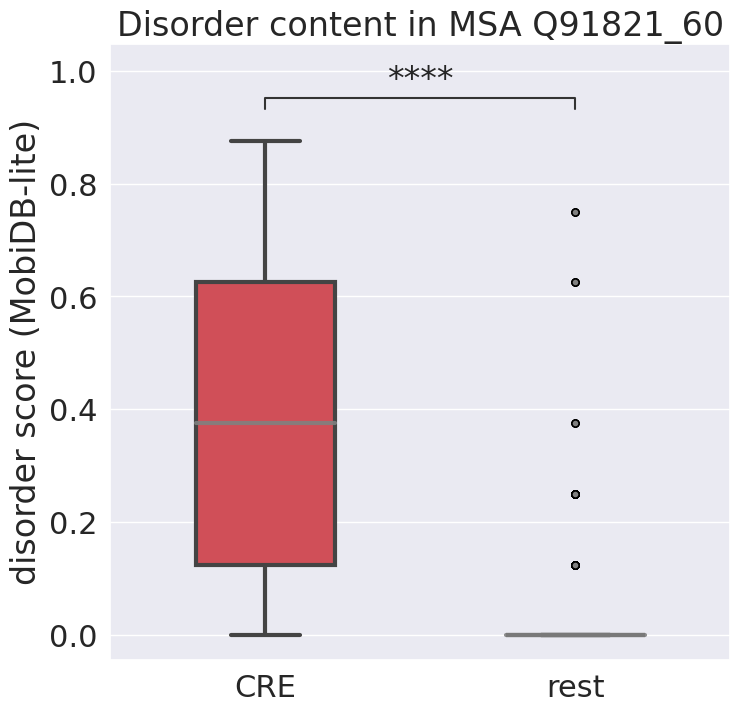

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:4.011e-141 U_stat=9.083e+05


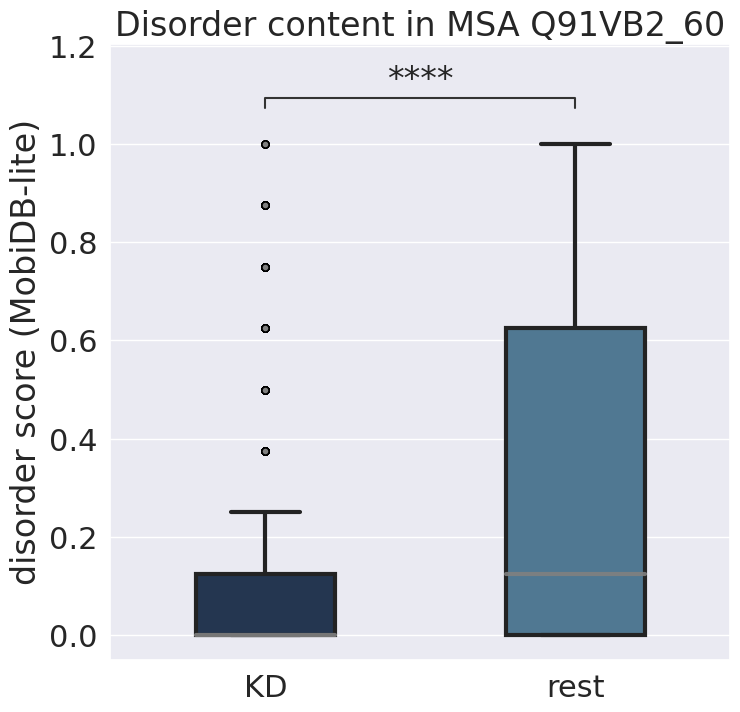

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:1.047e-32 U_stat=9.169e+04
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.840e-02 U_stat=7.417e+05
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:3.143e-25 U_stat=1.245e+05


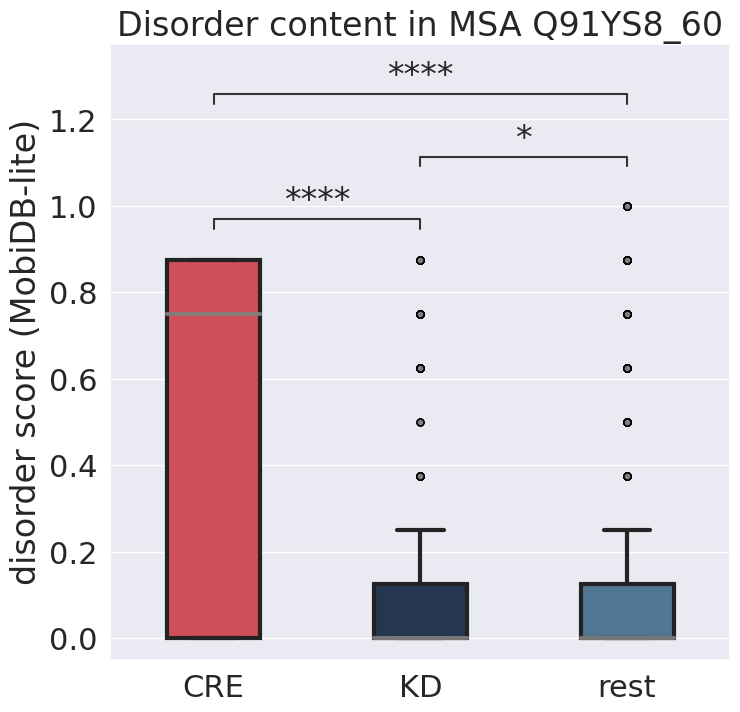

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:4.241e-01 U_stat=5.141e+05
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:3.153e-14 U_stat=1.096e+06
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.743e-132 U_stat=1.684e+07


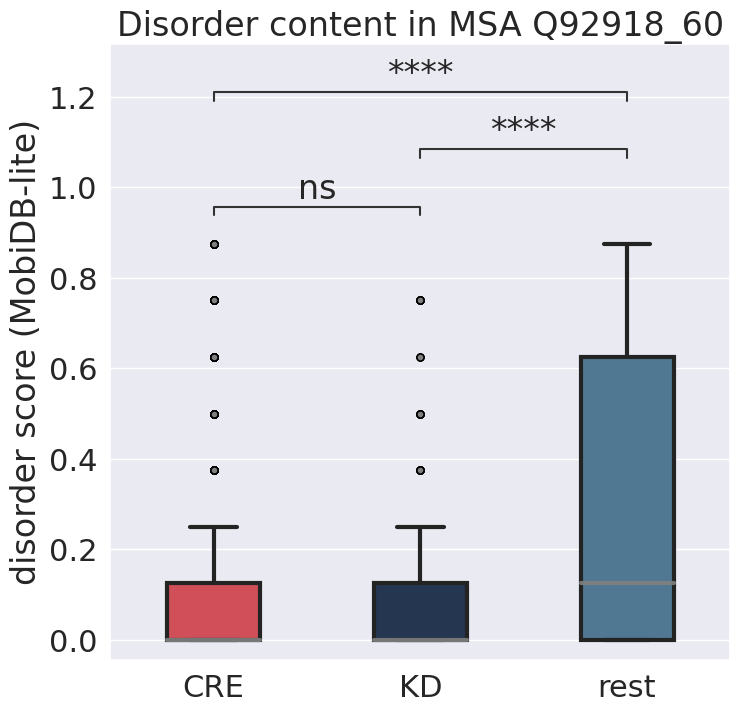

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:4.626e-119 U_stat=1.361e+07
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=2.055e+08
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:4.280e-72 U_stat=9.235e+06


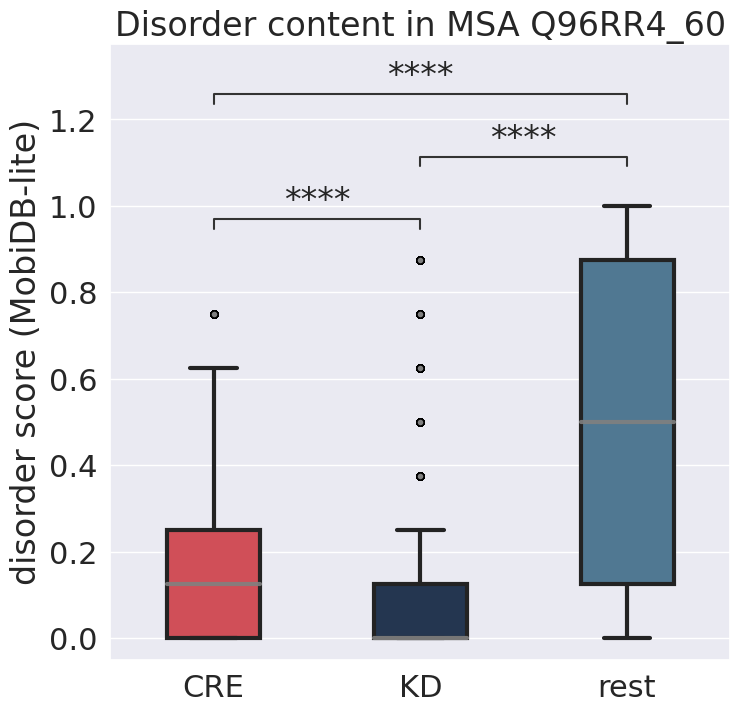

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:7.507e-121 U_stat=2.941e+06
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:4.789e-37 U_stat=4.913e+06
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:9.179e-189 U_stat=1.230e+08


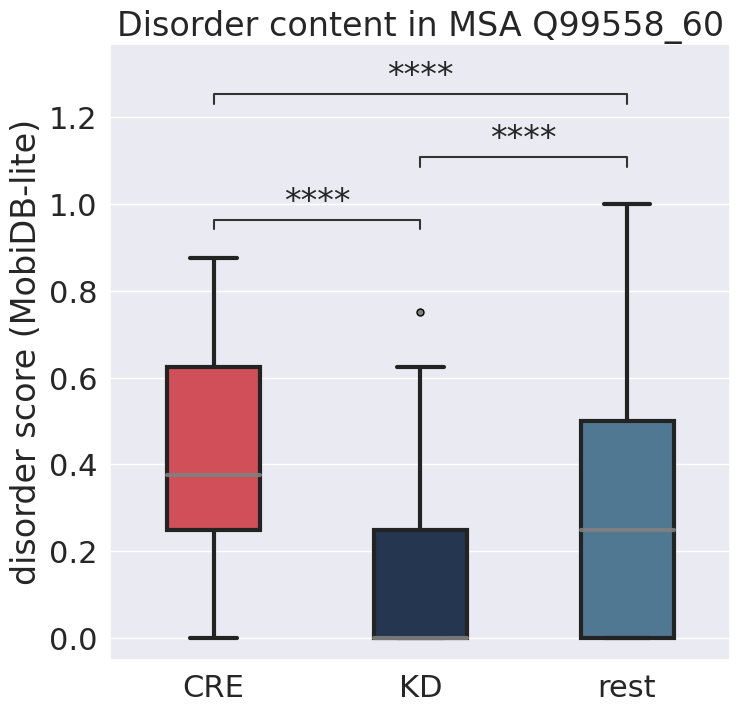

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=3.108e+08


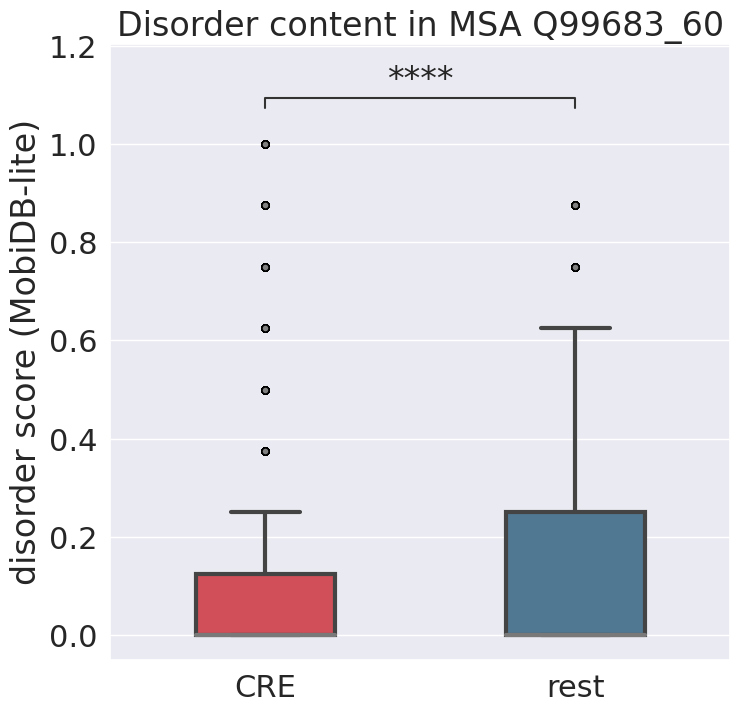

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:8.385e-54 U_stat=3.722e+05
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:5.764e-71 U_stat=1.228e+07
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:8.071e-13 U_stat=2.991e+06


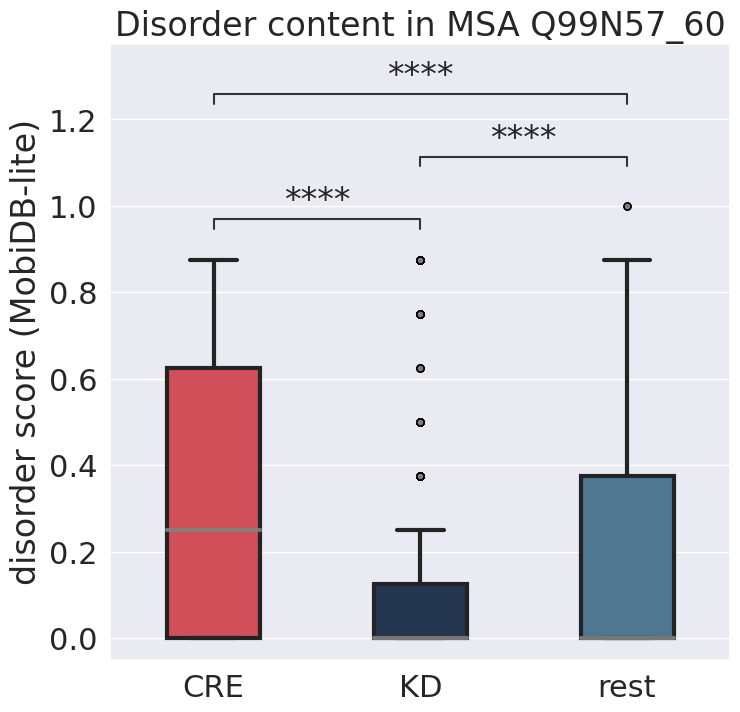

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=7.302e+08


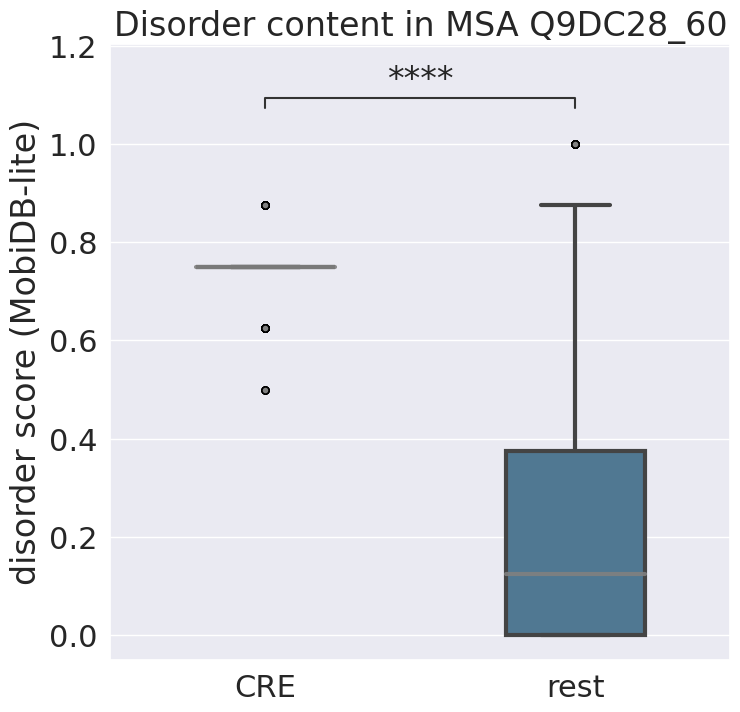

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:4.419e-01 U_stat=4.044e+04


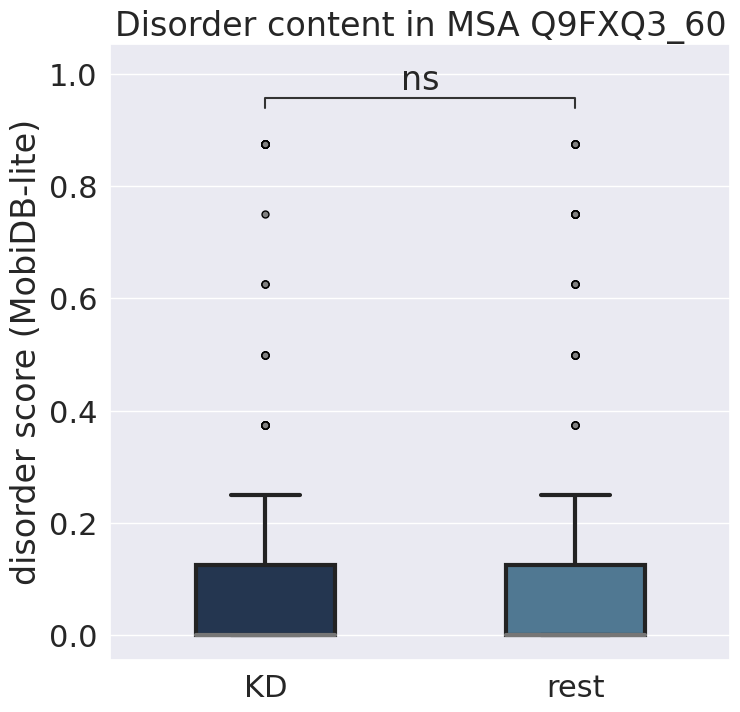

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=1.626e+09


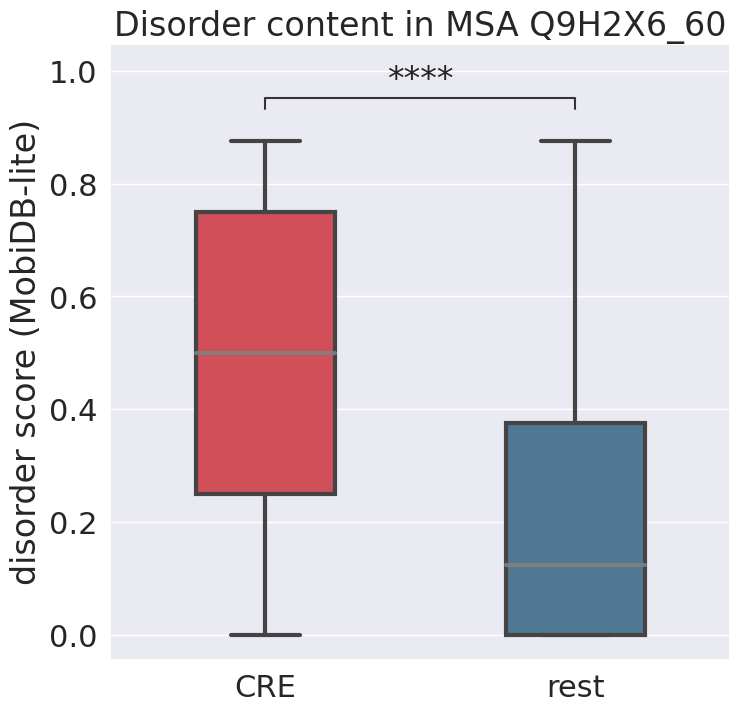

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.244e-13 U_stat=2.819e+06


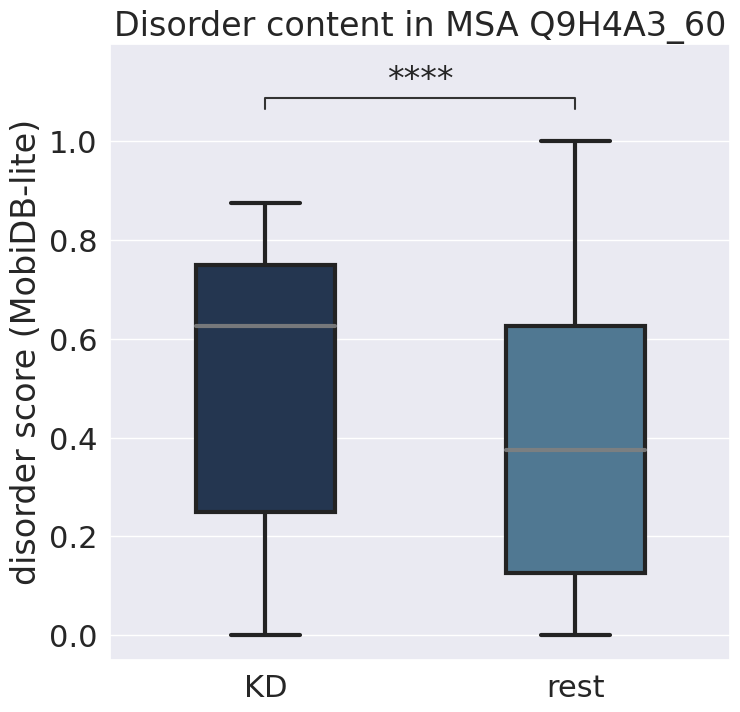

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.244e-13 U_stat=2.819e+06


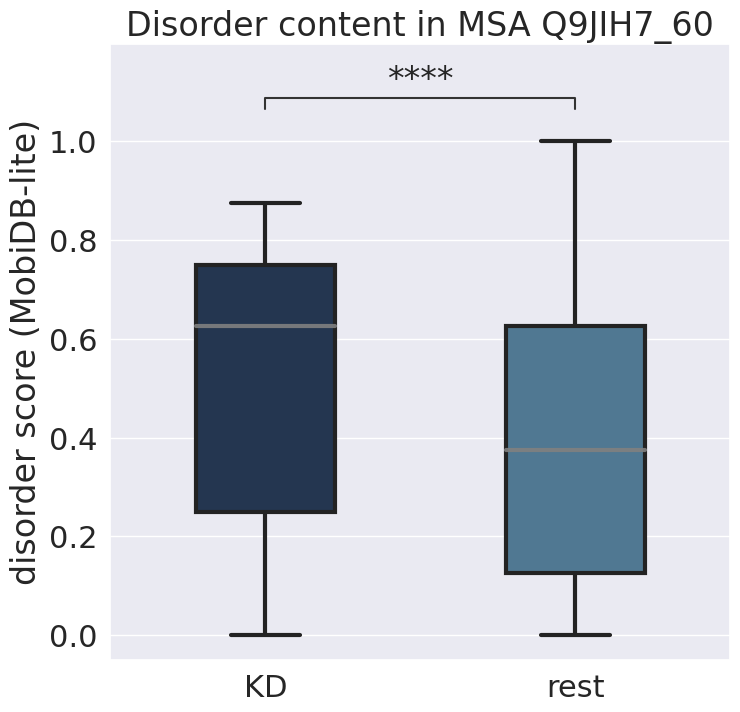

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=1.629e+09


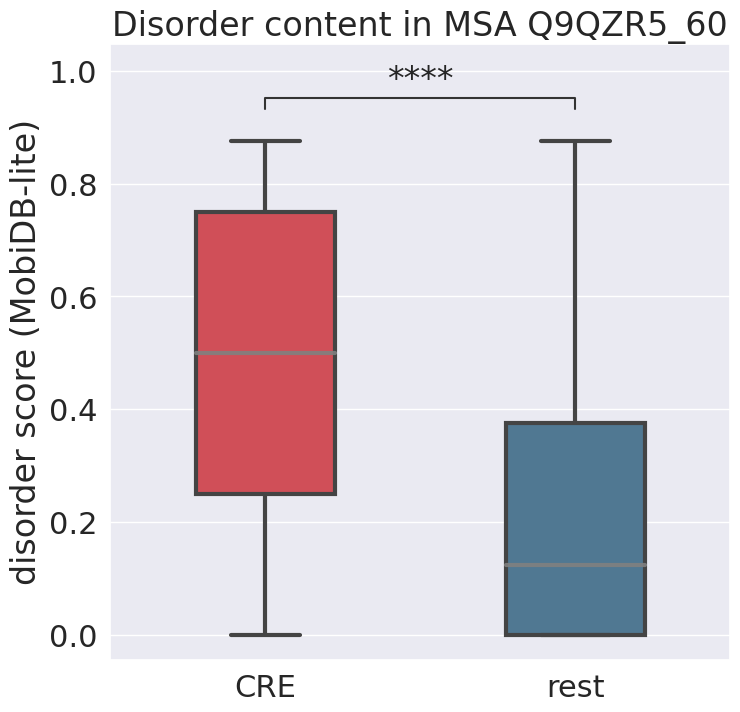

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.598e-02 U_stat=4.321e+04


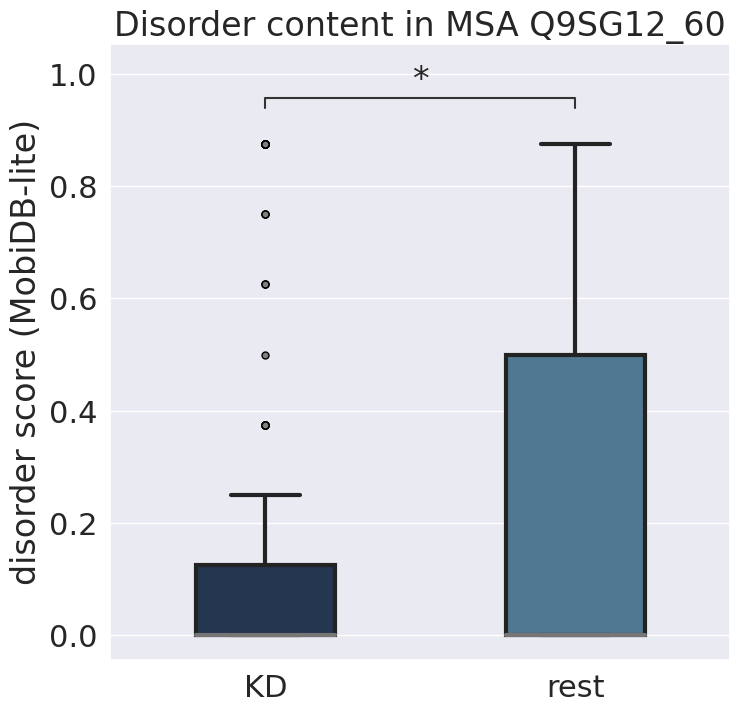

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:6.552e-04 U_stat=3.837e+05


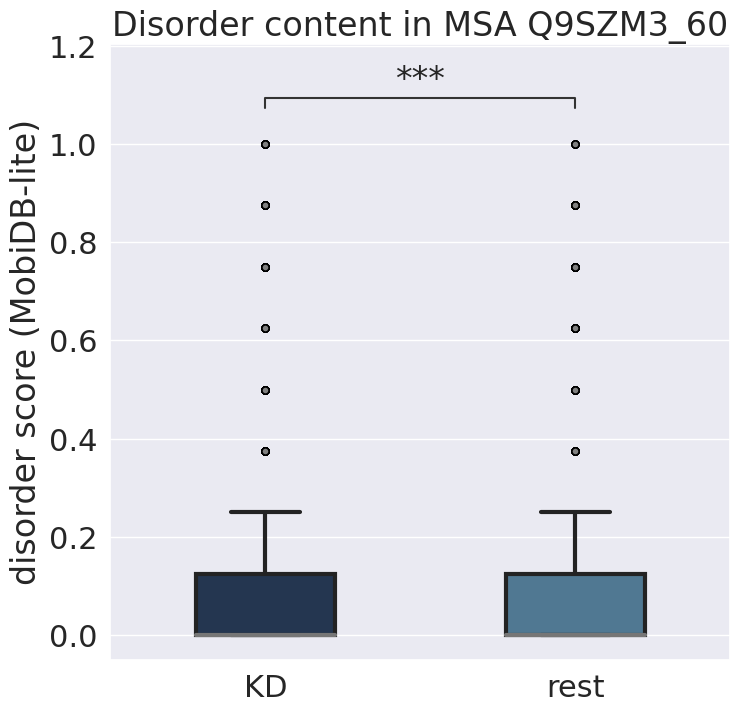

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:6.133e-148 U_stat=2.217e+05


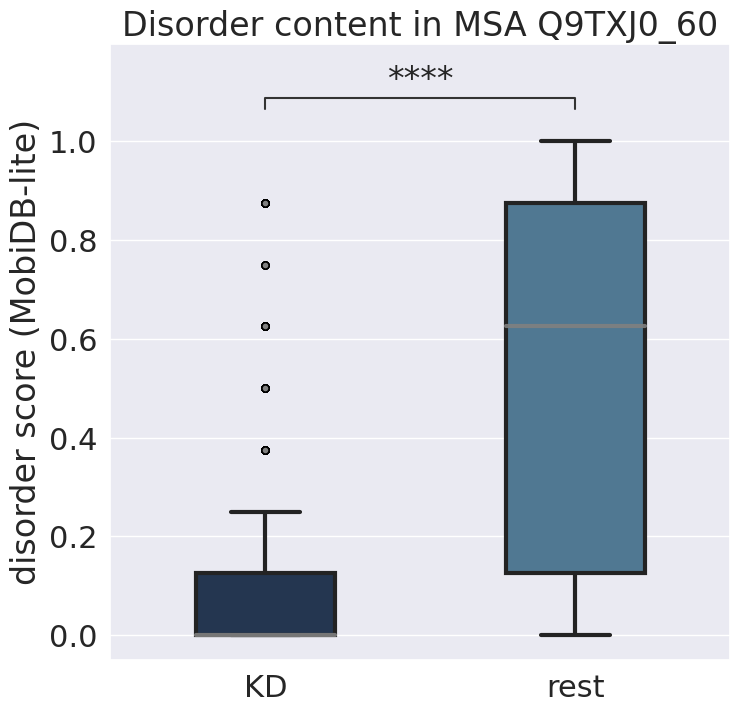

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:4.325e-07 U_stat=1.325e+06
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.815e-10 U_stat=8.213e+06
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:3.681e-08 U_stat=3.321e+08


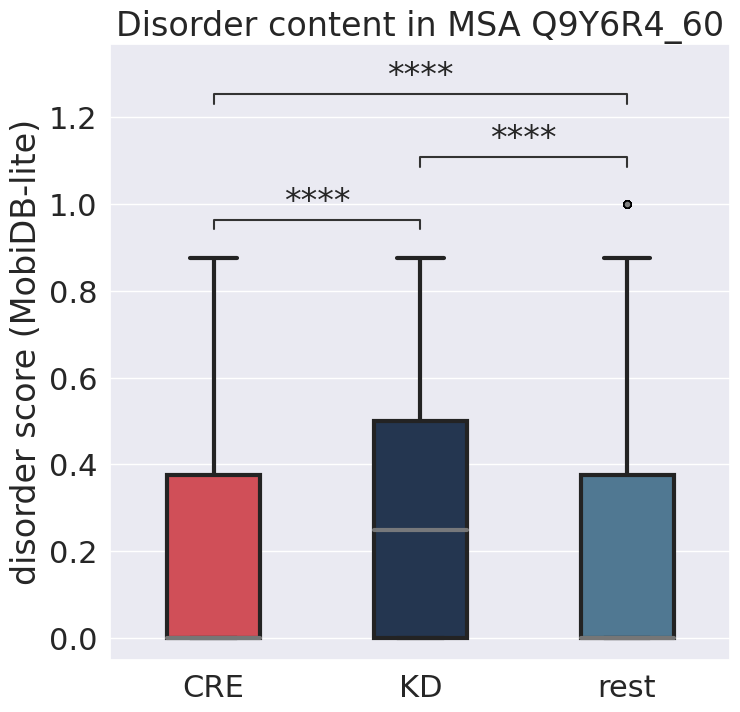

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:9.245e-60 U_stat=1.568e+05
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:2.761e-228 U_stat=6.644e+05
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:5.987e-01 U_stat=8.448e+04


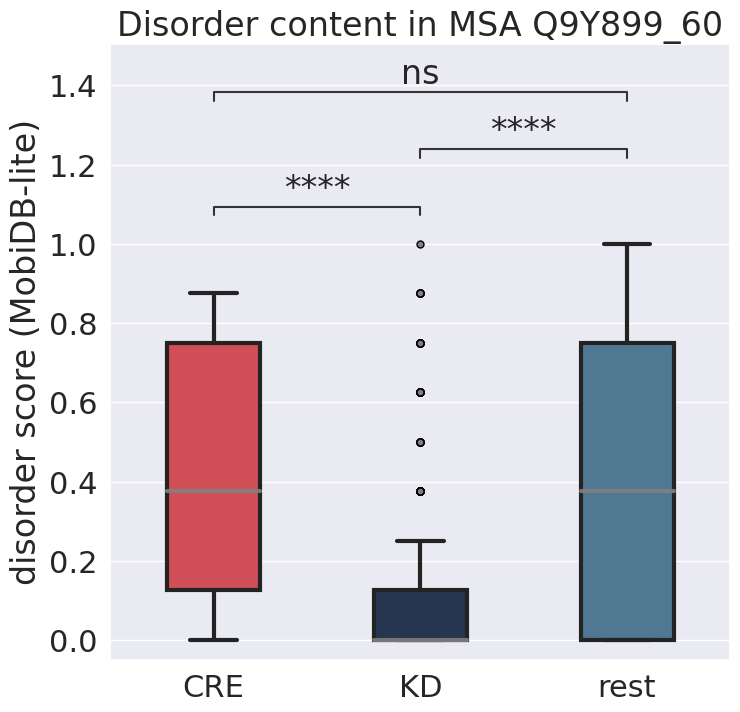

/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/alvaro/miniconda3/envs/alvenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:8.095e-01 U_stat=4.460e+05


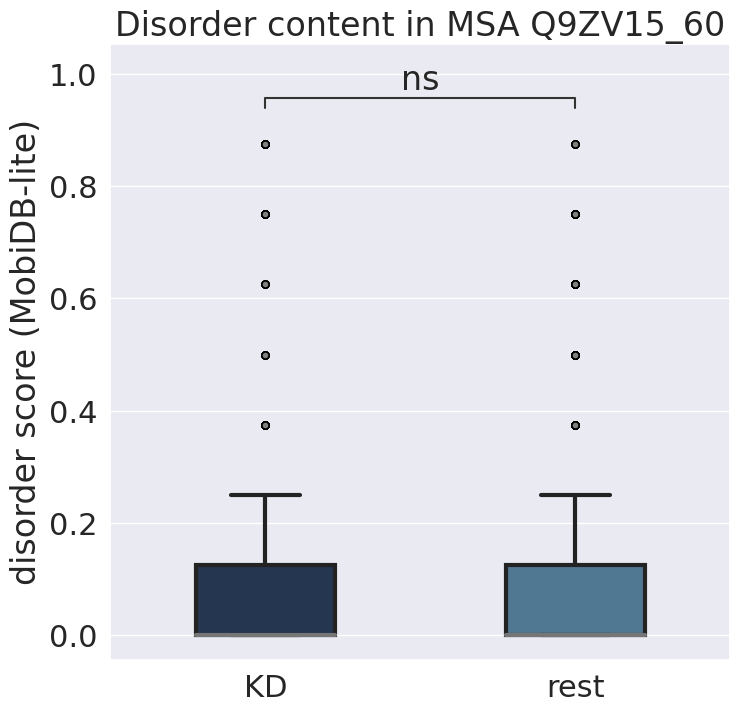

In [11]:
#This case performs the join between CRE, KD and disorder - no use
i = 0
msa_no_disorder = []
# First, group by msa
for msa, group in mobidb_lite_cre_msa.groupby("msa"):
    #print(msa)
    # print("####")
    # print(group)

    subset = group.explode("regions")
    # Set start and end disorder columns
    subset["start_disorder"] = subset.regions.apply(lambda x: x[0])
    subset["end_disorder"] = subset.regions.apply(lambda x: x[1])
    # Format columns
    subset = subset.rename(columns= {'start': 'start_term', 'end': 'end_term'})
    subset = subset.drop(columns= ['prediction_disorder_mobidb_lite', 'regions'])

    # Prepare PyRanges objects to perform join operation 
    term_pr = subset[['msa', 'uniprot_acc', 'term_id', 'start_term', 'end_term']].drop_duplicates()
    term_pr = term_pr.rename(columns= {'uniprot_acc': 'Chromosome', 'start_term': 'Start', 'end_term': 'End'})
    term_pr = pr.PyRanges(term_pr)
    disorder_pr = subset[['msa', 'uniprot_acc', 'scores', 'start_disorder', 'end_disorder']]#.drop_duplicates()
    disorder_pr = disorder_pr.rename(columns= {'uniprot_acc': 'Chromosome', 'start_disorder': 'Start', 'end_disorder': 'End'})
    disorder_pr = pr.PyRanges(disorder_pr)

    # Join operation and reformat it to dataframe
    df = term_pr.join(disorder_pr, report_overlap= True, suffix= "_disorder") # slack=1,
    df = df.as_df()
    #print(df.shape)

    # If no join operation, skip it
    if df.shape[0] == 0:
        msa_no_disorder.append(msa)
        continue
    else:
        df = df.rename(columns= {'Chromosome': 'uniprot_acc', 'Start': 'start_term', 'End': 'end_term'})
        #print(df)
        df = df.drop(columns= ['msa_disorder'])
        df.columns = df.columns.str.lower()
        # Drop duplicates
        df.scores = df.scores.apply(str)
        df = df.drop_duplicates()
        df.scores = df.scores.apply(lambda x: eval(x)) # as dict again


        # Get scores for CREs overlapping disordered region, and the rest of the protein 
        scores = {}
        df["scores_cre"] = None
        df["scores_kd"] = None
        df["scores_rest"] = None

        for i, row in df.iterrows():

            scores_cre = {}
            scores_kd = {}
            scores_rest = {}

            for ix, s in enumerate(row.scores):
                ix += 1 # protein indexes start in 1
                # scores of the cre
                if ix >= row.start_term and ix <= row.end_term and row.term_id.startswith("cre"):
                    scores_cre[ix] = s
                # scores of the kd
                elif ix >= row.start_term and ix <= row.end_term and row.term_id.startswith("kd"):
                    scores_kd[ix] = s
                # scores of the rest
                else:  
                    scores_rest[ix] = s
            # Add the score to df
            df.scores_cre[i] = scores_cre
            df.scores_kd[i] = scores_kd
            df.scores_rest[i] = scores_rest

        # List of scores by feature
        list_scores_cre = [ list(d.values()) for d in df.scores_cre ]
        list_scores_kd = [ list(d.values()) for d in df.scores_kd ]
        list_scores_rest = [ list(d.values()) for d in df.scores_rest ]
        # flatten it
        list_scores_cre = [ item for sublist in list_scores_cre for item in sublist ]
        list_scores_kd = [ item for sublist in list_scores_kd for item in sublist ]
        list_scores_rest = [ item for sublist in list_scores_rest for item in sublist ]

        # Dataframe with disorder scores by feature (cre, kd, rest)
        cre_df = pd.DataFrame(list_scores_cre, columns= ['score'])
        cre_df["feature"] = "CRE"
        kd_df = pd.DataFrame(list_scores_kd, columns= ['score'])
        kd_df["feature"] = "KD"
        rest_df = pd.DataFrame(list_scores_rest, columns= ['score'])
        rest_df["feature"] = "rest"
        scores_df = pd.concat([cre_df, kd_df, rest_df])


        # Boxplots with statistics
        # palette: https://coolors.co/palette/e63946-f1faee-a8dadc-457b9d-1d3557
        # annotator: https://levelup.gitconnected.com/statistics-on-seaborn-plots-with-statannotations-2bfce0394c00

        if scores_df.feature.nunique() == 3: 
            colors = ["#e63946", "#1D3557", "#457b9d"]
        elif set(scores_df.feature) == {'KD', 'rest'}:
            colors = ["#1D3557", "#457b9d"]   
        elif set(scores_df.feature) == {'CRE', 'rest'}:
            colors = ["#e63946", "#457b9d"]

        sns.set(rc={'figure.figsize':(8, 8)}, font_scale= 2)

        flierprops = dict(marker='o', markerfacecolor='gray', markersize= 5,  markeredgecolor='black')
        ax = sns.boxplot(data= scores_df, x= 'feature', y= 'score', width= 0.45, linewidth= 3, medianprops=dict(color="gray", alpha=0.9), palette= colors, flierprops= flierprops) # , notch= True , showmeans= True, meanline= True

        # Combinations to compare
        comb = combinations(scores_df.feature.unique(), 2)
        pairs = [ i for i in comb ]

        annotator = Annotator(ax= ax, pairs= pairs, data= scores_df, x= 'feature', y= 'score')
        annotator.configure(test= 'Mann-Whitney', text_format='star')
        annotator.apply_and_annotate()

        #plt.rcParams['font.size'] = 16
        plt.title(f"Disorder content in MSA {msa}")
        plt.ylabel("disorder score (MobiDB-lite)")
        plt.xlabel("")

        plt.savefig(f'../plots/disorder_content/by_msa/{msa}.png', dpi=200)
        #plt.show()

    i+=1


In [12]:
i

7

### Join operation - group the disorder scores of residues into: cre; kd; rest

In [88]:
# Ejemplo
subset = mobidb_lite_cre_msa[mobidb_lite_cre_msa.msa == 'Q13557_60']
subset = subset.explode("regions")
subset

,uniprot_acc,prediction_disorder_mobidb_lite,regions,content_count,content_fraction,scores,term_id,start,end,is_reference,msa
59,A0A672V2Q0,"{'regions': [[337, 376]], 'content_count': 40,...","[337, 376]",40,0.078,"[0.625, 0.625, 0.75, 0.75, 0.625, 0.625, 0.375...",kd29,14,272,False,Q13557_60
64,A0A672V2Q0,"{'regions': [[337, 376]], 'content_count': 40,...","[337, 376]",40,0.078,"[0.625, 0.625, 0.75, 0.75, 0.625, 0.625, 0.375...",cre27,283,292,False,Q13557_60
69,A0A672V2Q0,"{'regions': [[337, 376]], 'content_count': 40,...","[337, 376]",40,0.078,"[0.625, 0.625, 0.75, 0.75, 0.625, 0.625, 0.375...",kd57,14,272,False,Q13557_60
74,A0A672V2Q0,"{'regions': [[337, 376]], 'content_count': 40,...","[337, 376]",40,0.078,"[0.625, 0.625, 0.75, 0.75, 0.625, 0.625, 0.375...",cre57,283,292,False,Q13557_60
79,A0A672V2Q0,"{'regions': [[337, 376]], 'content_count': 40,...","[337, 376]",40,0.078,"[0.625, 0.625, 0.75, 0.75, 0.625, 0.625, 0.375...",kd131,14,272,False,Q13557_60
...,...,...,...,...,...,...,...,...,...,...,...
39248,A0A670IHM7,"{'regions': [[336, 375]], 'content_count': 40,...","[336, 375]",40,0.078,"[0.625, 0.75, 0.75, 0.75, 0.75, 0.5, 0.5, 0.25...",cre197,283,292,False,Q13557_60
39253,A0A670IHM7,"{'regions': [[336, 375]], 'content_count': 40,...","[336, 375]",40,0.078,"[0.625, 0.75, 0.75, 0.75, 0.75, 0.5, 0.5, 0.25...",kd242,14,272,False,Q13557_60
39258,A0A670IHM7,"{'regions': [[336, 375]], 'content_count': 40,...","[336, 375]",40,0.078,"[0.625, 0.75, 0.75, 0.75, 0.75, 0.5, 0.5, 0.25...",cre242,283,292,False,Q13557_60
39512,A0A2K6ED16,"{'regions': [[337, 375]], 'content_count': 39,...","[337, 375]",39,0.073,"[0.625, 0.75, 0.75, 0.75, 0.75, 0.5, 0.5, 0.25...",kd131,14,272,False,Q13557_60


In [89]:
# Set start and end disorder columns
subset["start_disorder"] = subset.regions.apply(lambda x: x[0])
subset["end_disorder"] = subset.regions.apply(lambda x: x[1])

In [90]:
# Format columns
subset = subset.rename(columns= {'start': 'start_term', 'end': 'end_term'})
subset = subset.drop(columns= ['prediction_disorder_mobidb_lite', 'regions'])
subset

,uniprot_acc,content_count,content_fraction,scores,term_id,start_term,end_term,is_reference,msa,start_disorder,end_disorder
59,A0A672V2Q0,40,0.078,"[0.625, 0.625, 0.75, 0.75, 0.625, 0.625, 0.375...",kd29,14,272,False,Q13557_60,337,376
64,A0A672V2Q0,40,0.078,"[0.625, 0.625, 0.75, 0.75, 0.625, 0.625, 0.375...",cre27,283,292,False,Q13557_60,337,376
69,A0A672V2Q0,40,0.078,"[0.625, 0.625, 0.75, 0.75, 0.625, 0.625, 0.375...",kd57,14,272,False,Q13557_60,337,376
74,A0A672V2Q0,40,0.078,"[0.625, 0.625, 0.75, 0.75, 0.625, 0.625, 0.375...",cre57,283,292,False,Q13557_60,337,376
79,A0A672V2Q0,40,0.078,"[0.625, 0.625, 0.75, 0.75, 0.625, 0.625, 0.375...",kd131,14,272,False,Q13557_60,337,376
...,...,...,...,...,...,...,...,...,...,...,...
39248,A0A670IHM7,40,0.078,"[0.625, 0.75, 0.75, 0.75, 0.75, 0.5, 0.5, 0.25...",cre197,283,292,False,Q13557_60,336,375
39253,A0A670IHM7,40,0.078,"[0.625, 0.75, 0.75, 0.75, 0.75, 0.5, 0.5, 0.25...",kd242,14,272,False,Q13557_60,336,375
39258,A0A670IHM7,40,0.078,"[0.625, 0.75, 0.75, 0.75, 0.75, 0.5, 0.5, 0.25...",cre242,283,292,False,Q13557_60,336,375
39512,A0A2K6ED16,39,0.073,"[0.625, 0.75, 0.75, 0.75, 0.75, 0.5, 0.5, 0.25...",kd131,14,272,False,Q13557_60,337,375


In [91]:
# Prepare PyRanges objects to perform join operation 
term_pr = subset[['msa', 'uniprot_acc', 'term_id', 'start_term', 'end_term']].drop_duplicates()
term_pr = term_pr.rename(columns= {'uniprot_acc': 'Chromosome', 'start_term': 'Start', 'end_term': 'End'})
term_pr = pr.PyRanges(term_pr)

disorder_pr = subset[['msa', 'uniprot_acc', 'scores', 'start_disorder', 'end_disorder']]#.drop_duplicates()
disorder_pr = disorder_pr.rename(columns= {'uniprot_acc': 'Chromosome', 'start_disorder': 'Start', 'end_disorder': 'End'})
disorder_pr = pr.PyRanges(disorder_pr)

In [95]:
check = term_pr.join(disorder_pr, report_overlap= True, suffix= "_disorder") # slack=1, 
check = check.as_df()
check = check.rename(columns= {'Chromosome': 'uniprot_acc', 'Start': 'start_term', 'End': 'end_term'})
check = check.drop(columns= ['msa_disorder'])
check.columns = check.columns.str.lower()
# Drop duplicates
check.scores = check.scores.apply(str)
check = check.drop_duplicates()
check.scores = check.scores.apply(lambda x: eval(x)) # as dict again
check

,msa,uniprot_acc,term_id,start_term,end_term,start__slack,end__slack,scores,start_disorder,end_disorder,overlap
0,Q13557_60,A0A2Y9PYV0,kd131,11,269,11,269,"[0.75, 0.875, 1, 0.875, 0.875, 1, 0.875, 0.875...",1,29,18


In [60]:
# Get scores for CREs and KDs overlapping disordered region, and scores for the rest of the protein 
scores = {}
check["scores_cre"] = None
check["scores_kd"] = None
check["scores_rest"] = None

for i, row in check.iterrows():

     scores_cre = {}
     scores_kd = {}
     scores_rest = {}

     for ix, s in enumerate(row.scores):
          ix += 1 # protein indexes start in 1

          # scores of the cre
          if ix >= row.start_term and ix <= row.end_term and row.term_id.startswith("cre"):
               #scores_cre.append([ix, s])
               scores_cre[ix] = s
          # scores of the kd
          elif ix >= row.start_term and ix <= row.end_term and row.term_id.startswith("kd"):
               scores_kd[ix] = s
          # scores of the rest
          else:
               #scores_rest.append([ix, s])    
               scores_rest[ix] = s

     check.scores_cre[i] = scores_cre
     check.scores_kd[i] = scores_kd
     check.scores_rest[i] = scores_rest

C:\Users\User\AppData\Roaming\Python\Python37\site-packages\ipykernel_launcher.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\User\AppData\Roaming\Python\Python37\site-packages\ipykernel_launcher.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\User\AppData\Roaming\Python\Python37\site-packages\ipykernel_launcher.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [61]:
check

,msa,uniprot_acc,term_id,start_term,end_term,scores,start_disorder,end_disorder,overlap,scores_cre,scores_kd,scores_rest
0,Q13164_60,A0A0D9R6A9,cre124,409,575,"[0.875, 0.875, 1, 0.875, 0.875, 0.875, 0.875, ...",403,735,168,"{409: 0.875, 410: 0.75, 411: 0.75, 412: 0.75, ...",{},"{1: 0.875, 2: 0.875, 3: 1, 4: 0.875, 5: 0.875,..."
3,Q13164_60,A0A0D9R6A9,cre125,711,814,"[0.875, 0.875, 1, 0.875, 0.875, 0.875, 0.875, ...",403,735,25,"{711: 0.625, 712: 0.625, 713: 0.625, 714: 0.62...",{},"{1: 0.875, 2: 0.875, 3: 1, 4: 0.875, 5: 0.875,..."
6,Q13164_60,A0A1S2ZXN8,cre124,409,571,"[0.875, 0.75, 0.875, 0.75, 0.875, 0.875, 0.875...",407,470,62,"{409: 0.625, 410: 0.5, 411: 0.625, 412: 0.75, ...",{},"{1: 0.875, 2: 0.75, 3: 0.875, 4: 0.75, 5: 0.87..."
9,Q13164_60,A0A1S2ZXN8,cre124,409,571,"[0.875, 0.75, 0.875, 0.75, 0.875, 0.875, 0.875...",487,711,85,"{409: 0.625, 410: 0.5, 411: 0.625, 412: 0.75, ...",{},"{1: 0.875, 2: 0.75, 3: 0.875, 4: 0.75, 5: 0.87..."
12,Q13164_60,A0A1S2ZXN8,cre125,687,790,"[0.875, 0.75, 0.875, 0.75, 0.875, 0.875, 0.875...",487,711,25,"{687: 0.75, 688: 0.75, 689: 0.75, 690: 0.75, 6...",{},"{1: 0.875, 2: 0.75, 3: 0.875, 4: 0.75, 5: 0.87..."
...,...,...,...,...,...,...,...,...,...,...,...,...
372,Q13164_60,Q9WVS8,cre124,409,575,"[0.875, 0.875, 1, 0.875, 0.875, 0.875, 0.875, ...",424,473,49,"{409: 0.625, 410: 0.5, 411: 0.5, 412: 0.625, 4...",{},"{1: 0.875, 2: 0.875, 3: 1, 4: 0.875, 5: 0.875,..."
375,Q13164_60,Q9WVS8,cre124,409,575,"[0.875, 0.875, 1, 0.875, 0.875, 0.875, 0.875, ...",488,727,88,"{409: 0.625, 410: 0.5, 411: 0.5, 412: 0.625, 4...",{},"{1: 0.875, 2: 0.875, 3: 1, 4: 0.875, 5: 0.875,..."
378,Q13164_60,Q9WVS8,cre125,703,806,"[0.875, 0.875, 1, 0.875, 0.875, 0.875, 0.875, ...",488,727,25,"{703: 0.625, 704: 0.625, 705: 0.625, 706: 0.75...",{},"{1: 0.875, 2: 0.875, 3: 1, 4: 0.875, 5: 0.875,..."
381,Q13164_60,Q13164,cre124,409,575,"[0.875, 0.875, 1, 0.875, 0.875, 0.875, 0.875, ...",406,737,168,"{409: 0.875, 410: 0.75, 411: 0.75, 412: 0.75, ...",{},"{1: 0.875, 2: 0.875, 3: 1, 4: 0.875, 5: 0.875,..."


In [64]:
check.scores_cre[0].values()

dict_values([0.875, 0.75, 0.75, 0.75, 0.75, 0.75, 0.625, 0.625, 0.625, 0.625, 0.625, 0.625, 0.625, 0.625, 0.625, 0.625, 0.75, 0.75, 0.75, 0.75, 0.75, 0.75, 0.75, 0.75, 0.75, 0.75, 0.75, 0.75, 0.75, 0.75, 0.75, 0.625, 0.625, 0.625, 0.625, 0.625, 0.75, 0.75, 0.75, 0.75, 0.75, 0.75, 0.75, 0.75, 0.75, 0.75, 0.75, 0.75, 0.75, 0.875, 0.875, 0.875, 0.875, 0.875, 1, 0.875, 1, 1, 1, 1, 1, 0.875, 0.75, 0.75, 0.625, 0.625, 0.625, 0.625, 0.625, 0.5, 0.5, 0.5, 0.5, 0.625, 0.625, 0.625, 0.625, 0.625, 0.625, 0.625, 0.625, 0.625, 0.75, 0.875, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0.875, 0.875, 0.875, 0.875, 0.875, 0.875, 0.875, 0.875, 0.875, 0.875, 0.875, 0.875, 0.875, 0.875, 0.875, 0.875, 0.875, 0.875, 0.875, 0.875, 0.875, 0.875, 0.875, 0.875, 0.875, 0.875, 0.875, 0.875, 0.875, 0.875, 0.875, 0.875, 0.875, 0.875, 0.875, 0.875, 0.875, 0.875, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0.875, 0.875, 0.875, 0.875, 0.875, 0.875, 0.875, 0.75, 0.625, 0.625, 0.625, 0.625, 0.625, 0.5, 0.5, 0.625, 0.625, 0.625, 0.625, 0.625, 

In [65]:
list_scores_cre = [ list(d.values()) for d in check.scores_cre ]
list_scores_kd = [ list(d.values()) for d in check.scores_kd ]
list_scores_rest = [ list(d.values()) for d in check.scores_rest ]

# flatten it
list_scores_cre = [ item for sublist in list_scores_cre for item in sublist ]
list_scores_kd = [ item for sublist in list_scores_kd for item in sublist ]
list_scores_rest = [ item for sublist in list_scores_rest for item in sublist ]

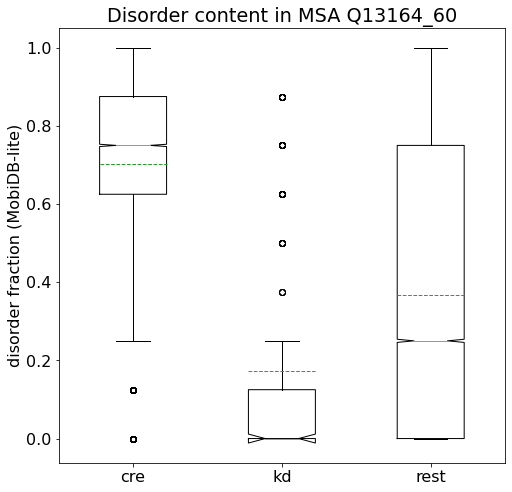

In [66]:
# Plot it
to_plot = {
    'cre': list_scores_cre,
    'kd': list_scores_kd,
    'rest': list_scores_rest
}
fig, ax = plt.subplots(figsize= (8,8))
ax.boxplot(to_plot.values(), notch= True, widths= 0.45, showmeans= True, meanline= True)

ax.set_xticklabels(to_plot.keys())
plt.title(f"Disorder content in MSA {check.msa.unique()[0]}")
plt.ylabel("disorder fraction (MobiDB-lite)")

plt.show()

### Statistics

In [134]:
from scipy import stats
from scipy.stats import shapiro 
from scipy.stats import kstest

In [132]:
# First, check normallity - Shapiro-Wilk Test
shapiro(list_scores_cre)

c:\Users\User\AppData\Local\Programs\Python\Python37\lib\site-packages\scipy\stats\morestats.py:1760: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


ShapiroResult(statistic=0.9286510944366455, pvalue=0.0)

In [133]:
stats.normaltest(list_scores_cre)

NormaltestResult(statistic=1821.149897261141, pvalue=0.0)

In [135]:
kstest(list_scores_cre, 'norm')

KstestResult(statistic=0.6019665217271343, pvalue=0.0)

In [139]:
stats.normaltest(list_scores_rest)

NormaltestResult(statistic=875539.3371231981, pvalue=0.0)

In [138]:
kstest(list_scores_rest, 'norm')

KstestResult(statistic=0.5, pvalue=0.0)

(array([ 154.,  262., 1156., 2170.,    0., 3870., 9349., 5660., 9447.,
        3495.]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 <BarContainer object of 10 artists>)

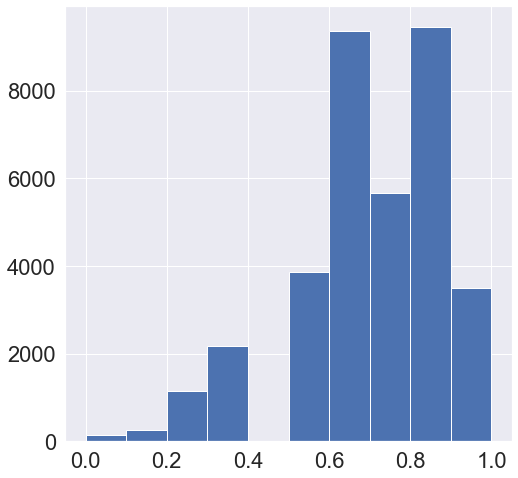

In [178]:
plt.hist(list_scores_cre)

(array([62598., 20860.,  8335.,  5520.,     0.,  5789., 12257., 19150.,
        25870.,  7465.]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 <BarContainer object of 10 artists>)

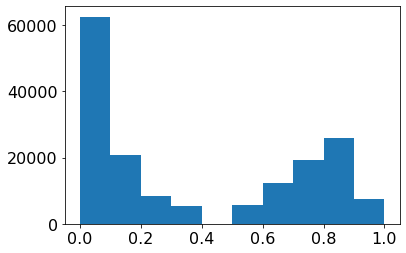

In [140]:
plt.hist(list_scores_rest)

In [117]:
def get_significance(p):
    """Returns the significance of a p-values as a string of stars."""
    if p <= 0.001:
        return '***'
    elif p <= 0.01:
        return '**'
    elif p <= 0.05:
        return '*'
    elif p <= 0.1:
        return '.'
    else:
        return 'ns'

In [130]:
# Unpaired Two-Sample t-Test
statistics, pvalue = stats.ttest_ind(a= list_scores_cre, b= list_scores_rest, alternative= 'two-sided', equal_var=False) # , equal_var=False
print(statistics, pvalue)

237.0386514335173 0.0


In [120]:
get_significance(pvalue)

'***'

### Plot example

In [155]:
import seaborn as sns
from statannotations.Annotator import Annotator

In [67]:
# Dataframe with disorder scores by feature (cre, rest)
# to_plot = {
#     'cre': list_scores_cre,
#     'kd': list_scores_kd,
#     'rest': list_scores_rest
# }

cre_df = pd.DataFrame(list_scores_cre, columns= ['score'])
cre_df["feature"] = "CRE"
kd_df = pd.DataFrame(list_scores_kd, columns= ['score'])
kd_df["feature"] = "KD"
rest_df = pd.DataFrame(list_scores_rest, columns= ['score'])
rest_df["feature"] = "rest"
scores_df = pd.concat([cre_df, kd_df, rest_df])
scores_df

,score,feature
0,0.875,CRE
1,0.750,CRE
2,0.750,CRE
3,0.750,CRE
4,0.750,CRE
...,...,...
85381,0.750,rest
85382,0.625,rest
85383,0.625,rest
85384,0.625,rest


In [154]:
#!pip install statannotations

In [69]:
scores_df.feature.unique()

array(['CRE', 'KD', 'rest'], dtype=object)

In [73]:
from itertools import combinations
comb = combinations(scores_df.feature.unique(), 2)
[ i for i in comb ]

[('CRE', 'KD'), ('CRE', 'rest'), ('KD', 'rest')]

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CRE vs. KD: Mann-Whitney-Wilcoxon test two-sided, P_val:2.330e-134 U_stat=4.809e+06
KD vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:1.384e-17 U_stat=9.010e+06
CRE vs. rest: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=1.138e+09


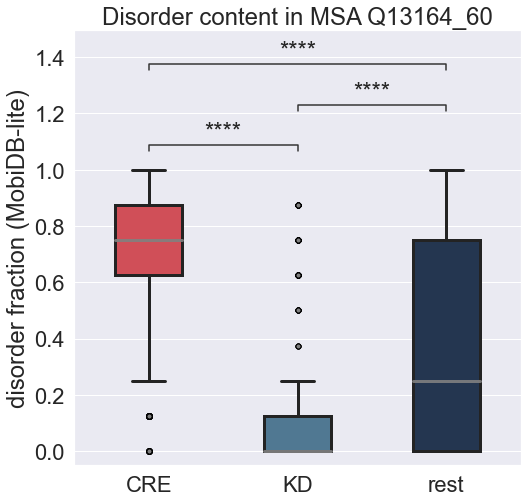

In [74]:
# Boxplots with statistics
# palette: https://coolors.co/palette/e63946-f1faee-a8dadc-457b9d-1d3557
# annotator: https://levelup.gitconnected.com/statistics-on-seaborn-plots-with-statannotations-2bfce0394c00

colors = ["#e63946", "#457b9d", "#1D3557"]
sns.set(rc={'figure.figsize':(8, 8)}, font_scale= 2)

flierprops = dict(marker='o', markerfacecolor='gray', markersize= 5,  markeredgecolor='black')
ax = sns.boxplot(data= scores_df, x= 'feature', y= 'score', width= 0.45, linewidth= 3, medianprops=dict(color="gray", alpha=0.9), palette= colors, flierprops= flierprops) # , notch= True , showmeans= True, meanline= True

# Combinations to compare
comb = combinations(scores_df.feature.unique(), 2)
pairs = [ i for i in comb ]

annotator = Annotator(ax= ax, pairs= pairs, data= scores_df, x= 'feature', y= 'score')
annotator.configure(test= 'Mann-Whitney', text_format='star')
annotator.apply_and_annotate()

#plt.rcParams['font.size'] = 16
plt.title(f"Disorder content in MSA {check.msa.unique()[0]}")
plt.ylabel("disorder fraction (MobiDB-lite)")
plt.xlabel("")
plt.show()

In [152]:
scores_df.feature.unique().tolist()

['CRE', 'rest']